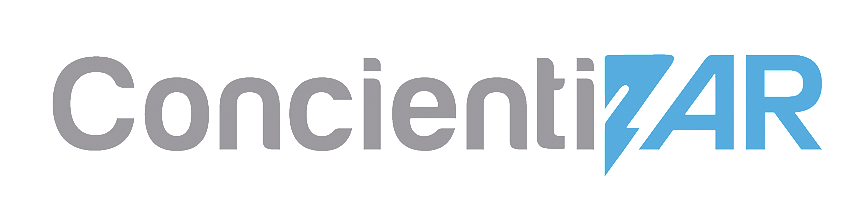
# Mentorias 2022 - M17 - Grupo 1 - Entregable 4

**Integrantes:** Abdala A. - Acosta M. - Ramos M.

Consignas Entrega **26/08.**


Práctico aprendizaje no supervisado, para la aplicación de aprendizaje no supervisado sería interesante realizar una segmentación de la calidad de servicio mediante técnicas de clusterización con las diferentes variables disponibles. Hacer un análisis de los grupos obtenidos que nos permita evaluar cuales son las variables que mejor explican la calidad de servicio. Estas variables podemos utilizarlas en los algoritmos de aprendizaje supervisado para mejorar su calidad de predicción. Podría utilizarse un algoritmo como K Means con algún método de optimización de número de clusters como elbow method.

#Carga de Modulos e Ingesta de Datos

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy
import pandas
import seaborn
import plotly.express as px
import missingno as msno

In [ ]:
#Files
!wget https://raw.githubusercontent.com/concientizar/Diplomatura2022/main/file20201101_mes.zip -O /content/file_mensual.zip
!wget https://raw.githubusercontent.com/agustinabdala/diplodatos/main/00_Mentoria/merged_temperatures_smn.txt -O /content/temperatures_smn.txt

--2022-08-26 16:38:33--  https://raw.githubusercontent.com/concientizar/Diplomatura2022/main/file20201101_mes.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12035448 (11M) [application/zip]
Saving to: ‘/content/file_mensual.zip’

/content/file_mensu 100%[===================>]  11.48M  --.-KB/s    in 0.04s   

2022-08-26 16:38:33 (278 MB/s) - ‘/content/file_mensual.zip’ saved [12035448/12035448]

--2022-08-26 16:38:33--  https://raw.githubusercontent.com/agustinabdala/diplodatos/main/00_Mentoria/merged_temperatures_smn.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP reque

In [ ]:
!unzip -o /content/file_mensual.zip

Archive:  /content/file_mensual.zip
  inflating: file20201101_mes.csv    


##Leemos los archivos CSV

In [ ]:
file_input = "file20201101_mes.csv"
df_1 = pandas.read_csv(file_input)

##Analisis del Df

Como actividad inicial vamos a identificar las columnas del df y el tipo de datos de cada una

In [ ]:
df_1.columns

Index(['Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_Avg', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C', 'Current_UNB_Worst', 'Energy_Acum_Datetime',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A_N', 'Voltage

In [ ]:
df_1.dtypes

Active_Energy_Delivered    float64
Active_Energy_LastDay      float64
Active_Energy_Received     float64
Active_Energy_del_m_rec    float64
Active_Energy_del_p_rec    float64
                            ...   
createdAt                   object
rsrv1                        int64
rsrv2                        int64
rsrv3                        int64
rsrv4                        int64
Length: 62, dtype: object

Contamos el # de Columnas del df

In [ ]:
shape = df_1.shape
  
# Printing Number of columns
print('Number of columns :', shape[1])

Number of columns : 62


Asignamos el formato de datetime a la Columna "CreatedAt"

In [ ]:
#df_1['createdAt'] = df_1['createdAt'].str.replace('T', ' ')
#df_1['createdAt'] = df_1['createdAt'].str.replace('Z', '')
df_1.index = pandas.to_datetime(df_1['createdAt'],infer_datetime_format=True)

Analizamos los 5 primeros y ultimos datos del df para comenzar a familiarizarnos con los datos del dataset

In [ ]:
pandas.set_option('display.max_columns', None)
df_1.head()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-30 00:00:12.342000+00:00,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.31,0.94,3.25,138069.09,906.87,4,2.36,0.37,0.97,3.48,10.18,0,1.56,4.19,13,6.40,2,1,2,0,0,50.04,0.85,0.82,1.03,0.93,83686.04,156.42,83529.62,83842.46,1.25,0.22,-0.22,1.24,43.09,380,231.71,391,231.29,383,231.40,380,231.47,30,12,23,15,26,15,12,5,2020-11-30T00:00:12.342Z,0,0,0,0
2020-11-30 00:00:22.759000+00:00,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.11,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.46,1.25,0.20,-0.22,1.23,42.48,380,231.67,391,231.16,383,231.36,380,231.40,30,12,23,15,26,15,12,5,2020-11-30T00:00:22.759Z,0,0,0,0
2020-11-30 00:00:39.117000+00:00,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.12,906.87,4,2.36,0.36,0.97,3.47,10.18,0,1.60,4.19,13,6.41,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.47,1.25,0.20,-0.22,1.23,42.78,380,231.77,391,231.28,383,231.48,380,231.51,30,12,23,15,26,15,12,5,2020-11-30T00:00:39.117Z,0,0,0,0
2020-11-30 00:00:48.160000+00:00,106852.32,3.81,362.77,106489.55,107215.09,2.00,0.30,0.94,3.25,138069.14,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.05,156.42,83529.64,83842.47,1.25,0.21,-0.22,1.23,43.09,380,231.84,391,231.39,383,231.53,380,231.59,30,12,23,15,26,15,12,5,2020-11-30T00:00:48.160Z,0,0,0,0
2020-11-30 00:00:58.693000+00:00,106852.33,3.81,362.77,106489.55,107215.10,1.81,0.29,0.94,3.05,138069.14,906.87,4,2.06,0.36,0.97,3.19,8.86,0,1.56,4.19,13,5.22,2,1,2,0,0,50.04,0.88,0.82,1.03,0.95,83686.05,156.42,83529.64,83842.48,0.98,0.20,-0.22,0.95,43.09,380,232.03,391,231.38,383,231.35,380,231.59,30,12,23,15,26,15,12,5,2020-11-30T00:00:58.693Z,0,0,0,0


In [ ]:
df_1.tail()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-01 23:58:06.425000+00:00,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.8,2.95,122900.67,906.69,4,1.95,0.38,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.2,-0.45,0.42,42.48,380,235.46,391,234.58,383,234.72,380,234.92,30,12,23,15,26,15,12,5,2020-11-01T23:58:06.425Z,0,0,0,0
2020-11-01 23:58:18.775000+00:00,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.8,2.95,122900.68,906.69,4,1.95,0.38,0.92,2.98,8.28,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.2,-0.45,0.42,41.87,380,235.48,391,234.62,383,234.79,380,234.96,30,12,23,15,26,15,12,5,2020-11-01T23:58:18.775Z,0,0,0,0
2020-11-01 23:58:29.311000+00:00,95656.47,3.77,362.76,95293.71,96019.23,1.83,0.32,0.8,2.95,122900.69,906.69,4,1.95,0.37,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.2,-0.45,0.42,42.17,380,235.44,391,234.57,383,234.71,380,234.91,30,12,23,15,26,15,12,5,2020-11-01T23:58:29.311Z,0,0,0,0
2020-11-01 23:59:02.412000+00:00,95656.49,3.77,362.76,95293.73,96019.26,1.83,0.32,0.8,2.95,122900.71,906.69,4,1.95,0.38,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.99,0.94,0.84,1.13,0.99,73786.62,154.33,73632.29,73940.95,0.67,0.2,-0.45,0.42,42.48,380,235.49,391,234.59,383,234.65,380,234.91,30,12,23,15,26,15,12,5,2020-11-01T23:59:02.412Z,0,0,0,0
2020-11-01 23:59:35.683000+00:00,95656.52,3.77,362.76,95293.77,96019.28,1.83,0.32,0.8,2.95,122900.74,906.69,4,1.95,0.38,0.92,2.98,8.28,0,1.61,3.91,13,4.91,2,1,2,0,0,50.00,0.94,0.84,1.13,0.99,73786.62,154.33,73632.29,73940.96,0.67,0.2,-0.45,0.42,42.48,380,235.35,391,234.46,383,234.54,380,234.78,30,12,23,15,26,15,12,5,2020-11-01T23:59:35.683Z,0,0,0,0


Realizamos un vistazo a las columnas de Corriente Y Potencias por Fase

In [ ]:
df_1[['Current_A','Current_B','Current_C','Current_N','Current_G','Current_Avg','Active_Power_A','Active_Power_B','Active_Power_C','Active_Power_Total']].describe()

,Current_A,Current_B,Current_C,Current_N,Current_G,Current_Avg,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total
count,212236.000000,212236.000000,212236.000000,212236.000000,212236.0,212236.0,212236.000000,212236.000000,212236.000000,212236.000000
mean,36.558676,26.102234,26.105825,13.312425,13.0,0.0,6.356606,4.269859,4.256250,14.882748
std,44.890259,42.311257,40.590581,8.683844,0.0,0.0,7.201076,6.775799,6.220009,20.136581
min,3.730000,1.480000,0.520000,1.470000,13.0,0.0,0.640000,0.280000,0.090000,1.050000
25%,10.200000,1.910000,3.860000,6.940000,13.0,0.0,2.020000,0.350000,0.800000,3.350000
50%,13.190000,2.410000,4.360000,9.770000,13.0,0.0,2.720000,0.440000,0.990000,4.290000
75%,33.742500,26.160000,21.480000,18.440000,13.0,0.0,6.460000,4.900000,3.630000,14.800000
max,240.400000,219.060000,208.780000,56.910000,13.0,0.0,37.840000,34.070000,33.200000,104.980000


Las variables **Current_G y Current AVG** poseen valores constantes que no serian significativos para nuestro análisis. Un estudio más detallado del comportamiento de este datapoint es necesario para ver si es completamente descartado.

###Detección las variables con valor cero del dataset

1.   Elemento de lista

      Verificamos la cantidad de valores cero en cada una de las columnas

In [ ]:
#Columnas con valores 0
cols = df_1[df_1 == 0].count(axis=0)
cols[cols > 0]

Current_Avg             212236
Current_UNB_Worst       212236
Energy_Acum_Datetime    212236
Reactive_Power_Total        58
rsrv1                   212236
rsrv2                   212236
rsrv3                   212236
rsrv4                   212236
dtype: int64


###Reconocimiento de datos faltantes




In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 212236 entries, 2020-11-30 00:00:12.342000+00:00 to 2020-11-01 23:59:35.683000+00:00
Data columns (total 62 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Active_Energy_Delivered    212236 non-null  float64
 1   Active_Energy_LastDay      212236 non-null  float64
 2   Active_Energy_Received     212236 non-null  float64
 3   Active_Energy_del_m_rec    212236 non-null  float64
 4   Active_Energy_del_p_rec    212236 non-null  float64
 5   Active_Power_A             212236 non-null  float64
 6   Active_Power_B             212236 non-null  float64
 7   Active_Power_C             212236 non-null  float64
 8   Active_Power_Total         212236 non-null  float64
 9   Apparent_Energy_Delivered  212236 non-null  float64
 10  Apparent_Energy_Received   212236 non-null  float64
 11  Apparent_Energy_del_p_rec  212236 non-null  int64  
 12  Apparent_Power_A          

In [ ]:
missing_values_count = df_1.isna().sum()
missing_values_count

Active_Energy_Delivered    0
Active_Energy_LastDay      0
Active_Energy_Received     0
Active_Energy_del_m_rec    0
Active_Energy_del_p_rec    0
                          ..
createdAt                  0
rsrv1                      0
rsrv2                      0
rsrv3                      0
rsrv4                      0
Length: 62, dtype: int64

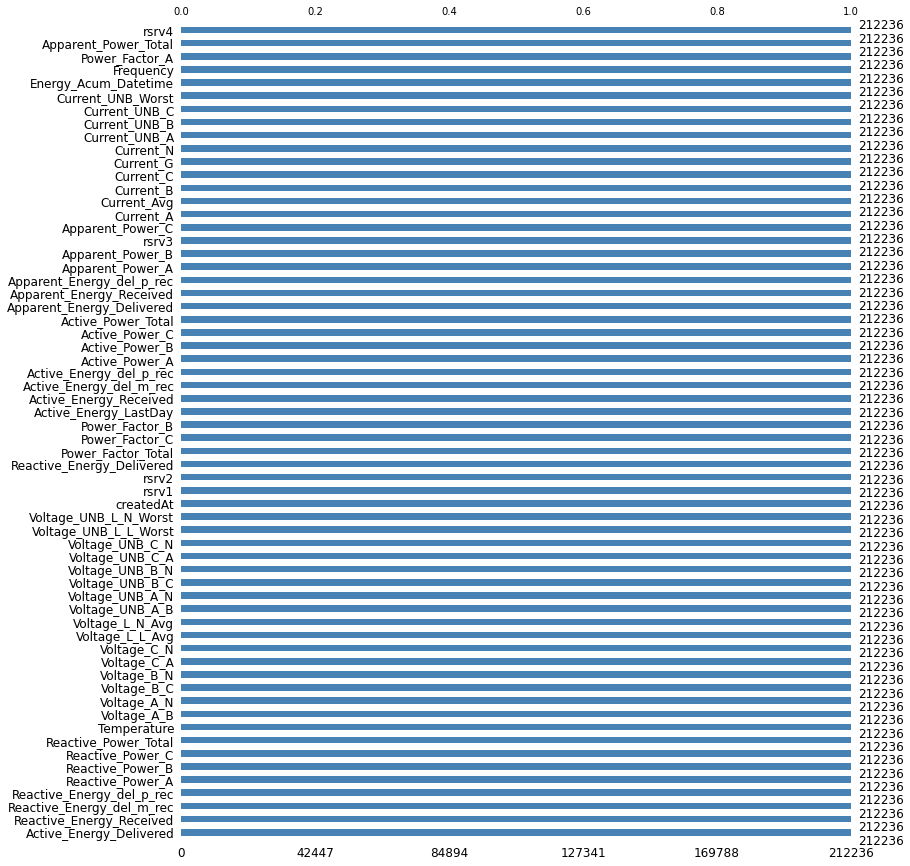

In [ ]:
msno.bar(df_1,figsize=(12, 15), sort="ascending",fontsize=12, color='steelblue')

### GROUP BY

In [ ]:
# Hour - mean
df_1_groupby_hour = df_1.groupby(pandas.Grouper(freq='H')).mean()
df_1_groupby_hour.head()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-01 00:00:00+00:00,95581.195863,3.877883,362.76,95218.438795,95943.953029,2.681824,0.309055,0.947752,3.937590,122818.788567,906.69,4.0,2.832541,0.367655,1.030000,3.951987,12.359805,0.0,1.606091,4.426156,13.0,8.512801,2.0,1.0,2.0,0.0,0.0,50.040423,0.943420,1.158143,1.090489,0.997459,73759.556710,154.280000,73605.279577,73913.832736,0.883420,-0.197752,-0.392476,0.293029,41.503062,380.0,230.171303,391.0,230.410065,383.0,230.682117,380.0,230.421433,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 01:00:00+00:00,95585.030839,3.757871,362.76,95222.274387,95947.787742,2.244065,0.338548,1.027258,3.612387,122822.644484,906.69,4.0,2.370871,0.399516,1.071806,3.642452,10.219516,0.0,1.725065,4.619903,13.0,6.496710,2.0,1.0,2.0,0.0,0.0,50.041226,0.943903,1.059452,1.046032,0.991613,73759.870935,154.287935,73605.585516,73914.158129,0.721129,-0.054516,-0.291871,0.371387,40.672871,380.0,232.214677,391.0,231.873903,383.0,231.852258,380.0,231.980226,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 02:00:00+00:00,95588.659649,3.556581,362.76,95225.902620,95951.416613,2.307859,0.318658,0.982939,3.611438,122826.294377,906.69,4.0,2.403802,0.382556,1.056102,3.626550,10.400767,0.0,1.659489,4.502907,13.0,6.739105,2.0,1.0,2.0,0.0,0.0,50.022971,0.956837,1.118051,1.073610,0.997157,73760.165367,154.291629,73605.873227,73914.456070,0.641821,-0.142620,-0.353546,0.144026,39.917891,380.0,231.688339,391.0,231.458786,383.0,231.570351,380.0,231.572716,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 03:00:00+00:00,95592.827138,4.472315,362.76,95230.070482,95955.583987,2.655981,0.507331,1.166624,4.329807,122830.723601,906.69,4.0,2.916913,0.667074,1.214373,4.652315,12.632797,0.0,2.882283,5.205788,13.0,7.542379,2.0,1.0,2.0,0.0,0.0,50.018907,0.918521,0.952251,1.012219,0.944887,73761.238617,154.312605,73606.927074,73915.550932,1.114084,0.213087,-0.027685,1.301286,39.141768,380.0,231.725466,391.0,231.743376,383.0,232.084823,380.0,231.851350,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 04:00:00+00:00,95596.590097,3.559416,362.76,95233.833571,95959.347175,2.299870,0.331169,1.012403,3.644805,122834.564448,906.69,4.0,2.452110,0.392857,1.079091,3.680779,10.591039,0.0,1.690974,4.620000,13.0,6.878766,2.0,1.0,2.0,0.0,0.0,50.025812,0.938409,1.095130,1.065455,0.990877,73761.657045,154.325877,73607.331429,73915.983279,0.801136,-0.113831,-0.346688,0.340519,38.500260,380.0,232.490617,391.0,232.338182,383.0,232.570682,380.0,232.466266,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0


In [ ]:
# Minute - mean
df_1_groupby_minute_mean = df_1.groupby(pandas.Grouper(freq='MIN')).mean()
df_1_groupby_minute_mean.head()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-01 00:00:00+00:00,95579.344,3.866,362.76,95216.588,95942.098,2.356,0.300,0.93,3.590,122816.924,906.69,4.0,2.594,0.360,0.97,3.638,11.342,0.0,1.566,4.250,13.0,7.722,2.0,1.0,2.0,0.0,0.0,50.032,0.906,1.156,1.05,0.984,73759.396,154.28,73605.120,73913.674,1.074,-0.190,-0.29,0.584,41.806,380.0,228.712,391.0,228.692,383.0,228.984,380.0,228.796,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 00:01:00+00:00,95579.396,3.970,362.76,95216.638,95942.150,2.102,0.300,0.93,3.336,122816.980,906.69,4.0,2.370,0.360,0.97,3.390,10.348,0.0,1.568,4.250,13.0,6.750,2.0,1.0,2.0,0.0,0.0,50.032,0.890,1.158,1.05,0.980,73759.408,154.28,73605.124,73913.684,1.090,-0.190,-0.29,0.604,41.930,380.0,229.030,391.0,228.686,383.0,229.022,380.0,228.912,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 00:02:00+00:00,95579.448,3.970,362.76,95216.692,95942.210,2.100,0.300,0.93,3.334,122817.032,906.69,4.0,2.370,0.360,0.97,3.390,11.198,0.0,2.002,4.582,13.0,7.020,2.0,1.0,2.0,0.0,0.0,50.044,0.890,1.158,1.05,0.980,73759.416,154.28,73605.138,73913.696,1.090,-0.190,-0.29,0.602,41.866,380.0,229.000,391.0,228.706,383.0,229.104,380.0,228.938,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 00:03:00+00:00,95579.504,3.970,362.76,95216.746,95942.260,2.042,0.304,0.93,3.282,122817.090,906.69,4.0,2.276,0.364,0.97,3.320,10.048,0.0,1.574,4.244,13.0,6.488,2.0,1.0,2.0,0.0,0.0,50.052,0.900,1.156,1.05,0.986,73759.426,154.28,73605.152,73913.704,0.996,-0.194,-0.29,0.510,41.990,380.0,229.382,391.0,228.974,383.0,229.316,380.0,229.226,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0
2020-11-01 00:04:00+00:00,95579.568,3.970,362.76,95216.802,95942.320,1.894,0.310,0.93,3.134,122817.144,906.69,4.0,2.034,0.370,0.97,3.144,8.850,0.0,1.604,4.248,13.0,5.422,2.0,1.0,2.0,0.0,0.0,50.074,0.930,1.150,1.05,1.000,73759.436,154.28,73605.160,73913.710,0.744,-0.198,-0.29,0.254,41.928,380.0,229.580,391.0,228.982,383.0,229.116,380.0,229.226,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0


In [ ]:
# Minute - MAX
df_1_groupby_minute_max = df_1.groupby(pandas.Grouper(freq='MIN')).max()
df_1_groupby_minute_max.head()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-01 00:00:00+00:00,95579.37,3.97,362.76,95216.61,95942.12,2.73,0.30,0.93,3.97,122816.95,906.69,4.0,2.93,0.36,0.97,4.01,12.83,0.0,1.57,4.25,13.0,9.17,2.0,1.0,2.0,0.0,0.0,50.04,0.93,1.16,1.05,0.99,73759.40,154.28,73605.12,73913.68,1.09,-0.19,-0.29,0.60,42.17,380.0,228.99,391.0,228.76,383.0,229.01,380.0,228.89,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-01T00:00:58.066Z,0.0,0.0,0.0,0.0
2020-11-01 00:01:00+00:00,95579.41,3.97,362.76,95216.66,95942.18,2.11,0.30,0.93,3.34,122817.00,906.69,4.0,2.37,0.36,0.97,3.39,10.35,0.0,1.57,4.25,13.0,6.75,2.0,1.0,2.0,0.0,0.0,50.04,0.89,1.16,1.05,0.98,73759.41,154.28,73605.13,73913.69,1.09,-0.19,-0.29,0.61,42.17,380.0,229.06,391.0,228.73,383.0,229.07,380.0,228.95,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-01T00:01:52.368Z,0.0,0.0,0.0,0.0
2020-11-01 00:02:00+00:00,95579.47,3.97,362.76,95216.72,95942.23,2.10,0.30,0.93,3.34,122817.05,906.69,4.0,2.37,0.36,0.97,3.39,14.62,0.0,3.74,5.91,13.0,8.12,2.0,1.0,2.0,0.0,0.0,50.05,0.89,1.16,1.05,0.98,73759.42,154.28,73605.15,73913.70,1.09,-0.19,-0.29,0.61,42.17,380.0,229.13,391.0,228.76,383.0,229.12,380.0,229.00,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-01T00:02:52.129Z,0.0,0.0,0.0,0.0
2020-11-01 00:03:00+00:00,95579.54,3.97,362.76,95216.77,95942.29,2.10,0.31,0.93,3.34,122817.11,906.69,4.0,2.37,0.37,0.97,3.39,10.34,0.0,1.60,4.25,13.0,6.75,2.0,1.0,2.0,0.0,0.0,50.06,0.93,1.16,1.05,1.00,73759.43,154.28,73605.16,73913.71,1.09,-0.19,-0.29,0.61,42.17,380.0,229.68,391.0,229.06,383.0,229.43,380.0,229.32,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-01T00:03:58.955Z,0.0,0.0,0.0,0.0
2020-11-01 00:04:00+00:00,95579.59,3.97,362.76,95216.82,95942.34,1.90,0.31,0.93,3.14,122817.17,906.69,4.0,2.04,0.37,0.97,3.15,8.85,0.0,1.61,4.25,13.0,5.43,2.0,1.0,2.0,0.0,0.0,50.08,0.93,1.15,1.05,1.00,73759.44,154.28,73605.16,73913.71,0.75,-0.19,-0.29,0.26,42.17,380.0,229.63,391.0,229.02,383.0,229.16,380.0,229.27,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-01T00:04:53.571Z,0.0,0.0,0.0,0.0


###Cantidad de registros por hora

Analizamos las cantidad de Registros por Hora para identificar posibles perdidas de comunicacion con el sensor que puedan afectar nuestro análisis

In [ ]:
#Contar registros por cada hora
df_1['Hour'] = df_1.index.hour
# shift column 'Hour' to first position
first_column = df_1.pop('Hour')
  
# insert column using insert(position,column_name,
# first_column) function
df_1.insert(0, 'Hour', first_column)

hour_counts = df_1['Hour'].value_counts().sort_index()
hour_counts

0     9337
1     9330
2     9331
3     9336
4     9347
5     9338
6     9285
7     8820
8     7263
9     7214
10    7628
11    8194
12    8319
13    8603
14    9043
15    8602
16    8402
17    9076
18    9199
19    9316
20    9326
21    9308
22    9305
23    9314
Name: Hour, dtype: int64

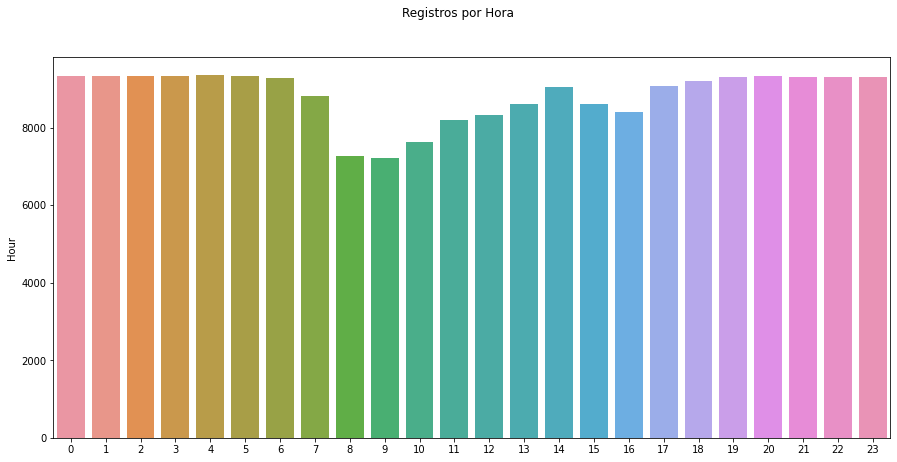

In [ ]:
fig = plt.figure(figsize=(15,7)).suptitle("Registros por Hora")
seaborn.barplot( x=hour_counts.index, y=hour_counts)

Observamos que a las 8 de la manana se podruce un signaficativo descenso registros. 
Otro dato relevante es que durante la noche desde 21 a 23 se generan más registros que de 0 a 7. Hasta este momento no podemos determionar el motivo de este decenso.

**Cómo afecta a nuestro dataset la basa de registros en horarios críticos como son las 8 , 11, 12 y 16 en los que la planta se ecnuentra en plena producción?** 

# Análisis por puntos de Factor de Potencia Total

La medición del consumo de energía eléctrica implica la medición de las potencias activa 
(kW), la potencia reactiva (kVAr) y la suma vectorial de estas dos denominada potencia 
aparente (kVA). La potencia Activa es la que se convierte en trabajo útil mientras que la 
potencia reactiva es la que se requiere para el funcionamiento de ciertos artefactos como 
motores, bobinas, etc.

La potencia reactiva implica un costo para las empresas distribuidoras, transportadoras de 
energía eléctrica por lo que estas penalizan su uso por sobre un factor adimensional denominado Cosφ. 
Debido a que los diferentes artefactos presentes en una instalación industrial necesitan la potencia reactiva para su funcionamiento, es necesario instalar bancos de capacitores (automáticos o manuales) que compensen el cosφ para mantenerlo dentro de los limites establecidos por la distribuidora electrica.  

En Córdoba EPEC realiza mediciones de la Energia suministrada y penaliza a los consumidores industriales con Cosφ menos a 0.95. Por este motivo el analisis de estos puntos cobra signitficattiva importancia. 

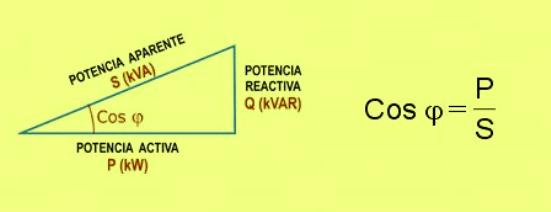

La formulación para las potencias es la siguiente:

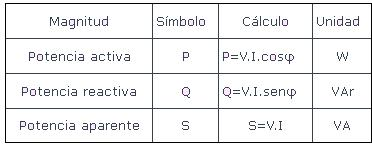

Text(0.5, 0.98, 'Potencia Activa Total')

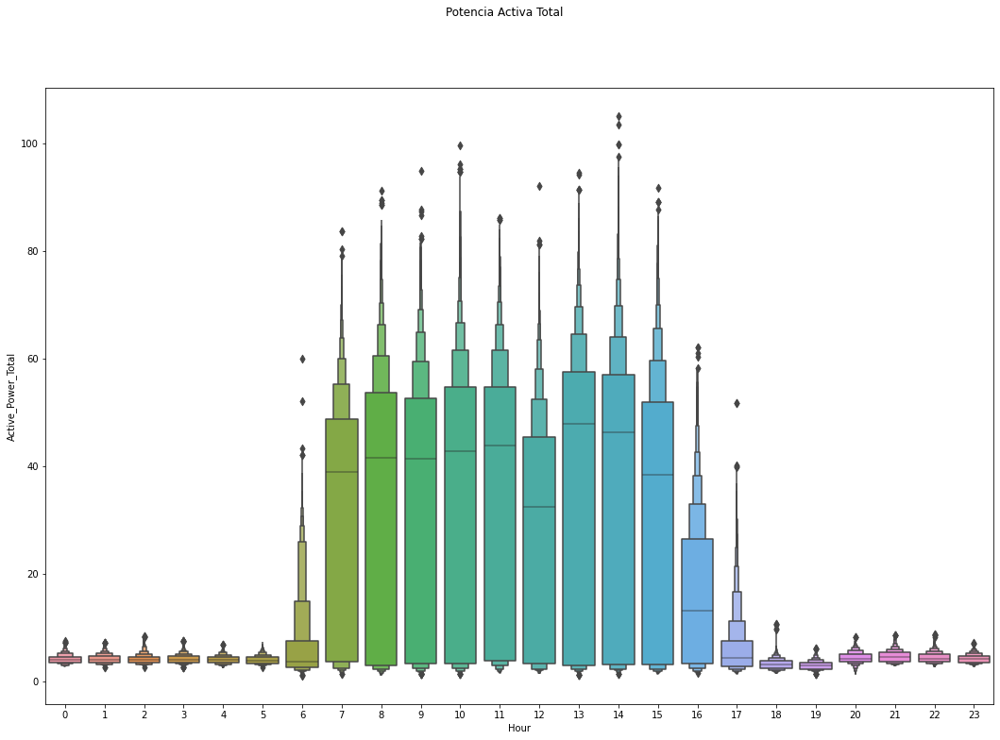

In [ ]:
fig = plt.figure(figsize=(18, 12))
seaborn.boxenplot(data = df_1, x = 'Hour', y = 'Active_Power_Total')
fig.suptitle('Potencia Activa Total')

In [ ]:
df_1['Power_Factor_Total'].max(), df_1['Power_Factor_Total'].min()

(1.01, 0.35)

Text(0.5, 0.98, 'Factor de Potencia Total - CosΦ')

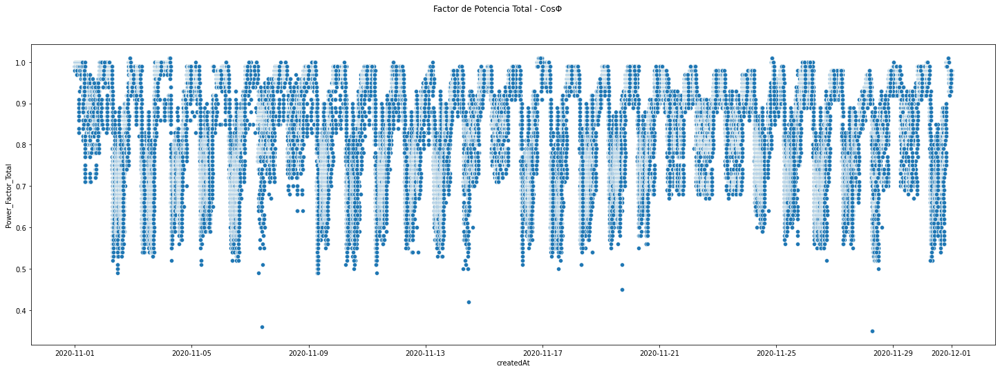

In [ ]:
fig = plt.figure(figsize=(25,8))
seaborn.scatterplot(data=df_1, y='Power_Factor_Total', x=df_1.index)
fig.suptitle('Factor de Potencia Total - CosΦ')

Desfazando potenciia para comparacion entre semanas

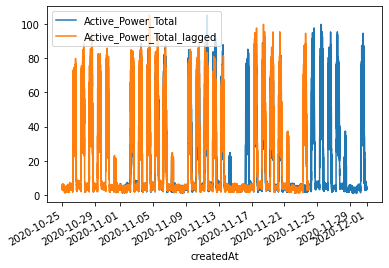

In [ ]:
df_1["Active_Power_Total"].plot(legend=True)
shifted = df_1["Active_Power_Total"].shift(periods=-7, freq="D").plot(legend=True)
shifted.legend(['Active_Power_Total','Active_Power_Total_lagged'])
plt.show()

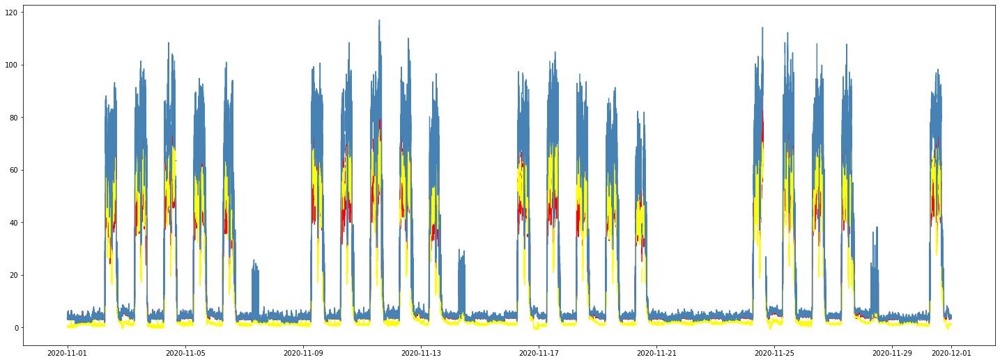

In [ ]:
fig, ax1 = plt.subplots(figsize=(25, 9))
ax1.plot( df_1_groupby_minute_mean["Active_Power_Total"], color="red")
ax1.plot( df_1_groupby_minute_mean["Reactive_Power_Total"],  color="yellow")
ax1.plot(df_1_groupby_minute_mean["Apparent_Power_Total"], color="steelblue")
#ax1.plot(df_1_groupby_minute_mean["Power_Factor_Total"], "black")
plt.show()

Este grafico pone en evidencia que los dias sabados hubieron consumos en en fase C, esto se corresponderia con trabajo de proveedores. Ademas evidencia que el dia lunes 23/11 no hubo producción, este dia fue no laborable dado que fue feriado nacional por el Dia de la Soberania Nacional.

Vistazo en detalle a la Columna de Factor de Potencia Total y por Fases

In [ ]:
df_1[['Power_Factor_Total','Power_Factor_A','Power_Factor_B','Power_Factor_C']].describe()

,Power_Factor_Total,Power_Factor_A,Power_Factor_B,Power_Factor_C
count,212236.000000,212236.000000,212236.000000,212236.000000
mean,0.853247,0.829017,0.804989,0.907259
std,0.113917,0.100774,0.121508,0.158908
min,0.350000,0.370000,0.320000,0.250000
25%,0.760000,0.750000,0.760000,0.790000
50%,0.880000,0.850000,0.800000,0.970000
75%,0.960000,0.910000,0.820000,1.030000
max,1.010000,0.990000,1.460000,1.600000


Podemos Identificar valores por sobre 1 en la columnas Total - B - C. Debemos definir si estos valores son tratados como Outliers

In [ ]:
"""
df_1.index.name = None
# df_2.index.name = None
merged_df = df_1.merge(df_2.rename(columns={
  'Power_Factor':'Power_Factor_Total',
  #'Voltage': ,
  #'Current' : , 
  'Active_Power': 'Active_Power_Total',
  'Apparent_Power': 'Apparent_Power_Total',
  'Reactive_Power':'Reactive_Power_Total',
  'Power_Factor': 'Power_Factor_Total',
  #'Phase_angle', 'Frequency', 'Fordward_Energy','Reverse_Energy', 'Abs_Energy', 'Ind_Energy','Cap_Energy', 'Abs_Reactive_Energy'
  
  }),how='outer')
merged_df.index = pandas.to_datetime(merged_df['createdAt'],infer_datetime_format=True)
merged_df.head()
"""

"\ndf_1.index.name = None\n# df_2.index.name = None\nmerged_df = df_1.merge(df_2.rename(columns={\n  'Power_Factor':'Power_Factor_Total',\n  #'Voltage': ,\n  #'Current' : , \n  'Active_Power': 'Active_Power_Total',\n  'Apparent_Power': 'Apparent_Power_Total',\n  'Reactive_Power':'Reactive_Power_Total',\n  'Power_Factor': 'Power_Factor_Total',\n  #'Phase_angle', 'Frequency', 'Fordward_Energy','Reverse_Energy', 'Abs_Energy', 'Ind_Energy','Cap_Energy', 'Abs_Reactive_Energy'\n  \n  }),how='outer')\nmerged_df.index = pandas.to_datetime(merged_df['createdAt'],infer_datetime_format=True)\nmerged_df.head()\n"

Para comprender mejor las posibles desviaciones debemos contrastar el factor de potencia de cada fase por separado

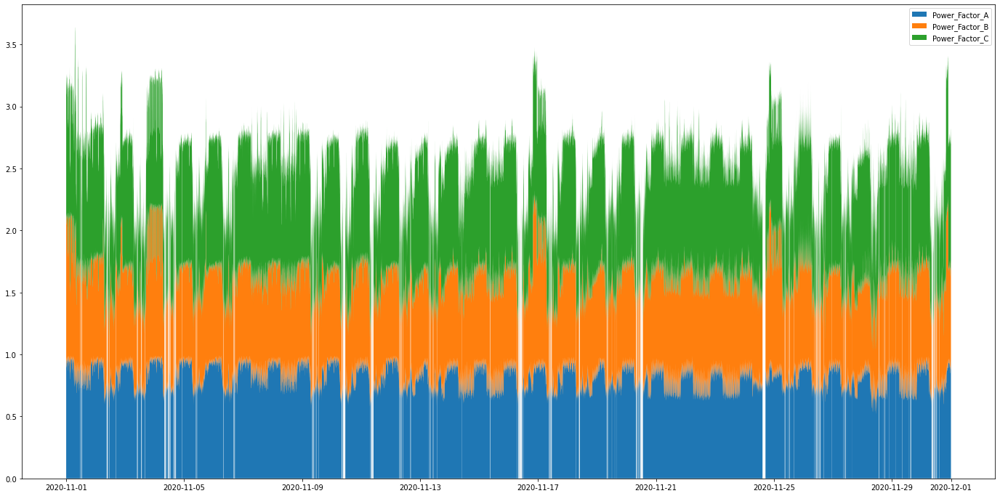

In [ ]:
#library
import numpy as np
import matplotlib.pyplot as plt
df_2 = pandas.read_csv(file_input)
plt.figure(figsize=(24, 12))
# Create data
#x=range(1,200)
x=df_1_groupby_minute_mean.index
y1=df_1_groupby_minute_mean['Power_Factor_A']
y2=df_1_groupby_minute_mean['Power_Factor_B']
y3=df_1_groupby_minute_mean['Power_Factor_C']
# Basic stacked area chart.
plt.stackplot(x, y1, y2, y3,  labels=['Power_Factor_A','Power_Factor_B','Power_Factor_C'])
plt.legend(loc='upper right')


Del gráfico anterior podemos estimar que los factores de potencia por fase se encuentran desbalanceados, seguramente porque en la instalación existe un banco de capacitores general.
Los picos y valles fuera del horario laboral hacen suponer que poseen cargas inductivas (seguramente luminarias tipo LED) que generan estos cambios bruscos.

También se puede ver que sobre la fase C existe un gran ruido durante el horario de producción, probablemente por gran cantidad de fuentes tipo switching conectadas a esta fase.

# Análisis de Voltaje por Fases

Se graficara el voltaje en el tiempo de las tres fases para conocer como es su comportamiento en el tiempo

Text(0.5, 1.0, 'Voltage_C_N')

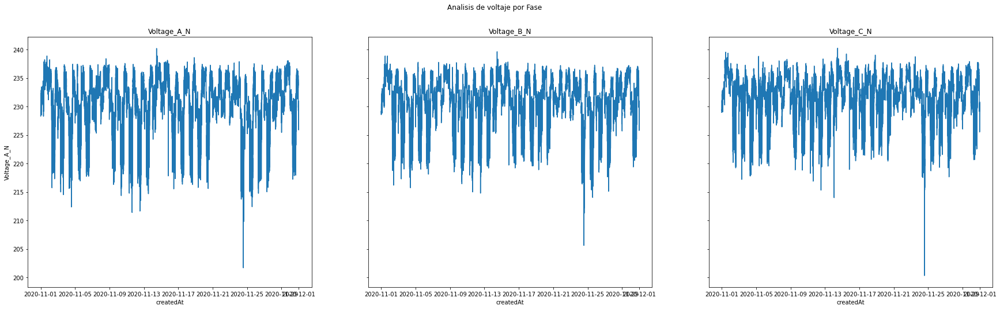

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(30,8), sharey=True)
fig.suptitle('Analisis de voltaje por Fase')

seaborn.lineplot(data=df_1,  ax=axes[0], x=df_1.index, y="Voltage_A_N")
axes[0].set_title('Voltage_A_N')

seaborn.lineplot(data=df_1,  ax=axes[1], x=df_1.index, y="Voltage_B_N")
axes[1].set_title('Voltage_B_N')

seaborn.lineplot(data=df_1,  ax=axes[2], x=df_1.index, y="Voltage_C_N")
axes[2].set_title('Voltage_C_N')


Se puede ver de esto que el voltaje no presenta una gran variabilidad y se puede considerar que se mantiene constante en el tiempo, por tanto la potencia y el factor dependencia seran dependientes de la variación de la corriente

# Análisis de Corriente por Fases

De manera de comenzar a determinar las posibles causas de los problemas del factor de Potencia, debemos realizar un analisis de los consumos por fases que nos permitan entender posibles desviaciones que esten afectando al cos phi general.

Basándonos en conceptos básicos de electricidad analizaremos las curvas de corrientes ya que son las que tienen mayor variabilidad. Por ahora podemos estimar el Voltaje constante aunque sabemos que no lo es 100%.

Text(0.5, 1.0, 'Current_C')

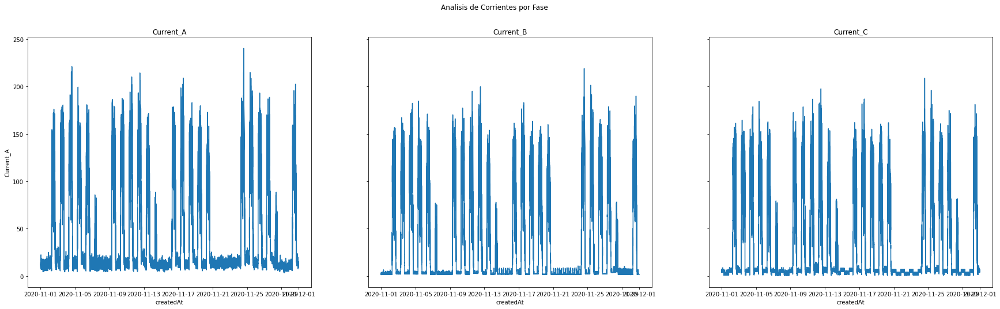

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(30,8), sharey=True)
fig.suptitle('Analisis de Corrientes por Fase')

seaborn.lineplot(data=df_1,  ax=axes[0], x=df_1.index, y="Current_A")
axes[0].set_title('Current_A')

seaborn.lineplot(data=df_1,  ax=axes[1], x=df_1.index, y="Current_B")
axes[1].set_title('Current_B')

seaborn.lineplot(data=df_1,  ax=axes[2], x=df_1.index, y="Current_C")
axes[2].set_title('Current_C')


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

(0.0, 200.0, 0.0, 0.15851646969190614)

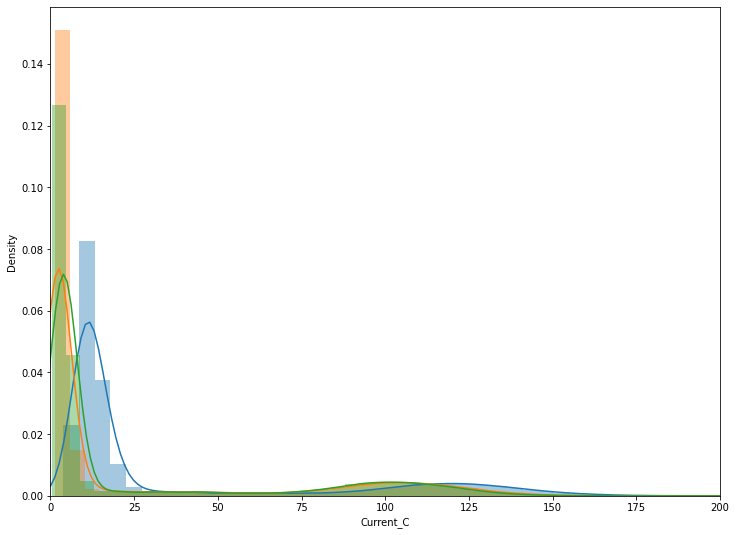

In [ ]:
f,ax=plt.subplots(figsize=(12, 9))
seaborn.distplot(df_1['Current_A']).axis(xmin=0,xmax=200)
seaborn.distplot(df_1['Current_B']).axis(xmin=0,xmax=200)
seaborn.distplot(df_1['Current_C']).axis(xmin=0,xmax=200)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

Text(0.5, 1.0, 'Current_C')

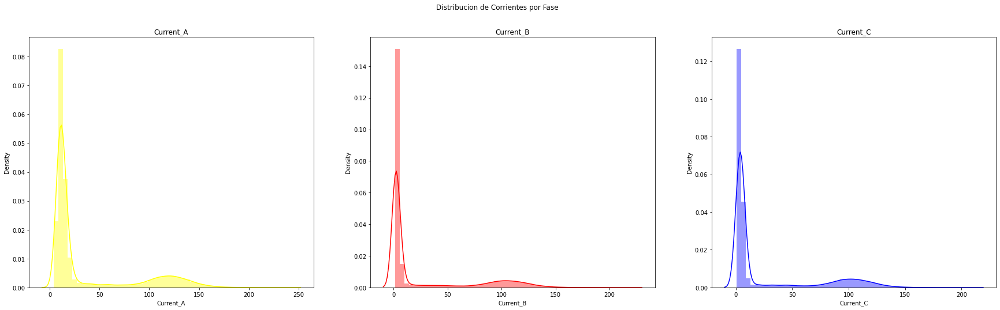

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(30,8))
fig.suptitle('Distribucion de Corrientes por Fase')

seaborn.distplot(df_1['Current_A'],ax=axes[0], color='yellow')
axes[0].set_title('Current_A')

seaborn.distplot(df_1['Current_B'],ax=axes[1],color='red')
axes[1].set_title('Current_B')

seaborn.distplot(df_1['Current_C'],ax=axes[2], color='blue')
axes[2].set_title('Current_C')

In [ ]:
df_1_currents_max = df_1_groupby_minute_max[['Current_A', 'Current_B', 'Current_C', 'Current_N']]
df_1_currents_max.head()

,Current_A,Current_B,Current_C,Current_N
createdAt,,,,
2020-11-01 00:00:00+00:00,12.83,1.57,4.25,9.17
2020-11-01 00:01:00+00:00,10.35,1.57,4.25,6.75
2020-11-01 00:02:00+00:00,14.62,3.74,5.91,8.12
2020-11-01 00:03:00+00:00,10.34,1.60,4.25,6.75
2020-11-01 00:04:00+00:00,8.85,1.61,4.25,5.43


In [ ]:
work_shift_filter = df_1_currents_max.loc[(df_1_currents_max.index.hour > 6)
                                                         & (df_1_currents_max.index.hour < 18)]
work_shift_filter

,Current_A,Current_B,Current_C,Current_N
createdAt,,,,
2020-11-01 07:00:00+00:00,9.36,1.97,0.95,8.45
2020-11-01 07:01:00+00:00,9.34,1.96,0.95,8.44
2020-11-01 07:02:00+00:00,9.39,1.96,0.95,8.47
2020-11-01 07:03:00+00:00,7.13,1.61,0.95,7.10
2020-11-01 07:04:00+00:00,7.13,1.61,0.96,7.09
...,...,...,...,...
2020-11-30 17:55:00+00:00,32.34,19.60,18.91,14.37
2020-11-30 17:56:00+00:00,32.30,19.59,18.69,14.81
2020-11-30 17:57:00+00:00,42.67,31.36,30.09,14.80


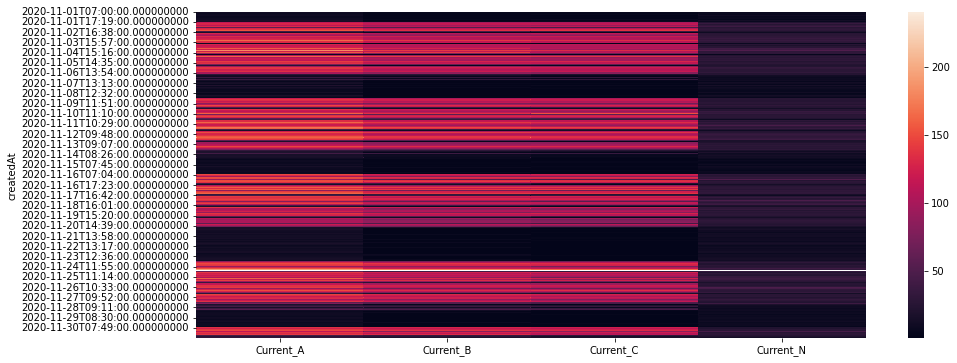

In [ ]:
fig = plt.figure(figsize=(15,6))
ax = seaborn.heatmap(work_shift_filter)

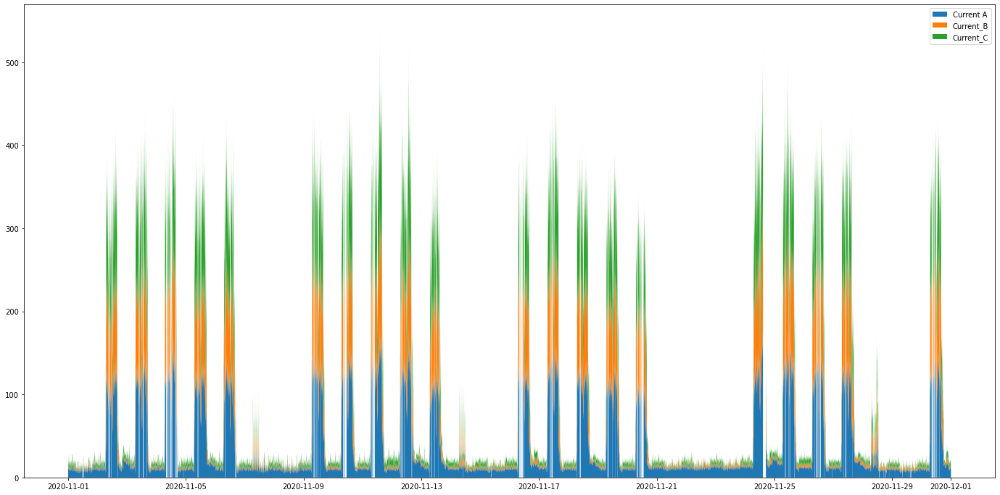

In [ ]:
#library
import numpy as np
import matplotlib.pyplot as plt
#df_2 = pandas.read_csv(url1)
plt.figure(figsize=(24, 12))
# Create data
#x=range(1,200)
x=df_1_groupby_minute_mean.index
y1=df_1_groupby_minute_mean['Current_A']
y2=df_1_groupby_minute_mean['Current_B']
y3=df_1_groupby_minute_mean['Current_C']

# Basic stacked area chart.
plt.stackplot(x, y1, y2, y3,  labels=['Current A','Current_B','Current_C'])
plt.legend(loc='upper right')


En el grafico anterior podemos ver que en los horarios de menor consumo la mayor corriente es la corriente A, por lo que se podria inferir que el sistema luminico de la empresa se alimenta con esta fase

# Análisis de consumo de Energia

La energia consumida es otra de las variables a tener en cuenta en la tarifa electrica. Se debe tener en cuenta los maximos consumidos mensualmente para definir valor contratado

In [ ]:
relevant_cols = ['Active_Energy_Delivered','Active_Energy_Received',  'Reactive_Energy_Delivered','Reactive_Energy_Received', 'Apparent_Energy_Delivered','Apparent_Energy_Received']
## Option 1
# Pass a dictionary where the keys are the original columns to aggregate and
# the values are the operations (or list of operations).
df_3 = df_1[relevant_cols]

<Figure size 1728x864 with 0 Axes>

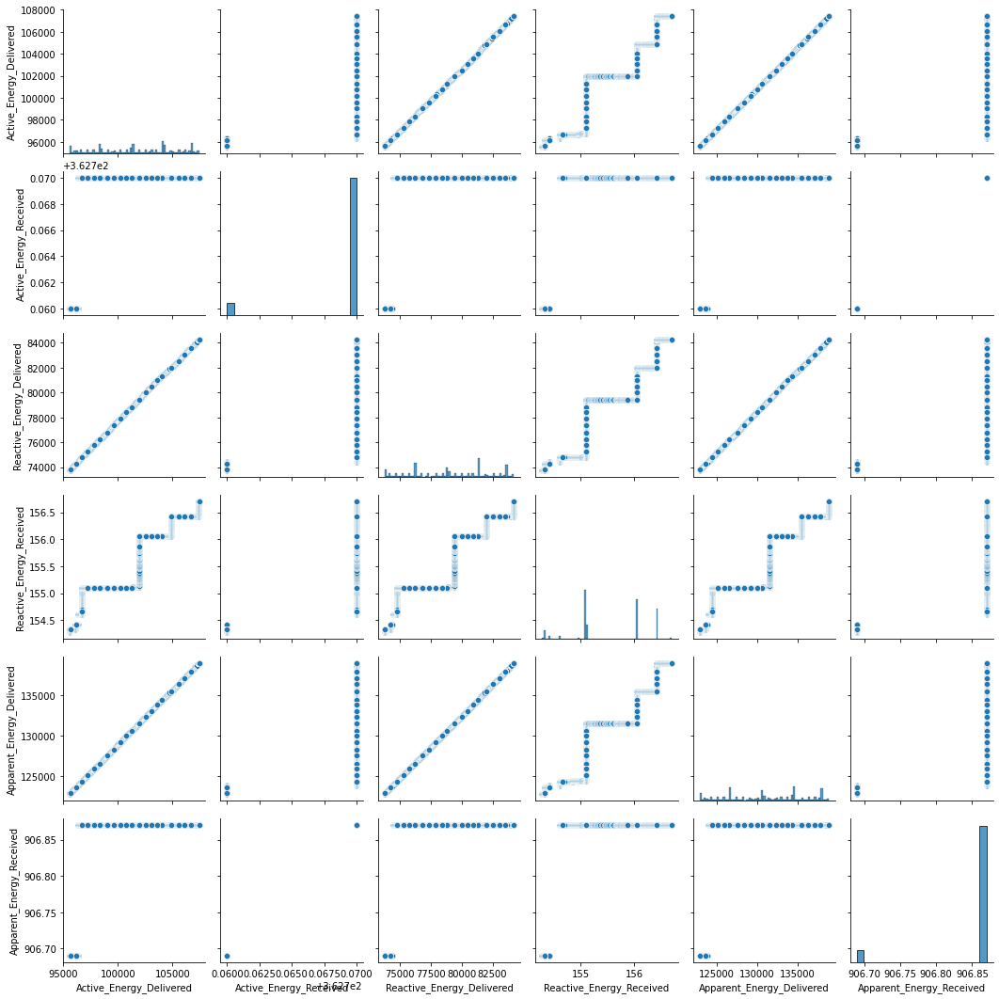

In [ ]:
plt.figure(figsize=(24, 12))
seaborn.pairplot(data= df_3)

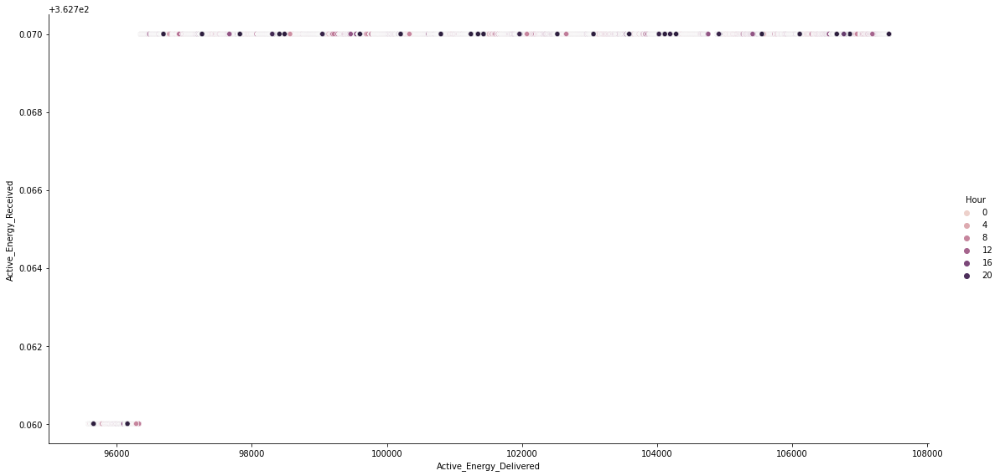

In [ ]:
seaborn.pairplot(data=df_1, y_vars=['Active_Energy_Received'],
                 x_vars=['Active_Energy_Delivered'],hue='Hour',
                 aspect=2, height=8)

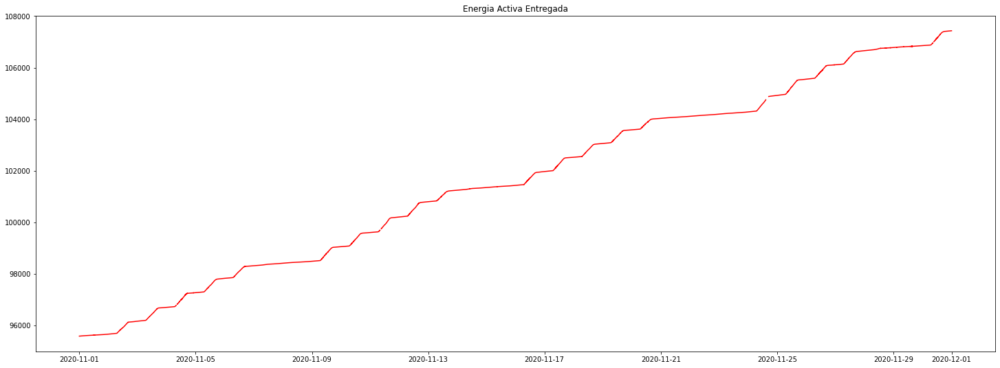

In [ ]:
fig, ax1 = plt.subplots(figsize=(25, 9))
ax1.plot( df_1_groupby_minute_mean["Active_Energy_Delivered"], color="red")
#ax1.plot( df_1_groupby_minute_mean["Active_Energy_Received"],  color="red")
ax1.set(title='Energia Activa Entregada')
#ax1.plot(df_industrial_groupby_minute_mean["Apparent_Energy_Total"], color="steelblue")
#ax1.plot(df_industrial_groupby_minute_mean["Reactive_Power_Total"], "black")
plt.show()

De los graficos anteriores podemos inferir que mientras que la energia recibida se mantiene constante en el tiempo, la energia entregada aumenta con el tiempo y es la que denotara el consumo

# Análisis de la Temperatura

Si bien la tempreratura esta medida dentro del dispositivo, podemos estimar la temperatura del ambiente en base a esta columna, como para estimar cargas puntuales durante de la epoca de verano debido a la utilización de aires acondicinados. 
Un dato importante a relevar es el tipo de calefacción durante la temporatada invernal. Si los mismos equipos de Aire Acondicionado son Frio/Calor, podemos pensar a estas cargas como estivales y constantes durante invierno y verano. Si son solo para tratamiento de aire en verano, deberemos considerarlos como casos especiales y tratar de determinar su consumo particular a fines de evitar que impacten en el análisis de cargas de los equipos de producción. 
Un rápido análisis de los gráficos de los cargas por fase, hace estimar que estas cargas se encuentran sobre la fase A.

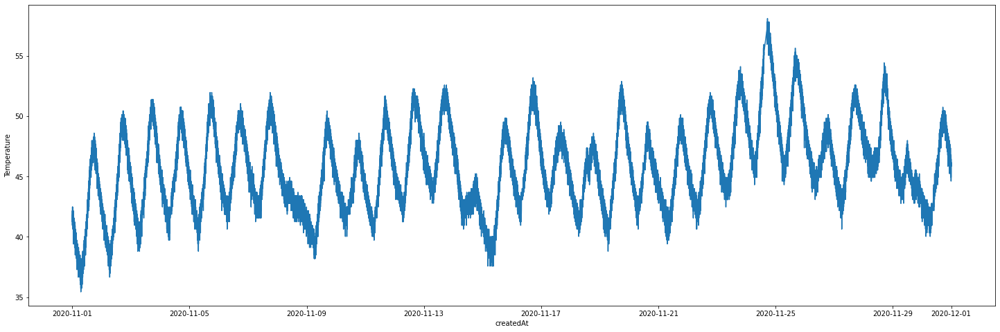

In [ ]:
fig = plt.figure(figsize=(25,8))
seaborn.lineplot(data=df_1, x=df_1.index, y="Temperature")

Buscamos relacionar la Potencia Activa con la Temperatura para tratar de determinar consumos particulares según los picos de temperatura

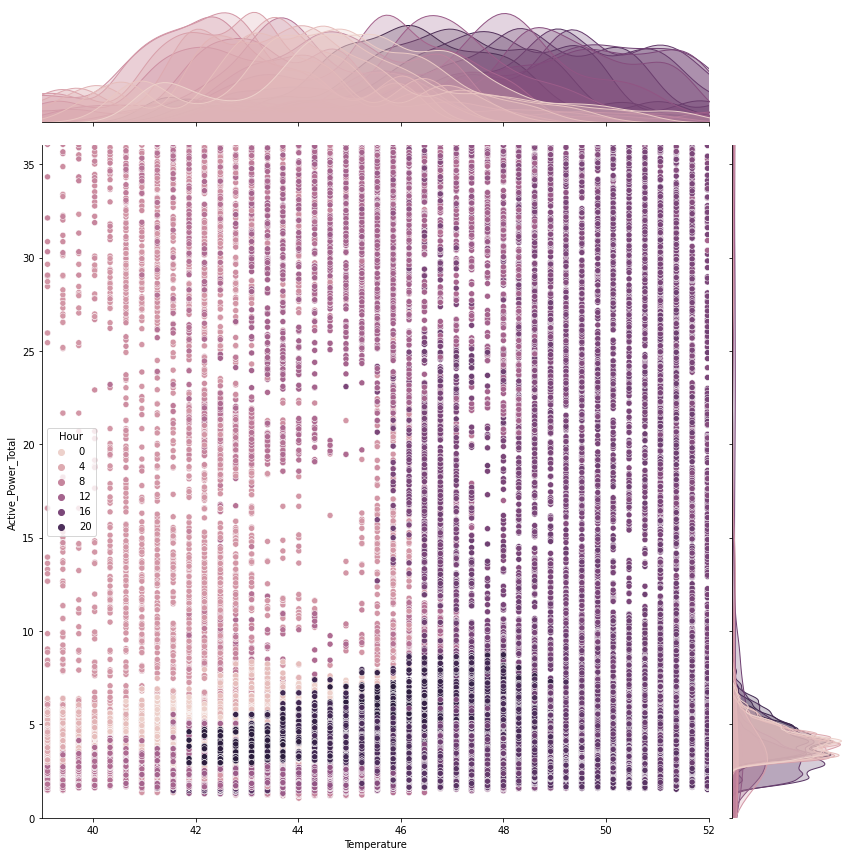

In [ ]:
plot = seaborn.jointplot(data = df_1 , x = 'Temperature', y = 'Active_Power_Total', hue='Hour', height=12)
plot.ax_marg_x.set_xlim(39, 52)
plot.ax_marg_y.set_ylim(0, 36)
plt.show()

A continuacion las temperaturas para cada una de las corrientes para observar si se tiene el mismo comportamiento

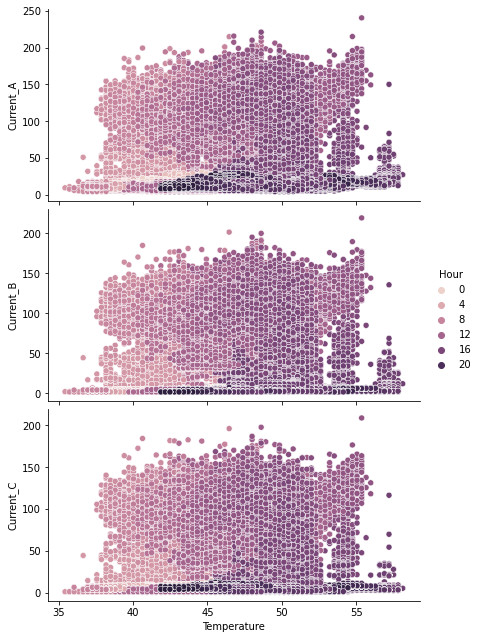

In [ ]:
seaborn.pairplot(data=df_1, y_vars=['Current_A',"Current_B","Current_C"],
                 x_vars=['Temperature'],hue='Hour',
                 aspect=2, height=3)




#Matriz de correlación




In [ ]:
cormat = df_2.corr()
cormat

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,rsrv1,rsrv2,rsrv3,rsrv4
Active_Energy_Delivered,1.000000,-0.031636,0.497988,1.000000,1.000000,-0.035844,-0.022322,-0.041383,-0.033109,0.999976,0.497988,NaN,-0.032822,-0.029826,-0.043352,-0.035544,-0.032271,NaN,-0.029151,-0.043191,NaN,-0.008938,NaN,NaN,NaN,NaN,NaN,-0.006509,-0.189987,0.011692,-0.016163,-0.093392,0.999882,0.945627,0.999882,0.999882,-0.022864,-0.037481,-0.041987,-0.034102,0.324922,NaN,-0.009357,NaN,-0.057113,NaN,-0.013956,NaN,-0.026690,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Active_Energy_LastDay,-0.031636,1.000000,0.038855,-0.031636,-0.031636,0.955553,0.957685,0.945758,0.956104,-0.031033,0.038855,NaN,0.960981,0.963749,0.956830,0.962043,0.959645,NaN,0.962692,0.955445,NaN,0.889149,NaN,NaN,NaN,NaN,NaN,-0.105105,-0.487270,-0.399526,-0.778122,-0.662756,-0.030397,-0.001984,-0.030397,-0.030385,0.951635,0.954871,0.953611,0.954574,0.090413,NaN,-0.806878,NaN,-0.764120,NaN,-0.645331,NaN,-0.763136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Active_Energy_Received,0.497988,0.038855,1.000000,0.497987,0.497989,0.033268,0.038184,0.034476,0.035396,0.500104,1.000000,NaN,0.033423,0.035280,0.028725,0.032779,0.033242,NaN,0.035065,0.027987,NaN,0.025727,NaN,NaN,NaN,NaN,NaN,-0.069667,-0.087221,-0.081090,-0.097874,-0.078967,0.502087,0.537870,0.502073,0.502101,0.035556,0.031994,0.027415,0.031698,0.267120,NaN,-0.061592,NaN,-0.091260,NaN,-0.080793,NaN,-0.078396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Active_Energy_del_m_rec,1.000000,-0.031636,0.497987,1.000000,1.000000,-0.035844,-0.022322,-0.041384,-0.033109,0.999976,0.497987,NaN,-0.032822,-0.029826,-0.043353,-0.035544,-0.032271,NaN,-0.029151,-0.043191,NaN,-0.008938,NaN,NaN,NaN,NaN,NaN,-0.006509,-0.189987,0.011692,-0.016163,-0.093392,0.999882,0.945627,0.999882,0.999882,-0.022864,-0.037481,-0.041987,-0.034102,0.324922,NaN,-0.009357,NaN,-0.057113,NaN,-0.013956,NaN,-0.026690,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Active_Energy_del_p_rec,1.000000,-0.031636,0.497989,1.000000,1.000000,-0.035844,-0.022322,-0.041383,-0.033109,0.999976,0.497989,NaN,-0.032822,-0.029826,-0.043352,-0.035544,-0.032271,NaN,-0.029151,-0.043191,NaN,-0.008938,NaN,NaN,NaN,NaN,NaN,-0.006509,-0.189987,0.011692,-0.016163,-0.093392,0.999882,0.945627,0.999882,0.999882,-0.022864,-0.037481,-0.041987,-0.034102,0.324922,NaN,-0.009357,NaN,-0.057113,NaN,-0.013956,NaN,-0.026691,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Voltage_UNB_L_N_Worst,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
rsrv1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

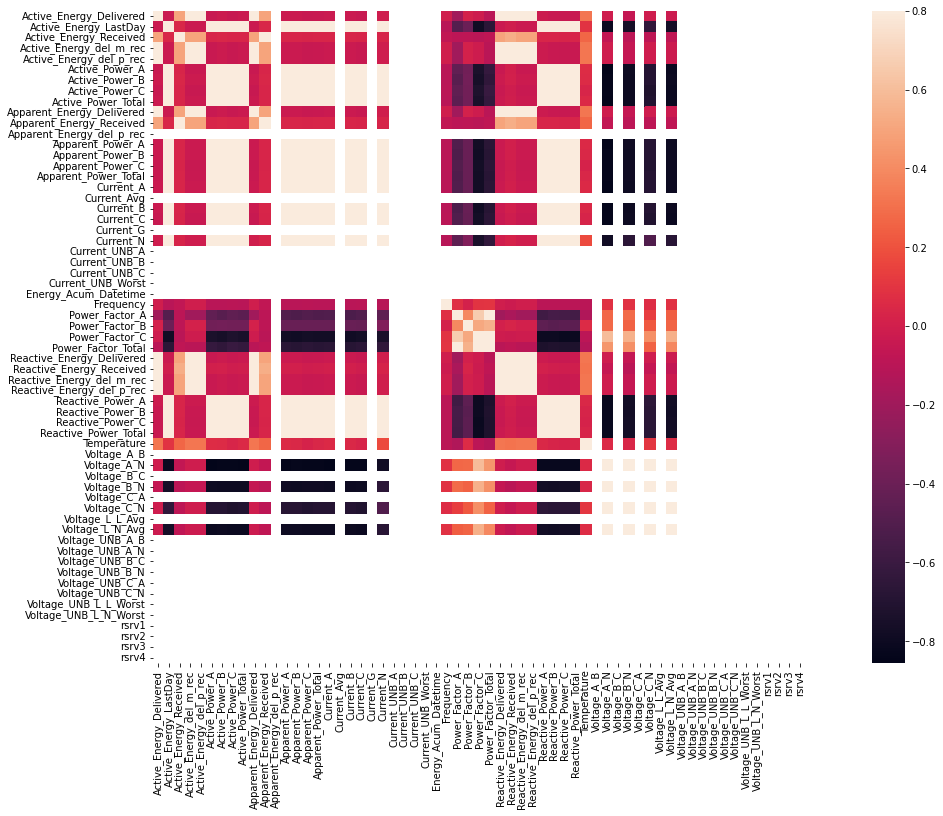

In [ ]:
plt.figure(figsize=(24, 12))
seaborn.heatmap(cormat, vmax=0.8, square=True)

# Análisis de la Temperatura Ambiente

Para el analisiis de la temperatura ambiente  y su respectiva incidencia en el consumo se utilizara un dataframe extraido del Servicio Metereologico Nacional.
Dicho dataframe cuenta con la temperatura por hora de varios puntos de la republica Argentina.
Se realizara un union de dataframes y se visualizaran resultados.

###Ingesta de Dataframes

In [ ]:
file_input = "file20201101_mes.csv"
df_1 = pandas.read_csv(file_input)

In [ ]:
df_temps = pandas.read_csv("temperatures_smn.txt", header="infer",encoding='cp1252', on_bad_lines="skip", sep="  ",)
df_temps

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  return func(*args, **kwargs)


,FECHA,HORA,TEMP,HUM,PNM,DD,FF,NOMBRE
0,[HOA],[ºC],[%],[hPa],[gr] [km/hr],None,None,None
1,01112020,0,17.1,76,1024.8,70,15,AEROPARQUE AERO
2,01112020,1,16.3,71,1024.3,110,17,AEROPARQUE AERO
3,01112020,2,16.1,64,1023.9,110,11,AEROPARQUE AERO
4,01112020,3,16.2,75,1024.1,70,9,AEROPARQUE AERO
...,...,...,...,...,...,...,...,...
61098,30112020,19,26.1,44,1012.0,50,37,VILLA REYNOLDS AERO
61099,30112020,20,24.8,38,1012.0,50,30,VILLA REYNOLDS AERO
61100,30112020,21,22.8,40,1012.6,50,19,VILLA REYNOLDS AERO
61101,30112020,22,21.1,46,1013.1,50,30,VILLA REYNOLDS AERO


In [ ]:
df_temps['DATETIME'] = df_temps['FECHA'] + '-' + df_temps['HORA']
df_temps

,FECHA,HORA,TEMP,HUM,PNM,DD,FF,NOMBRE,DATETIME
0,[HOA],[ºC],[%],[hPa],[gr] [km/hr],None,None,None,[HOA]-[ºC]
1,01112020,0,17.1,76,1024.8,70,15,AEROPARQUE AERO,01112020-0
2,01112020,1,16.3,71,1024.3,110,17,AEROPARQUE AERO,01112020-1
3,01112020,2,16.1,64,1023.9,110,11,AEROPARQUE AERO,01112020-2
4,01112020,3,16.2,75,1024.1,70,9,AEROPARQUE AERO,01112020-3
...,...,...,...,...,...,...,...,...,...
61098,30112020,19,26.1,44,1012.0,50,37,VILLA REYNOLDS AERO,30112020-19
61099,30112020,20,24.8,38,1012.0,50,30,VILLA REYNOLDS AERO,30112020-20
61100,30112020,21,22.8,40,1012.6,50,19,VILLA REYNOLDS AERO,30112020-21
61101,30112020,22,21.1,46,1013.1,50,30,VILLA REYNOLDS AERO,30112020-22


In [ ]:
#import re
#regex_r = r"(\d+)\s+(\d+)\s+(\d+.\d)\s+(\d+)\s+(\d+.\d)\s+(\d+)\s+(\d+)\s+([a-zA-Z\s]+)"
#lista = [re.findall(regex_r,line) for line in open('temperatures_smn.txt', encoding="cp1252" )]

In [ ]:
df_temps.index = pandas.to_datetime(
    df_temps['DATETIME'],
    errors="coerce",
    format='%d%m%Y-%H')

In [ ]:
df_temps

,FECHA,HORA,TEMP,HUM,PNM,DD,FF,NOMBRE,DATETIME
DATETIME,,,,,,,,,
NaT,[HOA],[ºC],[%],[hPa],[gr] [km/hr],None,None,None,[HOA]-[ºC]
2020-11-01 00:00:00,01112020,0,17.1,76,1024.8,70,15,AEROPARQUE AERO,01112020-0
2020-11-01 01:00:00,01112020,1,16.3,71,1024.3,110,17,AEROPARQUE AERO,01112020-1
2020-11-01 02:00:00,01112020,2,16.1,64,1023.9,110,11,AEROPARQUE AERO,01112020-2
2020-11-01 03:00:00,01112020,3,16.2,75,1024.1,70,9,AEROPARQUE AERO,01112020-3
...,...,...,...,...,...,...,...,...,...
2020-11-30 19:00:00,30112020,19,26.1,44,1012.0,50,37,VILLA REYNOLDS AERO,30112020-19
2020-11-30 20:00:00,30112020,20,24.8,38,1012.0,50,30,VILLA REYNOLDS AERO,30112020-20
2020-11-30 21:00:00,30112020,21,22.8,40,1012.6,50,19,VILLA REYNOLDS AERO,30112020-21


In [ ]:
df_temps['NOMBRE'].unique()

array([None, 'AEROPARQUE AERO', 'AZUL AERO', 'BAHIA BLANCA AERO',
       'BARILOCHE AERO', 'BASE BELGRANO II', 'BASE CARLINI (EX JUBANY)',
       'BASE ESPERANZA', 'BASE MARAMBIO', 'BASE ORCADAS',
       'BASE SAN MARTIN', 'BERNARDO DE IRIGOYEN AERO', 'BOLIVAR AERO',
       'BUENOS AIRES OBSERVATORIO', 'CAMPO DE MAYO AERO',
       'CATAMARCA AERO', 'CERES AERO', 'CHAMICAL AERO', 'CHAPELCO AERO',
       'CHEPES', 'CHILECITO AERO', 'CIPOLLETTI',
       'COMODORO RIVADAVIA AERO', 'CONCORDIA AERO', 'CORDOBA AERO',
       'CORDOBA OBSERVATORIO', 'CORONEL PRINGLES AERO',
       'CORONEL SUAREZ AERO', 'CORRIENTES AERO', 'DOLORES AERO',
       'EL BOLSON AERO', 'EL CALAFATE AERO', 'EL PALOMAR AERO',
       'EL TREBOL', 'ESCUELA DE AVIACION MILITA', 'ESQUEL AERO',
       'EZEIZA AERO', 'FORMOSA AERO', 'GENERAL PICO AERO',
       'GOBERNADOR GREGORES AERO', 'GUALEGUAYCHU AERO', 'IGUAZU AERO',
       'JUJUY AERO', 'JUJUY U N', 'JUNIN AERO', 'LA PLATA AERO',
       'LA QUIACA OBSERVATORIO', 'LA RI

Se visualiza que para la ciudad de Córdoba se tienen tres puntos de recoleccion de datos:


*   Observatorio Córdoba
*   Aeropuerto Córdoba
*   Escuela de Aviaciión Militar





In [ ]:
df_cordoba_observatorio = df_temps[df_temps['NOMBRE'] == 'CORDOBA OBSERVATORIO']
df_cordoba_aero = df_temps[df_temps['NOMBRE'] == 'CORDOBA AERO']
df_cordoba_fuerza_aerea = df_temps[df_temps['NOMBRE'] == 'ESCUELA DE AVIACION MILITA']

Para la union de dataframes se utilizara las tomas realizadas en el Observatorio Córdoba

In [ ]:
df_cordoba_observatorio['TEMP'].min(), df_cordoba_observatorio['TEMP'].max()

('11.7', '38.2')

Preparación del dataframe de consumo de energia

In [ ]:
df_1.index = pandas.to_datetime(
    df_1['createdAt'],
    errors="coerce",
    format='%Y%m%d %H:%M:%S.%f',
    ).dt.tz_convert(None)
    #2020-11-30 23:59:12.616

In [ ]:
df_1

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-30 00:00:12.342,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.31,0.94,3.25,138069.09,906.87,4,2.36,0.37,0.97,3.48,10.18,0,1.56,4.19,13,6.40,2,1,2,0,0,50.04,0.85,0.82,1.03,0.93,83686.04,156.42,83529.62,83842.46,1.25,0.22,-0.22,1.24,43.09,380,231.71,391,231.29,383,231.40,380,231.47,30,12,23,15,26,15,12,5,2020-11-30T00:00:12.342Z,0,0,0,0
2020-11-30 00:00:22.759,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.11,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.46,1.25,0.20,-0.22,1.23,42.48,380,231.67,391,231.16,383,231.36,380,231.40,30,12,23,15,26,15,12,5,2020-11-30T00:00:22.759Z,0,0,0,0
2020-11-30 00:00:39.117,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.12,906.87,4,2.36,0.36,0.97,3.47,10.18,0,1.60,4.19,13,6.41,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.47,1.25,0.20,-0.22,1.23,42.78,380,231.77,391,231.28,383,231.48,380,231.51,30,12,23,15,26,15,12,5,2020-11-30T00:00:39.117Z,0,0,0,0
2020-11-30 00:00:48.160,106852.32,3.81,362.77,106489.55,107215.09,2.00,0.30,0.94,3.25,138069.14,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.05,156.42,83529.64,83842.47,1.25,0.21,-0.22,1.23,43.09,380,231.84,391,231.39,383,231.53,380,231.59,30,12,23,15,26,15,12,5,2020-11-30T00:00:48.160Z,0,0,0,0
2020-11-30 00:00:58.693,106852.33,3.81,362.77,106489.55,107215.10,1.81,0.29,0.94,3.05,138069.14,906.87,4,2.06,0.36,0.97,3.19,8.86,0,1.56,4.19,13,5.22,2,1,2,0,0,50.04,0.88,0.82,1.03,0.95,83686.05,156.42,83529.64,83842.48,0.98,0.20,-0.22,0.95,43.09,380,232.03,391,231.38,383,231.35,380,231.59,30,12,23,15,26,15,12,5,2020-11-30T00:00:58.693Z,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-01 23:58:06.425,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.67,906.69,4,1.95,0.38,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,42.48,380,235.46,391,234.58,383,234.72,380,234.92,30,12,23,15,26,15,12,5,2020-11-01T23:58:06.425Z,0,0,0,0
2020-11-01 23:58:18.775,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.68,906.69,4,1.95,0.38,0.92,2.98,8.28,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,41.87,380,235.48,391,234.62,383,234.79,380,234.96,30,12,23,15,26,15,12,5,2020-11-01T23:58:18.775Z,0,0,0,0
2020-11-01 23:58:29.311,95656.47,3.77,362.76,95293.71,96019.23,1.83,0.32,0.80,2.95,122900.69,906.69,4,1.95,0.37,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.4

In [ ]:
df_1['DATE'] = df_1.index.date
df_1['TIME'] = df_1.index.hour
df_cordoba_observatorio['DATE'] = df_cordoba_observatorio.index.date
df_cordoba_observatorio['TIME'] = df_cordoba_observatorio.index.hour

df_cordoba_observatorio.sort_index(inplace=True)
df_1.sort_index(inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [ ]:
df_1.columns

Index(['Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_Avg', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C', 'Current_UNB_Worst', 'Energy_Acum_Datetime',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A_N', 'Voltage

In [ ]:
df_1_grouped_hour = df_1.resample('H').agg({'Current_A':'max', 'Current_B':'max','Current_C':'max', 'Apparent_Power_A':'max', 'Apparent_Power_B':'max', 'Apparent_Power_C':'max',"Active_Power_Total":'max','Temperature':'max' })
df_1_grouped_hour

,Current_A,Current_B,Current_C,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Active_Power_Total,Temperature
createdAt,,,,,,,,
2020-11-01 00:00:00,22.47,3.74,7.38,5.13,0.37,1.69,6.45,42.48
2020-11-01 01:00:00,14.78,2.02,7.30,3.42,0.47,1.69,5.34,41.87
2020-11-01 02:00:00,16.95,4.54,8.83,4.25,1.05,1.69,5.49,40.95
2020-11-01 03:00:00,18.53,4.50,8.90,4.27,1.04,2.07,6.39,40.33
2020-11-01 04:00:00,15.48,3.77,7.29,3.57,0.47,1.69,4.93,39.41
...,...,...,...,...,...,...,...,...
2020-11-30 19:00:00,20.07,6.51,5.64,4.71,1.53,1.33,5.68,50.14
2020-11-30 20:00:00,23.69,6.39,10.69,5.52,1.50,2.51,8.31,49.22
2020-11-30 21:00:00,20.66,6.68,10.72,4.82,1.57,2.52,7.26,48.61


### Union de dataframe de Consumo de Energia con dataframe de temperatura Ambiente

In [ ]:
df_merged = pandas.merge(df_1_grouped_hour, df_cordoba_observatorio, left_on='createdAt', right_index=True)
df_merged

,Current_A,Current_B,Current_C,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Active_Power_Total,Temperature,FECHA,HORA,TEMP,HUM,PNM,DD,FF,NOMBRE,DATETIME,DATE,TIME
createdAt,,,,,,,,,,,,,,,,,,,
2020-11-01 00:00:00,22.47,3.74,7.38,5.13,0.37,1.69,6.45,42.48,01112020,0,16.5,41,1022.7,360,4,CORDOBA OBSERVATORIO,01112020-0,2020-11-01,0
2020-11-01 01:00:00,14.78,2.02,7.30,3.42,0.47,1.69,5.34,41.87,01112020,1,16.0,44,1022.8,360,2,CORDOBA OBSERVATORIO,01112020-1,2020-11-01,1
2020-11-01 02:00:00,16.95,4.54,8.83,4.25,1.05,1.69,5.49,40.95,01112020,2,15.4,46,1022.7,320,2,CORDOBA OBSERVATORIO,01112020-2,2020-11-01,2
2020-11-01 03:00:00,18.53,4.50,8.90,4.27,1.04,2.07,6.39,40.33,01112020,3,14.0,49,1022.5,320,2,CORDOBA OBSERVATORIO,01112020-3,2020-11-01,3
2020-11-01 04:00:00,15.48,3.77,7.29,3.57,0.47,1.69,4.93,39.41,01112020,4,13.3,54,1022.5,320,2,CORDOBA OBSERVATORIO,01112020-4,2020-11-01,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-30 19:00:00,20.07,6.51,5.64,4.71,1.53,1.33,5.68,50.14,30112020,19,26.2,39,1013.9,90,13,CORDOBA OBSERVATORIO,30112020-19,2020-11-30,19
2020-11-30 20:00:00,23.69,6.39,10.69,5.52,1.50,2.51,8.31,49.22,30112020,20,24.2,41,1014.7,70,15,CORDOBA OBSERVATORIO,30112020-20,2020-11-30,20
2020-11-30 21:00:00,20.66,6.68,10.72,4.82,1.57,2.52,7.26,48.61,30112020,21,22.4,46,1015.2,90,13,CORDOBA OBSERVATORIO,30112020-21,2020-11-30,21


In [ ]:
df_merged['TEMP'] = df_merged['TEMP'].apply(pandas.to_numeric)
df_merged['Temperature'] = df_merged['Temperature'].apply(pandas.to_numeric)
df_merged['HUM'] = df_merged['HUM'].apply(pandas.to_numeric)
df_merged['PNM'] = df_merged['PNM'].apply(pandas.to_numeric)
df_merged['Active_Power_Total'] = df_merged['Active_Power_Total'].apply(pandas.to_numeric)

### Visualización Temperatura Ambiente

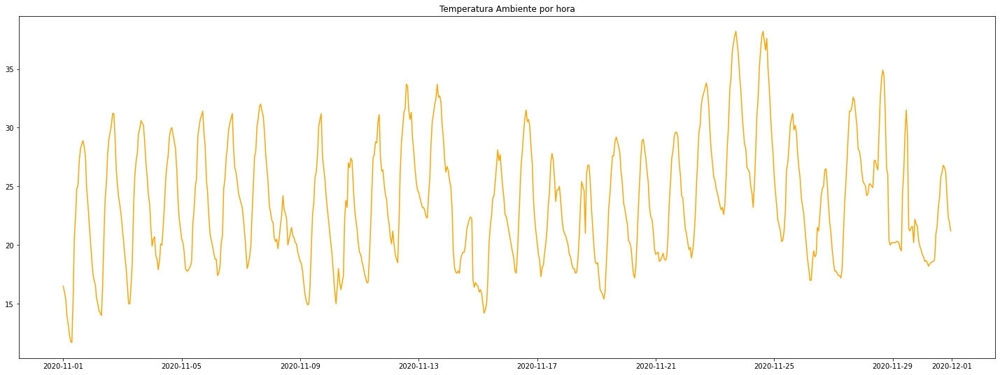

In [ ]:
fig, ax1 = plt.subplots(figsize=(25, 9))
ax1.plot( df_merged["TEMP"], color="orange")
ax1.set(title='Temperatura Ambiente por hora')
#ax1.plot( df_1["Temperature"],  color="steelblue")#seaborn.lineplot(data=df_1, x=df_1.index, y="Temperature")
#ax1.plot(df_industrial_groupby_minute_mean["Apparent_Energy_Total"], color="steelblue")
#ax1.plot(df_industrial_groupby_minute_mean["Reactive_Power_Total"], "black")
plt.show()

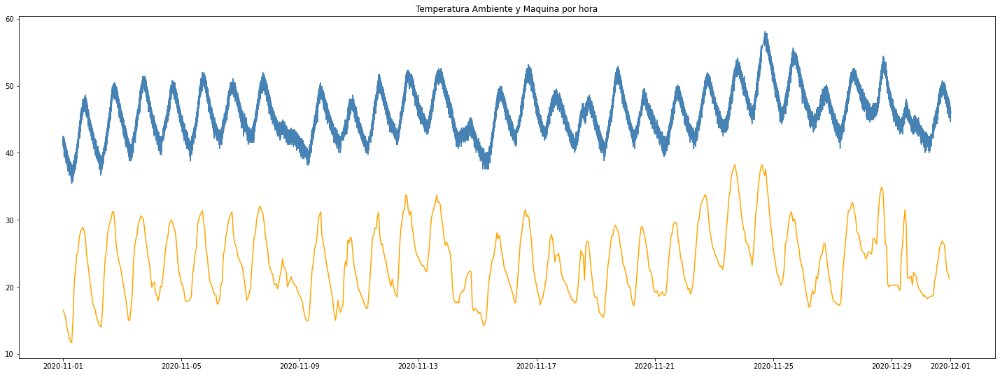

In [ ]:
fig, ax1 = plt.subplots(figsize=(25, 9))
ax1.plot( df_merged["TEMP"], color="orange")
ax1.set(title='Temperatura Ambiente y Maquina por hora')
ax1.plot( df_1["Temperature"],  color="steelblue")#seaborn.lineplot(data=df_1, x=df_1.index, y="Temperature")
#ax1.plot(df_industrial_groupby_minute_mean["Apparent_Energy_Total"], color="steelblue")
#ax1.plot(df_industrial_groupby_minute_mean["Reactive_Power_Total"], "black")
plt.show()

Text(0.5, 0.98, 'Temperatura Ambiente Vs Temperatura Maquina')

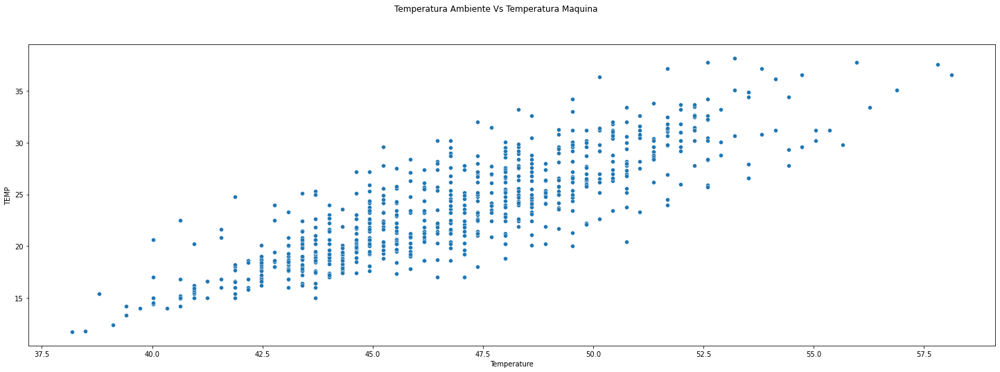

In [ ]:
fig = plt.figure(figsize=(25,8))
seaborn.scatterplot(data=df_merged, y='TEMP', x='Temperature')
fig.suptitle('Temperatura Ambiente Vs Temperatura Maquina')


En los graficos anteriores se puede ver que existe una alta relacion entre la Temperatura Ambiente y la Temperatura Maquina.

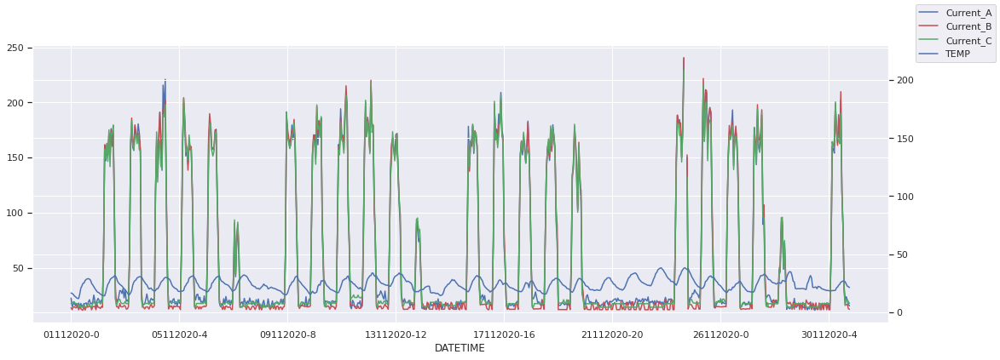

In [ ]:
seaborn.set(rc={'figure.figsize':(18,6)})
ax = df_merged.plot(x='DATETIME', y="Current_A", legend=False, color='b')
ax2 = ax.twinx()
df_merged.plot(x='DATETIME', y="Current_B", ax=ax2, legend=False, color="r")
df_merged.plot(x='DATETIME', y="Current_C", ax=ax2, legend=False, color="g")
df_merged.plot(x='DATETIME', y="TEMP", ax=ax2, legend=False)
ax.figure.legend()
plt.show()

### Creacion de CSV de Temperatura Ambiente

In [ ]:
df_cordoba_aero.sort_index()

,FECHA,HORA,TEMP,HUM,PNM,DD,FF,NOMBRE,DATETIME
DATETIME,,,,,,,,,
2020-11-01 00:00:00,01112020,0,12.6,43,1022.6,320,11,CORDOBA AERO,01112020-0
2020-11-01 01:00:00,01112020,1,12.1,46,1022.6,320,11,CORDOBA AERO,01112020-1
2020-11-01 02:00:00,01112020,2,11.4,50,1022.1,340,13,CORDOBA AERO,01112020-2
2020-11-01 03:00:00,01112020,3,11.3,51,1021.4,320,13,CORDOBA AERO,01112020-3
2020-11-01 04:00:00,01112020,4,9.8,57,1020.9,320,13,CORDOBA AERO,01112020-4
...,...,...,...,...,...,...,...,...,...
2020-11-30 19:00:00,30112020,19,24.0,45,1014.2,70,17,CORDOBA AERO,30112020-19
2020-11-30 20:00:00,30112020,20,21.4,53,1014.9,50,9,CORDOBA AERO,30112020-20
2020-11-30 21:00:00,30112020,21,19.0,67,1015.5,50,9,CORDOBA AERO,30112020-21


In [ ]:
df_cordoba_observatorio.to_csv('temps_cba_aero.csv')

# Multas de Facturación

### Multa por Factor de Potencia

Para el calculo de tarifa el proveedor de energia electrica especifica lo siguiente en relación al factor de potencia

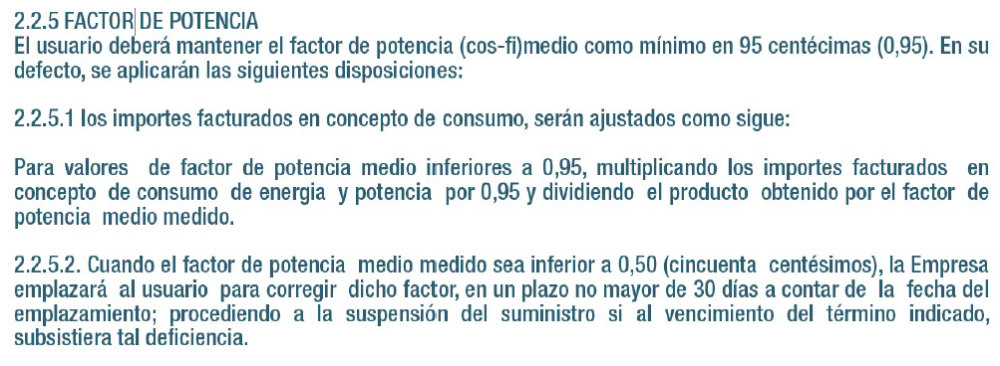

Calculo del factor de potencia media

In [ ]:
df_1['Power_Factor_Total'].mean()

0.8532473284456925

In [ ]:
df_1['Power_Factor_Total'].min(),

(0.35,)

In [ ]:
df_1['Power_Factor_Total'].max()

1.01

Se puede observar que el Factor de Potencia medio calculado indica que se deberia aplicar multa, pero dado que la prestataria del servicio no midio esta supuesta infracción el factor de Potencia Medio medido no se considerara para el resto del estudio.  

###Multa por Demanda Autorizada

Para el calculo de tarifa el proveedor de enregia electrica especifica lo siguiente en relación a la demanda autorizada

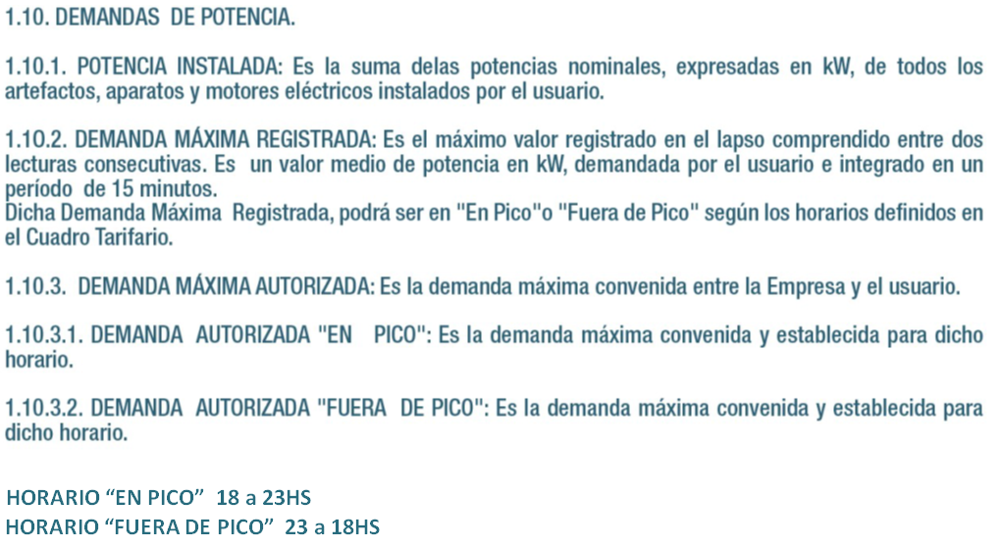

En funcion de esto se desarrollara un codigo y un dataset que indique si corresponde multa o no. Este sera util para crear un modelo que prediga si el usuario tendra multas o no en condiciones dadas

##Creaccion de Columna de Multa

Para esto se utiliza una agrupacón cada 15 minutos ya que la multa se calcula cada 15 minutos

In [ ]:
file_input = "file20201101_mes.csv"
df_1 = pandas.read_csv(file_input)

In [ ]:
df_1.index = pandas.to_datetime(
    df_1['createdAt'],
    errors="coerce",
    format='%Y%m%d %H:%M:%S.%f',
    ).dt.tz_convert(None)
    #2020-11-30 23:59:12.616

In [ ]:
df_1_grouped_15min = df_1.resample('15min').first()
df_1_grouped_15min['Active_Energy_Delivered']

createdAt
2020-11-01 00:00:00     95579.32
2020-11-01 00:15:00     95580.23
2020-11-01 00:30:00     95581.11
2020-11-01 00:45:00     95582.20
2020-11-01 01:00:00     95583.25
                         ...    
2020-11-30 22:45:00    107426.47
2020-11-30 23:00:00    107427.47
2020-11-30 23:15:00    107428.38
2020-11-30 23:30:00    107429.38
2020-11-30 23:45:00    107430.38
Freq: 15T, Name: Active_Energy_Delivered, Length: 2880, dtype: float64

In [ ]:
df_1_grouped_15min['hour_col'] = df_1_grouped_15min.index.hour  #add hours column
df_1_grouped_15min['Potencia_Media'] = df_1_grouped_15min['Active_Energy_Delivered'].diff() /0.25
df_1_grouped_15min.tail(5)

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,Potencia_Media
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-30 22:45:00,107426.47,3.60,362.77,107063.70,107789.25,1.77,0.36,0.98,3.11,138877.28,906.87,4.0,1.94,0.45,1.01,3.22,8.30,0.0,1.93,4.32,13.0,4.70,2.0,1.0,2.0,0.0,0.0,50.06,0.91,0.79,1.03,0.96,84240.06,156.7,84083.37,84396.76,0.80,0.28,-0.23,0.85,46.77,380.0,234.92,391.0,234.41,383.0,233.94,380.0,234.42,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30T22:45:11.048Z,0.0,0.0,0.0,0.0,22,3.52
2020-11-30 23:00:00,107427.47,4.00,362.77,107064.70,107790.24,2.74,0.35,0.98,4.06,138878.30,906.87,4.0,2.91,0.44,1.00,4.19,12.69,0.0,1.89,4.36,13.0,8.81,2.0,1.0,2.0,0.0,0.0,50.06,0.94,0.80,1.02,0.97,84240.32,156.7,84083.62,84397.02,0.98,0.26,-0.22,1.02,46.77,380.0,229.60,391.0,230.25,383.0,229.71,380.0,229.85,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30T23:00:03.940Z,0.0,0.0,0.0,0.0,23,4.00
2020-11-30 23:15:00,107428.38,3.66,362.77,107065.62,107791.16,1.91,0.43,0.98,3.31,138879.27,906.87,4.0,2.11,0.54,1.00,3.46,9.16,0.0,2.34,4.36,13.0,4.86,2.0,1.0,2.0,0.0,0.0,50.11,0.90,0.79,1.02,0.96,84240.55,156.7,84083.87,84397.26,0.91,0.33,-0.22,1.02,46.46,380.0,230.82,391.0,230.29,383.0,229.96,380.0,230.36,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30T23:15:09.328Z,0.0,0.0,0.0,0.0,23,3.64
2020-11-30 23:30:00,107429.38,3.88,362.77,107066.61,107792.15,2.21,0.42,1.56,4.19,138880.30,906.87,4.0,2.59,0.53,1.59,4.41,11.21,0.0,2.32,6.93,13.0,4.34,2.0,1.0,2.0,0.0,0.0,50.09,0.85,0.78,1.02,0.95,84240.90,156.7,84084.20,84397.59,1.35,0.33,-0.30,1.38,46.46,380.0,230.76,391.0,230.30,383.0,229.83,380.0,230.30,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30T23:30:01.788Z,0.0,0.0,0.0,0.0,23,4.00
2020-11-30 23:45:00,107430.38,3.88,362.77,107067.61,107793.15,2.73,0.34,0.85,3.92,138881.34,906.87,4.0,2.92,0.43,0.90,4.04,12.70,0.0,1.85,3.89,13.0,8.69,2.0,1.0,2.0,0.0,0.0,50.05,0.93,0.80,1.06,0.97,84241.19,156.7,84084.48,84397.88,1.04,0.25,-0.30,0.99,45.85,380.0,229.63,391.0,230.26,383.0,230.11,380.0,230.00,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30T23:45:09.247Z,0.0,0.0,0.0,0.0,23,4.00


In [ ]:
df_1_grouped_15min['Potencia_Media'].max()

102.96000000002095

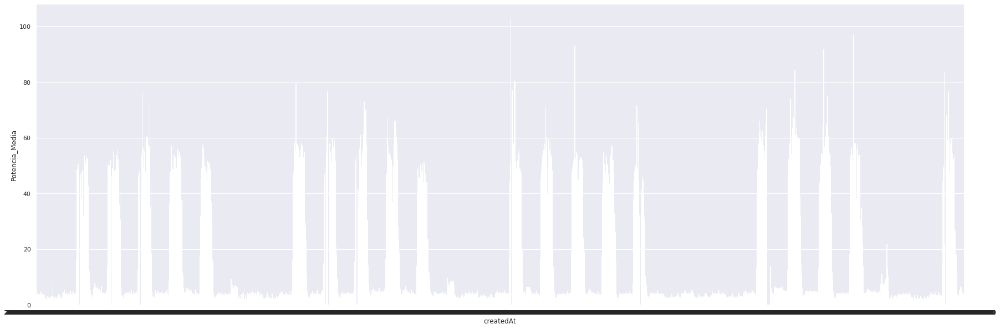

In [ ]:
plt.figure(figsize=(30,10))
seaborn.barplot(data=df_1_grouped_15min,
                 y=df_1_grouped_15min["Potencia_Media"],x=df_1_grouped_15min.index
                 )

In [ ]:
hora_pico_inicio = 18
hora_pico_fin =23
demanda_pico = 16.0 # 16.0
demanda_fuera = 61.0 # 61.0
#---------------------------------------------------------------------------------------------------------------------------------------------
filt_pico = (df_1_grouped_15min['Potencia_Media'] > demanda_pico) & (df_1_grouped_15min['hour_col'] > hora_pico_inicio) & (df_1_grouped_15min['hour_col'] < hora_pico_fin)
filt_fuera = (df_1_grouped_15min['Potencia_Media'] > demanda_fuera) & (df_1_grouped_15min['hour_col'] < hora_pico_inicio) | (df_1_grouped_15min['hour_col'] > hora_pico_fin)
filt_multa_demanda = filt_fuera.add(filt_pico)
df_1_grouped_15min['multa'] = filt_multa_demanda
filt_multa_demanda.value_counts()

False    2822
True       58
dtype: int64

In [ ]:
filt_multa_demanda

createdAt
2020-11-01 00:00:00    False
2020-11-01 00:15:00    False
2020-11-01 00:30:00    False
2020-11-01 00:45:00    False
2020-11-01 01:00:00    False
                       ...  
2020-11-30 22:45:00    False
2020-11-30 23:00:00    False
2020-11-30 23:15:00    False
2020-11-30 23:30:00    False
2020-11-30 23:45:00    False
Freq: 15T, Length: 2880, dtype: bool

In [ ]:
df_1_grouped_15min.to_csv('df_1_grouped_15min.csv')

En los calculos anteriores se puede ver que 58 veces se sobrepaso la demanda autorizada por lo que corresponderia multa

## Modelo de Predicción de Multa

### Leemos los archivos CSV con datos de un año

In [ ]:
df_1 = pandas.read_csv('https://raw.githubusercontent.com/agustinabdala/diplodatos/main/df_1_grouped_15min.csv', parse_dates=['createdAt'])
df_1

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (58,59) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,createdAt,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,_id,createdAt.1,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,close_diff
0,2021-01-01 00:00:00,119489.99,4.10,370.45,119119.55,119860.44,3.71,0.35,1.70,5.76,155397.44,930.37,4.0,3.93,0.45,1.72,5.92,16.85,0.0,1.89,7.32,13.0,11.23,2.0,1.0,2.0,0.0,0.0,50.01,0.94,0.79,1.01,0.97,95216.23,177.38,95038.87,95393.62,1.31,0.27,-0.22,1.36,46.16,380.0,233.46,391.0,235.12,383.0,234.80,380.0,234.46,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893c45,2021-01-01T00:00:09.967Z,0.0,0.0,0.0,0.0,0,NaN
1,2021-01-01 00:15:00,119491.10,3.95,370.45,119120.66,119861.55,2.15,0.43,0.82,3.39,155398.59,930.37,4.0,2.45,0.54,0.88,3.59,10.39,0.0,2.29,3.75,13.0,6.53,2.0,1.0,2.0,0.0,0.0,50.13,0.88,0.80,1.07,0.95,95216.59,177.38,95039.22,95393.97,1.17,0.33,-0.33,1.17,46.16,380.0,235.45,391.0,235.02,383.0,235.99,380.0,235.48,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893c93,2021-01-01T00:15:01.828Z,0.0,0.0,0.0,0.0,0,1.11
2,2021-01-01 00:30:00,119492.08,4.22,370.45,119121.64,119862.53,2.31,0.37,0.82,3.50,155399.64,930.37,4.0,2.65,0.47,0.88,3.72,11.28,0.0,2.01,3.75,13.0,7.74,2.0,1.0,2.0,0.0,0.0,50.04,0.87,0.79,1.07,0.94,95216.94,177.38,95039.56,95394.32,1.31,0.29,-0.33,1.27,46.46,380.0,234.94,391.0,234.85,383.0,235.72,380.0,235.17,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893ce3,2021-01-01T00:30:04.724Z,0.0,0.0,0.0,0.0,0,0.98
3,2021-01-01 00:45:00,119493.08,4.04,370.45,119122.64,119863.53,2.89,0.37,0.96,4.23,155400.69,930.37,4.0,3.12,0.47,0.98,4.41,13.32,0.0,2.00,4.17,13.0,9.67,2.0,1.0,2.0,0.0,0.0,50.05,0.93,0.79,1.02,0.96,95217.27,177.38,95039.90,95394.65,1.18,0.29,-0.21,1.25,45.85,380.0,234.66,391.0,235.55,383.0,236.06,380.0,235.42,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893d32,2021-01-01T00:45:01.035Z,0.0,0.0,0.0,0.0,0,1.00
4,2021-01-01 01:00:00,119494.09,3.92,370.45,119123.64,119864.54,2.15,0.37,0.96,3.48,155401.75,930.37,4.0,2.45,0.47,0.98,3.70,10.40,0.0,2.01,4.18,13.0,6.84,2.0,1.0,2.0,0.0,0.0,50.04,0.88,0.79,1.02,0.94,95217.59,177.38,95040.22,95394.98,1.18,0.29,-0.21,1.26,45.24,380.0,235.39,391.0,235.45,383.0,235.89,380.0,235.58,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893d81,2021-01-01T01:00:01.090Z,0.0,0.0,0.0,0.0,1,1.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43675,2022-03-31 22:45:00,294244.22,3.93,433.30,293810.91,294677.53,2.70,0.34,1.25,4.30,385317.03,1145.85,4.0,2.89,0.47,1.32,4.40,14.09,0.0,2.00,5.64,13.0,8.05,2.0,1.0,2.0,0.0,0.0,50.02,0.93,0.73,1.05,0.98,238030.23,464.95,237565.30,238495.20,1.04,0.32,-0.41,0.95,41.25,380.0,233.58,391.0,234.04,383.0,233.80,380.0,233.81,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c47ce215ee2e2202fbf38,2022-03-31T22:45:11.976Z,0.0,0.0,0.0,0.0,22,1.00
43676,2022-03-31 23:00:00,294245.25,4.07,433.30,293811.94,294678.56,2.79,0.34,1.26,4.39,385318.06,1145.85,4.0,3.00,0.4

In [ ]:
df_1.index = pandas.to_datetime(
    df_1['createdAt'],
    errors="coerce",
    format='%Y%m%d %H:%M:%S.%f',
    )
df_1=df_1.drop('createdAt', axis=1
           )
    #2020-11-30 23:59:12.616

In [ ]:
df_1['hour_col'] = df_1.index.hour  #add hours column
df_1['close_diff'] = df_1['Active_Energy_Delivered'].diff() /0.25
df_1.tail(5)

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,_id,createdAt.1,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,close_diff
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-03-31 22:45:00,294244.22,3.93,433.3,293810.91,294677.53,2.70,0.34,1.25,4.30,385317.03,1145.85,4.0,2.89,0.47,1.32,4.40,14.09,0.0,2.00,5.64,13.0,8.05,2.0,1.0,2.0,0.0,0.0,50.02,0.93,0.73,1.05,0.98,238030.23,464.95,237565.30,238495.20,1.04,0.32,-0.41,0.95,41.25,380.0,233.58,391.0,234.04,383.0,233.80,380.0,233.81,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c47ce215ee2e2202fbf38,2022-03-31T22:45:11.976Z,0.0,0.0,0.0,0.0,22,4.00
2022-03-31 23:00:00,294245.25,4.07,433.3,293811.94,294678.56,2.79,0.34,1.26,4.39,385318.06,1145.85,4.0,3.00,0.47,1.32,4.50,10.16,0.0,2.01,5.63,13.0,4.12,2.0,1.0,2.0,0.0,0.0,50.09,0.93,0.73,1.05,0.97,238030.44,464.95,237565.48,238495.38,1.10,0.32,-0.41,1.01,41.25,380.0,234.94,391.0,234.65,383.0,234.75,380.0,234.78,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c47ce215ee2e2202fbf84,2022-03-31T23:00:13.911Z,0.0,0.0,0.0,0.0,23,4.12
2022-03-31 23:15:00,294246.28,4.17,433.3,293812.97,294679.56,2.59,0.34,1.13,4.06,385319.06,1145.85,4.0,2.72,0.47,1.27,4.10,11.61,0.0,1.99,5.42,13.0,5.46,2.0,1.0,2.0,0.0,0.0,50.01,0.95,0.72,1.12,0.99,238030.59,464.95,237565.64,238495.55,0.83,0.32,-0.59,0.56,40.95,380.0,234.44,391.0,234.67,383.0,234.87,380.0,234.66,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c47ce215ee2e2202fbfd0,2022-03-31T23:15:00.227Z,0.0,0.0,0.0,0.0,23,4.12
2022-03-31 23:30:00,294247.25,4.12,433.3,293813.94,294680.56,1.79,0.34,1.13,3.26,385320.06,1145.85,4.0,1.92,0.47,1.27,3.29,8.16,0.0,2.01,5.41,13.0,2.64,2.0,1.0,2.0,0.0,0.0,50.09,0.93,0.72,1.12,0.99,238030.70,464.95,237565.77,238495.64,0.70,0.33,-0.60,0.43,40.33,380.0,235.99,391.0,235.09,383.0,235.46,380.0,235.51,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c47ce215ee2e2202fc01d,2022-03-31T23:30:00.348Z,0.0,0.0,0.0,0.0,23,3.88
2022-03-31 23:45:00,294248.19,3.58,433.3,293814.88,294681.50,2.36,0.34,1.26,3.96,385321.03,1145.85,4.0,2.41,0.48,1.32,3.98,10.20,0.0,2.01,5.61,13.0,5.03,2.0,1.0,2.0,0.0,0.0,50.02,0.98,0.72,1.05,0.99,238030.81,464.95,237565.88,238495.77,0.48,0.33,-0.41,0.40,40.03,380.0,235.93,391.0,236.00,383.0,235.75,380.0,235.89,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c47ce215ee2e2202fc069,2022-03-31T23:45:03.449Z,0.0,0.0,0.0,0.0,23,3.76


In [ ]:
hora_pico_inicio = 18
hora_pico_fin =23
demanda_pico = 16.0 # 16.0
demanda_fuera = 61.0 # 61.0
#---------------------------------------------------------------------------------------------------------------------------------------------
filt_pico = (df_1['close_diff'] > demanda_pico) & (df_1['hour_col'] > hora_pico_inicio) & (df_1['hour_col'] < hora_pico_fin)
filt_fuera = (df_1['close_diff'] > demanda_fuera) & (df_1['hour_col'] < hora_pico_inicio) | (df_1['hour_col'] > hora_pico_fin)
filt_multa_demanda = filt_fuera.add(filt_pico)
df_1['multa'] = filt_multa_demanda
filt_multa_demanda.value_counts()

False    42690
True       990
dtype: int64

In [ ]:
df_1.head(3)

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,_id,createdAt.1,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,close_diff,multa
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,119489.99,4.10,370.45,119119.55,119860.44,3.71,0.35,1.70,5.76,155397.44,930.37,4.0,3.93,0.45,1.72,5.92,16.85,0.0,1.89,7.32,13.0,11.23,2.0,1.0,2.0,0.0,0.0,50.01,0.94,0.79,1.01,0.97,95216.23,177.38,95038.87,95393.62,1.31,0.27,-0.22,1.36,46.16,380.0,233.46,391.0,235.12,383.0,234.80,380.0,234.46,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893c45,2021-01-01T00:00:09.967Z,0.0,0.0,0.0,0.0,0,NaN,False
2021-01-01 00:15:00,119491.10,3.95,370.45,119120.66,119861.55,2.15,0.43,0.82,3.39,155398.59,930.37,4.0,2.45,0.54,0.88,3.59,10.39,0.0,2.29,3.75,13.0,6.53,2.0,1.0,2.0,0.0,0.0,50.13,0.88,0.80,1.07,0.95,95216.59,177.38,95039.22,95393.97,1.17,0.33,-0.33,1.17,46.16,380.0,235.45,391.0,235.02,383.0,235.99,380.0,235.48,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893c93,2021-01-01T00:15:01.828Z,0.0,0.0,0.0,0.0,0,4.44,False
2021-01-01 00:30:00,119492.08,4.22,370.45,119121.64,119862.53,2.31,0.37,0.82,3.50,155399.64,930.37,4.0,2.65,0.47,0.88,3.72,11.28,0.0,2.01,3.75,13.0,7.74,2.0,1.0,2.0,0.0,0.0,50.04,0.87,0.79,1.07,0.94,95216.94,177.38,95039.56,95394.32,1.31,0.29,-0.33,1.27,46.46,380.0,234.94,391.0,234.85,383.0,235.72,380.0,235.17,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4984215ee2e220893ce3,2021-01-01T00:30:04.724Z,0.0,0.0,0.0,0.0,0,3.92,False


### Procesamineto de datos

In [ ]:
import pandas
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, classification_report
from sklearn.tree import DecisionTreeClassifier

In [ ]:
#print(df_1.shape)
#print(df_1.describe())
imputer_cols = ['Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_Avg', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C', 'Current_UNB_Worst', 'Energy_Acum_Datetime',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A_N', 'Voltage_B_C', 'Voltage_B_N',
       'Voltage_C_A', 'Voltage_C_N', 'Voltage_L_L_Avg', 'Voltage_L_N_Avg',
       'Voltage_UNB_A_B', 'Voltage_UNB_A_N', 'Voltage_UNB_B_C',
       'Voltage_UNB_B_N', 'Voltage_UNB_C_A', 'Voltage_UNB_C_N',
       'Voltage_UNB_L_L_Worst', 'Voltage_UNB_L_N_Worst', 'rsrv1',
       'rsrv2', 'rsrv3', 'rsrv4', 'hour_col', 'close_diff']


imputer = SimpleImputer(strategy="median")
#imputer = KNNImputer(n_neighbors=2)
df_1[imputer_cols] = imputer.fit_transform(df_1[imputer_cols])
y = df_1.multa
X = df_1.drop(['multa', '_id', 'createdAt.1'],axis=1)
X

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,close_diff
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,119489.99,4.10,370.45,119119.55,119860.44,3.71,0.35,1.70,5.76,155397.44,930.37,4.0,3.93,0.45,1.72,5.92,16.85,0.0,1.89,7.32,13.0,11.23,2.0,1.0,2.0,0.0,0.0,50.01,0.94,0.79,1.01,0.97,95216.23,177.38,95038.87,95393.62,1.31,0.27,-0.22,1.36,46.16,380.0,233.46,391.0,235.12,383.0,234.80,380.0,234.46,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,4.64
2021-01-01 00:15:00,119491.10,3.95,370.45,119120.66,119861.55,2.15,0.43,0.82,3.39,155398.59,930.37,4.0,2.45,0.54,0.88,3.59,10.39,0.0,2.29,3.75,13.0,6.53,2.0,1.0,2.0,0.0,0.0,50.13,0.88,0.80,1.07,0.95,95216.59,177.38,95039.22,95393.97,1.17,0.33,-0.33,1.17,46.16,380.0,235.45,391.0,235.02,383.0,235.99,380.0,235.48,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,4.44
2021-01-01 00:30:00,119492.08,4.22,370.45,119121.64,119862.53,2.31,0.37,0.82,3.50,155399.64,930.37,4.0,2.65,0.47,0.88,3.72,11.28,0.0,2.01,3.75,13.0,7.74,2.0,1.0,2.0,0.0,0.0,50.04,0.87,0.79,1.07,0.94,95216.94,177.38,95039.56,95394.32,1.31,0.29,-0.33,1.27,46.46,380.0,234.94,391.0,234.85,383.0,235.72,380.0,235.17,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,3.92
2021-01-01 00:45:00,119493.08,4.04,370.45,119122.64,119863.53,2.89,0.37,0.96,4.23,155400.69,930.37,4.0,3.12,0.47,0.98,4.41,13.32,0.0,2.00,4.17,13.0,9.67,2.0,1.0,2.0,0.0,0.0,50.05,0.93,0.79,1.02,0.96,95217.27,177.38,95039.90,95394.65,1.18,0.29,-0.21,1.25,45.85,380.0,234.66,391.0,235.55,383.0,236.06,380.0,235.42,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,4.00
2021-01-01 01:00:00,119494.09,3.92,370.45,119123.64,119864.54,2.15,0.37,0.96,3.48,155401.75,930.37,4.0,2.45,0.47,0.98,3.70,10.40,0.0,2.01,4.18,13.0,6.84,2.0,1.0,2.0,0.0,0.0,50.04,0.88,0.79,1.02,0.94,95217.59,177.38,95040.22,95394.98,1.18,0.29,-0.21,1.26,45.24,380.0,235.39,391.0,235.45,383.0,235.89,380.0,235.58,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,1.0,4.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-31 22:45:00,294244.22,3.93,433.30,293810.91,294677.53,2.70,0.34,1.25,4.30,385317.03,1145.85,4.0,2.89,0.47,1.32,4.40,14.09,0.0,2.00,5.64,13.0,8.05,2.0,1.0,2.0,0.0,0.0,50.02,0.93,0.73,1.05,0.98,238030.23,464.95,237565.30,238495.20,1.04,0.32,-0.41,0.95,41.25,380.0,233.58,391.0,234.04,383.0,233.80,380.0,233.81,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,22.0,4.00
2022-03-31 23:00:00,294245.25,4.07,433.30,293811.94,294678.56,2.79,0.34,1.26,4.39,385318.06,1145.85,4.0,3.00,0.47,1.32,4.50,10.16,0.0,2.01,5.63,13.0,4.12,2.0,1.0,2.0,0.0,0.0,50.09,0.93,0.73,1.05,0.97,238030.44,464.95,237565.48,238495.38,1.10,0.32,-0.41,1.01,41.25,380.0,234.94,391.0,234.65,383.0,234.75,380.0,234.78,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,23.0,4.12
2022-

In [ ]:
x_names = X.columns
X = StandardScaler().fit_transform(X)
X = pandas.DataFrame(X, columns=x_names)
X

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,close_diff
0,-3.011883,-0.428819,-2.338264,-3.011962,-3.011805,-0.252569,-0.422998,-0.295344,-0.326780,-3.029458,-2.644806,0.0,-0.307877,-0.420906,-0.330472,-0.353395,-0.313376,0.0,-0.419844,-0.333905,0.0,-0.118803,0.0,0.0,0.0,0.0,0.0,0.025102,1.013206,0.278861,0.301928,0.899910,-3.054567,-3.331199,-3.053879,-3.055268,-0.411202,-0.404337,-0.409240,-0.408678,0.504110,0.0,0.890457,0.0,1.347557,0.0,1.154624,0.0,0.522688,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.031024,0.0,0.0,0.0,-1.661325,-0.001775
1,-3.011855,-0.437532,-2.338264,-3.011933,-3.011776,-0.513691,-0.409658,-0.459169,-0.463991,-3.029435,-2.644806,0.0,-0.486585,-0.410062,-0.439576,-0.449360,-0.486187,0.0,-0.409095,-0.438033,0.0,-0.808392,0.0,0.0,0.0,0.0,0.0,0.102492,0.313635,0.398245,0.757606,0.684742,-3.054556,-3.331199,-3.053867,-3.055257,-0.435205,-0.393946,-0.428337,-0.419641,0.504110,0.0,1.488376,0.0,1.316544,0.0,1.555256,0.0,0.663852,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.031024,0.0,0.0,0.0,-1.661325,-0.001789
2,-3.011829,-0.421848,-2.338264,-3.011908,-3.011751,-0.486909,-0.419663,-0.459169,-0.457622,-3.029414,-2.644806,0.0,-0.462435,-0.418496,-0.439576,-0.444006,-0.462379,0.0,-0.416619,-0.438033,0.0,-0.630860,0.0,0.0,0.0,0.0,0.0,0.044449,0.197040,0.278861,0.757606,0.577159,-3.054545,-3.331199,-3.053857,-3.055246,-0.411202,-0.400873,-0.428337,-0.413871,0.568274,0.0,1.335140,0.0,1.263821,0.0,1.464356,0.0,0.620949,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.031024,0.0,0.0,0.0,-1.661325,-0.001825
3,-3.011803,-0.432304,-2.338264,-3.011882,-3.011725,-0.389825,-0.419663,-0.433106,-0.415359,-3.029394,-2.644806,0.0,-0.405683,-0.418496,-0.426587,-0.415587,-0.407807,0.0,-0.416888,-0.425783,0.0,-0.347688,0.0,0.0,0.0,0.0,0.0,0.050899,0.896611,0.278861,0.377875,0.792326,-3.054534,-3.331199,-3.053846,-3.055236,-0.433491,-0.400873,-0.407504,-0.415025,0.437808,0.0,1.251011,0.0,1.480916,0.0,1.578822,0.0,0.655548,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.031024,0.0,0.0,0.0,-1.661325,-0.001820
4,-3.011777,-0.439275,-2.338264,-3.011856,-3.011699,-0.513691,-0.419663,-0.433106,-0.458780,-3.029373,-2.644806,0.0,-0.486585,-0.418496,-0.426587,-0.444830,-0.485920,0.0,-0.416619,-0.425491,0.0,-0.762909,0.0,0.0,0.0,0.0,0.0,0.044449,0.313635,0.278861,0.377875,0.577159,-3.054524,-3.331199,-3.053836,-3.055226,-0.433491,-0.400873,-0.407504,-0.414448,0.307341,0.0,1.470348,0.0,1.449902,0.0,1.521589,0.0,0.677691,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.031024,0.0,0.0,0.0,-1.516862,-0.001817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43675,1.499553,-0.438694,1.002166,1.499671,1.499436,-0.421629,-0.424665,-0.379118,-0.411307,1.482293,1.171152,0.0,-0.433455,-0.418496,-0.382426,-0.415999,-0.387209,0.0,-0.416888,-0.382907,0.0,-0.585376,0.0,0.0,0.0,0.0,0.0,0.031551,0.896611,-0.437444,0.605714,1.007493,1.451634,1.145786,1.452194,1.4510

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state = 2022)

### Planteo modelos

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

In [ ]:
names = [
    "Nearest Neighbors",
    "Linear SVM",
    "RBF SVM",
    #"Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA",
]

clfs = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    #GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
]

trained_models = []
accuracy_models = []
for clf,name in zip(clfs,names):
    print(name)
    clf.fit(x_train, y_train)
    train_predictions = clf.predict(x_train)
    accuracy = accuracy_score(y_train, train_predictions)
    print(f"Accuracy train {name}: %.2f%%" % (accuracy * 100.0))

    train_predictions = clf.predict(x_test)
    accuracy = accuracy_score(y_test, train_predictions)
    print(f"Accuracy test {name}: %.2f%%" % (accuracy * 100.0))
    #plot_confusion_matrix(clf,x_test,y_test)
    trained_models.append(clf)
    accuracy_models.append(accuracy*100)

Nearest Neighbors
Accuracy train Nearest Neighbors: 99.33%
Accuracy test Nearest Neighbors: 98.42%
Linear SVM
Accuracy train Linear SVM: 99.02%
Accuracy test Linear SVM: 98.87%
RBF SVM
Accuracy train RBF SVM: 99.97%
Accuracy test RBF SVM: 97.60%
Decision Tree
Accuracy train Decision Tree: 100.00%
Accuracy test Decision Tree: 99.99%
Random Forest
Accuracy train Random Forest: 98.70%
Accuracy test Random Forest: 98.35%
Neural Net
Accuracy train Neural Net: 98.65%
Accuracy test Neural Net: 98.55%
AdaBoost
Accuracy train AdaBoost: 100.00%
Accuracy test AdaBoost: 99.99%
Naive Bayes
Accuracy train Naive Bayes: 90.42%
Accuracy test Naive Bayes: 90.32%
QDA
Accuracy train QDA: 88.51%
Accuracy test QDA: 88.59%


/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Accuracy test QDA: 88.59%


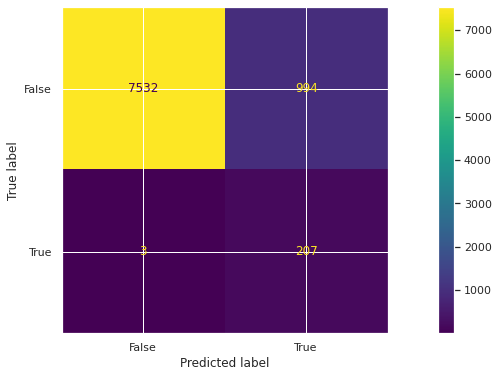

In [ ]:
test_predictions = clf.predict(x_test)
accuracy = accuracy_score(y_test, train_predictions)
print(f"Accuracy test {name}: %.2f%%" % (accuracy * 100.0))
ConfusionMatrixDisplay.from_predictions(y_test, test_predictions)
plt.show()

Como se Puede ver utilizando un Arbol de Decisión o un modelos Adaboost se puede obtener un Accuracy de 99.99% en la prediccion de la multa.

## Prediccion de Demanda

Para la Predicción de la demanda se utilizara un modelo de Regresion Lineal para predecir la Potencia Activa Total.

In [ ]:
#print(df_1.shape)
#print(df_1.describe())
imputer_cols = ['Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_Avg', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C', 'Current_UNB_Worst', 'Energy_Acum_Datetime',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A_N', 'Voltage_B_C', 'Voltage_B_N',
       'Voltage_C_A', 'Voltage_C_N', 'Voltage_L_L_Avg', 'Voltage_L_N_Avg',
       'Voltage_UNB_A_B', 'Voltage_UNB_A_N', 'Voltage_UNB_B_C',
       'Voltage_UNB_B_N', 'Voltage_UNB_C_A', 'Voltage_UNB_C_N',
       'Voltage_UNB_L_L_Worst', 'Voltage_UNB_L_N_Worst', 'rsrv1',
       'rsrv2', 'rsrv3', 'rsrv4', 'hour_col', 'close_diff']


imputer = SimpleImputer(strategy="median")
#imputer = KNNImputer(n_neighbors=2)
df_1[imputer_cols] = imputer.fit_transform(df_1[imputer_cols])
y = df_1.Active_Power_Total
X = df_1.drop(['Active_Power_Total','close_diff', '_id', 'createdAt.1'],axis=1)
X

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,multa
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,119489.99,4.10,370.45,119119.55,119860.44,3.71,0.35,1.70,155397.44,930.37,4.0,3.93,0.45,1.72,5.92,16.85,0.0,1.89,7.32,13.0,11.23,2.0,1.0,2.0,0.0,0.0,50.01,0.94,0.79,1.01,0.97,95216.23,177.38,95038.87,95393.62,1.31,0.27,-0.22,1.36,46.16,380.0,233.46,391.0,235.12,383.0,234.80,380.0,234.46,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 00:15:00,119491.10,3.95,370.45,119120.66,119861.55,2.15,0.43,0.82,155398.59,930.37,4.0,2.45,0.54,0.88,3.59,10.39,0.0,2.29,3.75,13.0,6.53,2.0,1.0,2.0,0.0,0.0,50.13,0.88,0.80,1.07,0.95,95216.59,177.38,95039.22,95393.97,1.17,0.33,-0.33,1.17,46.16,380.0,235.45,391.0,235.02,383.0,235.99,380.0,235.48,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 00:30:00,119492.08,4.22,370.45,119121.64,119862.53,2.31,0.37,0.82,155399.64,930.37,4.0,2.65,0.47,0.88,3.72,11.28,0.0,2.01,3.75,13.0,7.74,2.0,1.0,2.0,0.0,0.0,50.04,0.87,0.79,1.07,0.94,95216.94,177.38,95039.56,95394.32,1.31,0.29,-0.33,1.27,46.46,380.0,234.94,391.0,234.85,383.0,235.72,380.0,235.17,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 00:45:00,119493.08,4.04,370.45,119122.64,119863.53,2.89,0.37,0.96,155400.69,930.37,4.0,3.12,0.47,0.98,4.41,13.32,0.0,2.00,4.17,13.0,9.67,2.0,1.0,2.0,0.0,0.0,50.05,0.93,0.79,1.02,0.96,95217.27,177.38,95039.90,95394.65,1.18,0.29,-0.21,1.25,45.85,380.0,234.66,391.0,235.55,383.0,236.06,380.0,235.42,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 01:00:00,119494.09,3.92,370.45,119123.64,119864.54,2.15,0.37,0.96,155401.75,930.37,4.0,2.45,0.47,0.98,3.70,10.40,0.0,2.01,4.18,13.0,6.84,2.0,1.0,2.0,0.0,0.0,50.04,0.88,0.79,1.02,0.94,95217.59,177.38,95040.22,95394.98,1.18,0.29,-0.21,1.26,45.24,380.0,235.39,391.0,235.45,383.0,235.89,380.0,235.58,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,1.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-31 22:45:00,294244.22,3.93,433.30,293810.91,294677.53,2.70,0.34,1.25,385317.03,1145.85,4.0,2.89,0.47,1.32,4.40,14.09,0.0,2.00,5.64,13.0,8.05,2.0,1.0,2.0,0.0,0.0,50.02,0.93,0.73,1.05,0.98,238030.23,464.95,237565.30,238495.20,1.04,0.32,-0.41,0.95,41.25,380.0,233.58,391.0,234.04,383.0,233.80,380.0,233.81,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,22.0,False
2022-03-31 23:00:00,294245.25,4.07,433.30,293811.94,294678.56,2.79,0.34,1.26,385318.06,1145.85,4.0,3.00,0.47,1.32,4.50,10.16,0.0,2.01,5.63,13.0,4.12,2.0,1.0,2.0,0.0,0.0,50.09,0.93,0.73,1.05,0.97,238030.44,464.95,237565.48,238495.38,1.10,0.32,-0.41,1.01,41.25,380.0,234.94,391.0,234.65,383.0,234.75,380.0,234.78,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,23.0,False
2022-03-31 23:15:00,294246.28,4.17,433.30,293812.97,294679.56,

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=99)
X_train.shape, X_test.shape

((34944, 62), (8736, 62))

In [ ]:
#convertimos en vector
#X_train = X_train.values.reshape(-1, 1)
#X_test = X_test.values.reshape(-1, 1)
#X_train.shape, X_test.shape

In [ ]:
# Importamos la clase de Regresión Lineal de scikit-learn
from sklearn.linear_model import LinearRegression 
regresion_lineal = LinearRegression() # creamos una instancia de LinearRegression
# instruimos a la regresión lineal que aprenda de los datos (x,y)
regresion_lineal.fit(X_train, y_train) 
# vemos los parámetros que ha estimado la regresión lineal
print('w = ' + str(regresion_lineal.coef_) + ', b = ' + str(regresion_lineal.intercept_))

w = [ 4.50608982e-02 -3.74181544e-05  7.78737869e-03 -1.84097556e-02
 -2.66569030e-02  1.00495273e+00  9.95081904e-01  1.00042400e+00
  5.55718754e-06 -8.56201201e-05  1.00063846e-11 -5.22087741e-03
  2.77004944e-03  2.15358954e-03 -2.66768609e-05 -5.53211758e-05
 -2.98039371e-13 -3.24687361e-04  4.04156604e-04  1.68087766e-13
  2.23347357e-04  1.29452005e-13  1.66866521e-13 -7.29138971e-14
 -2.48134846e-14 -1.20459198e-14  1.31401729e-03  9.86110736e-03
 -8.18303852e-03  4.24351972e-03 -1.86847392e-02  7.86140162e-04
 -4.78587772e-03 -2.86387378e-03  2.07585826e-03  6.32010536e-01
  6.29686813e-01  6.31262366e-01 -6.31107589e-01 -1.21274675e-05
  0.00000000e+00  3.08024056e-01  0.00000000e+00  3.04115957e-01
  0.00000000e+00  3.10351034e-01  0.00000000e+00 -9.22781732e-01
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -8.42836960e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  4.78638990e-05  4.7

In [ ]:
# importamos el cálculo del error cuadrático medio (MSE)
from sklearn.metrics import mean_squared_error
import numpy as np
# Predecimos los valores y para los datos usados en el entrenamiento
prediccion_entrenamiento = regresion_lineal.predict(X_test)
# Calculamos el Error Cuadrático Medio (MSE = Mean Squared Error)
mse = mean_squared_error(y_test, prediccion_entrenamiento)
# La raíz cuadrada del MSE es el RMSE
rmse = np.sqrt(mse)
print('Error Cuadrático Medio (MSE) = ' + str(mse))
print('Raíz del Error Cuadrático Medio (RMSE) = ' + str(rmse))

Error Cuadrático Medio (MSE) = 3.8037211750860954e-05
Raíz del Error Cuadrático Medio (RMSE) = 0.006167431535968677


In [ ]:
# calculamos el coeficiente de determinación R2
r2 = regresion_lineal.score(X_test, y_test)
print('Coeficiente de Determinación R2 = ' + str(r2))

Coeficiente de Determinación R2 = 0.9999998730105518


#Modelo de Predicción en función del valor de la Temperatura Ambiente

###Predicción Temperatura maquina con Temperatura de Ambiente







Text(0.5, 0.98, 'Temperatura Ambiente Vs Temperatura de Maquina')

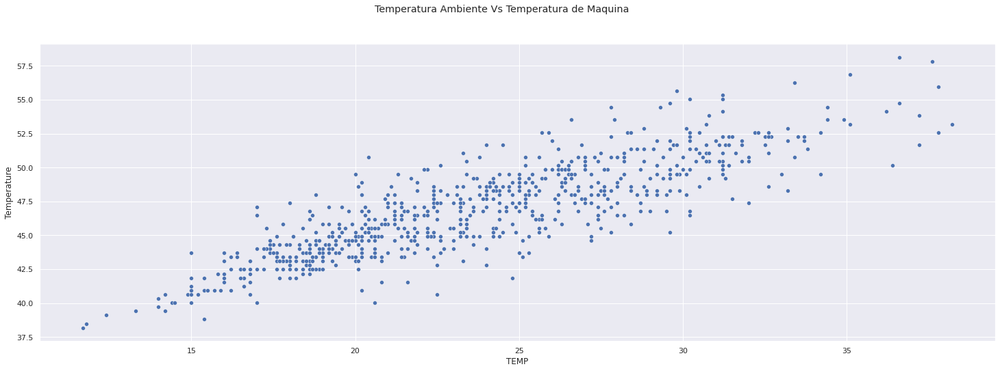

In [ ]:
fig = plt.figure(figsize=(25,8))
seaborn.scatterplot(data=df_merged, y='Temperature', x='TEMP')
fig.suptitle('Temperatura Ambiente Vs Temperatura de Maquina')


In [ ]:
df_merged = df_merged.dropna(axis=0) #sacando 2 valores NAN
df_merged.loc[df_merged['Temperature'].isna()]

,Current_A,Current_B,Current_C,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Active_Power_Total,Temperature,FECHA,HORA,TEMP,HUM,PNM,DD,FF,NOMBRE,DATETIME,DATE,TIME
createdAt,,,,,,,,,,,,,,,,,,,


In [ ]:
from sklearn.model_selection import train_test_split
X= df_merged['TEMP']
y = df_merged['Temperature']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=45)
X_train.shape, X_test.shape

((574,), (144,))

In [ ]:
#convertimos en vector
X_train = X_train.values.reshape(-1, 1)
X_test = X_test.values.reshape(-1, 1)
X_train.shape, X_test.shape

((574, 1), (144, 1))

In [ ]:
# Importamos la clase de Regresión Lineal de scikit-learn
from sklearn.linear_model import LinearRegression 
regresion_lineal = LinearRegression() # creamos una instancia de LinearRegression
# instruimos a la regresión lineal que aprenda de los datos (x,y)
regresion_lineal.fit(X_train, y_train) 
# vemos los parámetros que ha estimado la regresión lineal
print('w = ' + str(regresion_lineal.coef_) + ', b = ' + str(regresion_lineal.intercept_))

w = [0.5791383], b = 33.19913903720583


In [ ]:
# importamos el cálculo del error cuadrático medio (MSE)
from sklearn.metrics import mean_squared_error
import numpy as np
# Predecimos los valores y para los datos usados en el entrenamiento
prediccion_entrenamiento = regresion_lineal.predict(X_test.reshape(-1,1))
# Calculamos el Error Cuadrático Medio (MSE = Mean Squared Error)
mse = mean_squared_error(y_test, prediccion_entrenamiento)
# La raíz cuadrada del MSE es el RMSE
rmse = np.sqrt(mse)
print('Error Cuadrático Medio (MSE) = ' + str(mse))
print('Raíz del Error Cuadrático Medio (RMSE) = ' + str(rmse))

Error Cuadrático Medio (MSE) = 3.406652437094491
Raíz del Error Cuadrático Medio (RMSE) = 1.8457119052264064


In [ ]:
# calculamos el coeficiente de determinación R2
r2 = regresion_lineal.score(X_test.reshape(-1,1), y_test)
print('Coeficiente de Determinación R2 = ' + str(r2))

Coeficiente de Determinación R2 = 0.7206338891474067


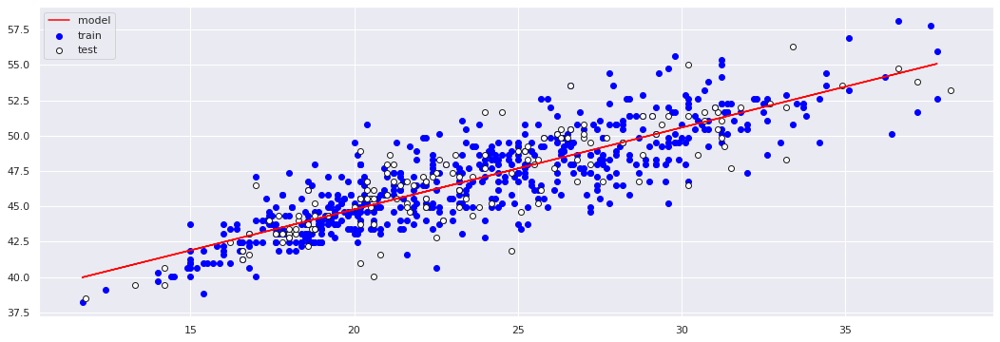

In [ ]:
#w = linear_least_squares(X_train, y_train)
plt.scatter(X_train, y_train, color="blue", label="train")
plt.scatter(X_test, y_test, color="white", edgecolor="k", label="test")
plt.plot(X_train, regresion_lineal.predict(X_train.reshape(-1, 1)), color="red", label="model")
#plt.plot(x, f(X_train, w), color="red", label="model")
#plt.plot(x, f_x, color="green", label="$\sin(2\pi x)$")
plt.legend()
plt.show()

## Prediccion de Temperatura de Maquina en funcion de las variables disponibles



Para la Predicción de la demanda se utilizara un modelo de Regresion Lineal para predecir la Potencia Activa Total.

In [ ]:
print(df_1.shape)
print(df_1.describe())
imputer_cols = ['Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_Avg', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C', 'Current_UNB_Worst', 'Energy_Acum_Datetime',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A_N', 'Voltage_B_C', 'Voltage_B_N',
       'Voltage_C_A', 'Voltage_C_N', 'Voltage_L_L_Avg', 'Voltage_L_N_Avg',
       'Voltage_UNB_A_B', 'Voltage_UNB_A_N', 'Voltage_UNB_B_C',
       'Voltage_UNB_B_N', 'Voltage_UNB_C_A', 'Voltage_UNB_C_N',
       'Voltage_UNB_L_L_Worst', 'Voltage_UNB_L_N_Worst', 'rsrv1',
       'rsrv2', 'rsrv3', 'rsrv4', 'hour_col', 'close_diff']


imputer = SimpleImputer(strategy="median")
#imputer = KNNImputer(n_neighbors=2)
df_1[imputer_cols] = imputer.fit_transform(df_1[imputer_cols])
y = df_1.Temperature
X = df_1.drop(['Temperature','close_diff', '_id', 'createdAt.1'],axis=1)
X

(43680, 66)
       Active_Energy_Delivered  Active_Energy_LastDay  Active_Energy_Received  \
count             43680.000000           43680.000000            43680.000000   
mean             236157.777267              11.481952              414.444303   
std               38736.270803              17.214824               18.815161   
min                   0.000000              -0.630000                0.900000   
25%              231752.185000               4.410000              417.050000   
50%              242371.630000               4.630000              417.170000   
75%              250703.122500               4.910000              418.290000   
max              294248.190000              85.220000              433.300000   

       Active_Energy_del_m_rec  Active_Energy_del_p_rec  Active_Power_A  \
count             43680.000000             43680.000000    43680.000000   
mean             235743.331708            236572.220128        5.218899   
std               38720.648863   

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,rsrv1,rsrv2,rsrv3,rsrv4,hour_col,multa
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,119489.99,4.10,370.45,119119.55,119860.44,3.71,0.35,1.70,5.76,155397.44,930.37,4.0,3.93,0.45,1.72,5.92,16.85,0.0,1.89,7.32,13.0,11.23,2.0,1.0,2.0,0.0,0.0,50.01,0.94,0.79,1.01,0.97,95216.23,177.38,95038.87,95393.62,1.31,0.27,-0.22,1.36,380.0,233.46,391.0,235.12,383.0,234.80,380.0,234.46,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 00:15:00,119491.10,3.95,370.45,119120.66,119861.55,2.15,0.43,0.82,3.39,155398.59,930.37,4.0,2.45,0.54,0.88,3.59,10.39,0.0,2.29,3.75,13.0,6.53,2.0,1.0,2.0,0.0,0.0,50.13,0.88,0.80,1.07,0.95,95216.59,177.38,95039.22,95393.97,1.17,0.33,-0.33,1.17,380.0,235.45,391.0,235.02,383.0,235.99,380.0,235.48,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 00:30:00,119492.08,4.22,370.45,119121.64,119862.53,2.31,0.37,0.82,3.50,155399.64,930.37,4.0,2.65,0.47,0.88,3.72,11.28,0.0,2.01,3.75,13.0,7.74,2.0,1.0,2.0,0.0,0.0,50.04,0.87,0.79,1.07,0.94,95216.94,177.38,95039.56,95394.32,1.31,0.29,-0.33,1.27,380.0,234.94,391.0,234.85,383.0,235.72,380.0,235.17,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 00:45:00,119493.08,4.04,370.45,119122.64,119863.53,2.89,0.37,0.96,4.23,155400.69,930.37,4.0,3.12,0.47,0.98,4.41,13.32,0.0,2.00,4.17,13.0,9.67,2.0,1.0,2.0,0.0,0.0,50.05,0.93,0.79,1.02,0.96,95217.27,177.38,95039.90,95394.65,1.18,0.29,-0.21,1.25,380.0,234.66,391.0,235.55,383.0,236.06,380.0,235.42,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,False
2021-01-01 01:00:00,119494.09,3.92,370.45,119123.64,119864.54,2.15,0.37,0.96,3.48,155401.75,930.37,4.0,2.45,0.47,0.98,3.70,10.40,0.0,2.01,4.18,13.0,6.84,2.0,1.0,2.0,0.0,0.0,50.04,0.88,0.79,1.02,0.94,95217.59,177.38,95040.22,95394.98,1.18,0.29,-0.21,1.26,380.0,235.39,391.0,235.45,383.0,235.89,380.0,235.58,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,1.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-31 22:45:00,294244.22,3.93,433.30,293810.91,294677.53,2.70,0.34,1.25,4.30,385317.03,1145.85,4.0,2.89,0.47,1.32,4.40,14.09,0.0,2.00,5.64,13.0,8.05,2.0,1.0,2.0,0.0,0.0,50.02,0.93,0.73,1.05,0.98,238030.23,464.95,237565.30,238495.20,1.04,0.32,-0.41,0.95,380.0,233.58,391.0,234.04,383.0,233.80,380.0,233.81,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,22.0,False
2022-03-31 23:00:00,294245.25,4.07,433.30,293811.94,294678.56,2.79,0.34,1.26,4.39,385318.06,1145.85,4.0,3.00,0.47,1.32,4.50,10.16,0.0,2.01,5.63,13.0,4.12,2.0,1.0,2.0,0.0,0.0,50.09,0.93,0.73,1.05,0.97,238030.44,464.95,237565.48,238495.38,1.10,0.32,-0.41,1.01,380.0,234.94,391.0,234.65,383.0,234.75,380.0,234.78,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0,0.0,0.0,23.0,False
2022-03-31 23:15:00,294246.28,4.17,433.30,293812.97,294679.56,

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=99)
X_train.shape, X_test.shape

((34944, 62), (8736, 62))

In [ ]:
#convertimos en vector
#X_train = X_train.values.reshape(-1, 1)
#X_test = X_test.values.reshape(-1, 1)
#X_train.shape, X_test.shape

In [ ]:
# Importamos la clase de Regresión Lineal de scikit-learn
from sklearn.linear_model import LinearRegression 
regresion_lineal = LinearRegression() # creamos una instancia de LinearRegression
# instruimos a la regresión lineal que aprenda de los datos (x,y)
regresion_lineal.fit(X_train, y_train) 
# vemos los parámetros que ha estimado la regresión lineal
print('w = ' + str(regresion_lineal.coef_) + ', b = ' + str(regresion_lineal.intercept_))

w = [ 1.87493247e-01  1.16337987e-01  2.65998659e+01  1.39001816e+01
 -1.40343289e+01  1.92261900e+00  2.16322142e+00 -4.65236473e-01
 -1.08574373e+00 -6.61938602e-02  3.34862785e-01 -7.13474210e-11
 -3.97534627e-01 -8.69773123e-01  5.35796017e-01  1.72382678e-01
  3.48378565e-01  1.69397829e-12 -2.24938198e-01 -1.53438488e-01
 -8.02025113e-13 -1.76426906e-01  1.29363187e-12  3.91175980e-12
 -8.58424443e-13  3.43280959e-13  8.50500226e-13  2.02018352e+00
 -7.80480060e-01  2.73134095e+00 -2.94192218e+00 -9.45915436e+00
 -1.96591873e-01 -5.49984150e+00 -2.60265310e+00  2.84070877e+00
 -1.88852053e-01 -6.76792836e-01 -1.01675607e+00  5.31436567e-01
  0.00000000e+00  2.35571869e+00  0.00000000e+00  1.75041693e+00
  0.00000000e+00  3.46077991e-01  0.00000000e+00 -4.53554695e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.85585727e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.13174538e-01  5.7

In [ ]:
# importamos el cálculo del error cuadrático medio (MSE)
from sklearn.metrics import mean_squared_error
import numpy as np
# Predecimos los valores y para los datos usados en el entrenamiento
prediccion_entrenamiento = regresion_lineal.predict(X_test)
# Calculamos el Error Cuadrático Medio (MSE = Mean Squared Error)
mse = mean_squared_error(y_test, prediccion_entrenamiento)
# La raíz cuadrada del MSE es el RMSE
rmse = np.sqrt(mse)
print('Error Cuadrático Medio (MSE) = ' + str(mse))
print('Raíz del Error Cuadrático Medio (RMSE) = ' + str(rmse))

Error Cuadrático Medio (MSE) = 7.76914278479975
Raíz del Error Cuadrático Medio (RMSE) = 2.787318206592091


In [ ]:
# calculamos el coeficiente de determinación R2
r2 = regresion_lineal.score(X_test, y_test)
print('Coeficiente de Determinación R2 = ' + str(r2))

Coeficiente de Determinación R2 = 0.6507747005996595


#Aprendizaje No Supervisado - Clusterización (Noviembre 2020)

###Ingesta de Dataframes

In [ ]:
file_input = "file20201101_mes.csv"
df_1 = pandas.read_csv(file_input)

Preparación del dataframe de consumo de energia

In [ ]:
df_1.index = pandas.to_datetime(
    df_1['createdAt'],
    errors="coerce",
    format='%Y%m%d %H:%M:%S.%f',
    ).dt.tz_convert(None)
    #2020-11-30 23:59:12.616

In [ ]:
df_1

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-30 00:00:12.342,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.31,0.94,3.25,138069.09,906.87,4,2.36,0.37,0.97,3.48,10.18,0,1.56,4.19,13,6.40,2,1,2,0,0,50.04,0.85,0.82,1.03,0.93,83686.04,156.42,83529.62,83842.46,1.25,0.22,-0.22,1.24,43.09,380,231.71,391,231.29,383,231.40,380,231.47,30,12,23,15,26,15,12,5,2020-11-30T00:00:12.342Z,0,0,0,0
2020-11-30 00:00:22.759,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.11,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.46,1.25,0.20,-0.22,1.23,42.48,380,231.67,391,231.16,383,231.36,380,231.40,30,12,23,15,26,15,12,5,2020-11-30T00:00:22.759Z,0,0,0,0
2020-11-30 00:00:39.117,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.12,906.87,4,2.36,0.36,0.97,3.47,10.18,0,1.60,4.19,13,6.41,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.47,1.25,0.20,-0.22,1.23,42.78,380,231.77,391,231.28,383,231.48,380,231.51,30,12,23,15,26,15,12,5,2020-11-30T00:00:39.117Z,0,0,0,0
2020-11-30 00:00:48.160,106852.32,3.81,362.77,106489.55,107215.09,2.00,0.30,0.94,3.25,138069.14,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.05,156.42,83529.64,83842.47,1.25,0.21,-0.22,1.23,43.09,380,231.84,391,231.39,383,231.53,380,231.59,30,12,23,15,26,15,12,5,2020-11-30T00:00:48.160Z,0,0,0,0
2020-11-30 00:00:58.693,106852.33,3.81,362.77,106489.55,107215.10,1.81,0.29,0.94,3.05,138069.14,906.87,4,2.06,0.36,0.97,3.19,8.86,0,1.56,4.19,13,5.22,2,1,2,0,0,50.04,0.88,0.82,1.03,0.95,83686.05,156.42,83529.64,83842.48,0.98,0.20,-0.22,0.95,43.09,380,232.03,391,231.38,383,231.35,380,231.59,30,12,23,15,26,15,12,5,2020-11-30T00:00:58.693Z,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-01 23:58:06.425,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.67,906.69,4,1.95,0.38,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,42.48,380,235.46,391,234.58,383,234.72,380,234.92,30,12,23,15,26,15,12,5,2020-11-01T23:58:06.425Z,0,0,0,0
2020-11-01 23:58:18.775,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.68,906.69,4,1.95,0.38,0.92,2.98,8.28,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,41.87,380,235.48,391,234.62,383,234.79,380,234.96,30,12,23,15,26,15,12,5,2020-11-01T23:58:18.775Z,0,0,0,0
2020-11-01 23:58:29.311,95656.47,3.77,362.76,95293.71,96019.23,1.83,0.32,0.80,2.95,122900.69,906.69,4,1.95,0.37,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.4

In [ ]:
#df = pandas.DataFrame({'my_dates':['2015-01-01','2022-01-02','2015-01-03'],'myvals':[1,2,3]})
df_1['createdAt'] = pandas.to_datetime(df_1['createdAt'])
df_1['day_number'] = df_1['createdAt'].dt.weekday
df_1['day_of_week'] = df_1['createdAt'].dt.day_name()
df_1['hour'] = df_1['createdAt'].dt.hour
df_1


,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4,day_number,day_of_week,hour
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-30 00:00:12.342,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.31,0.94,3.25,138069.09,906.87,4,2.36,0.37,0.97,3.48,10.18,0,1.56,4.19,13,6.40,2,1,2,0,0,50.04,0.85,0.82,1.03,0.93,83686.04,156.42,83529.62,83842.46,1.25,0.22,-0.22,1.24,43.09,380,231.71,391,231.29,383,231.40,380,231.47,30,12,23,15,26,15,12,5,2020-11-30 00:00:12.342000+00:00,0,0,0,0,0,Monday,0
2020-11-30 00:00:22.759,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.11,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.46,1.25,0.20,-0.22,1.23,42.48,380,231.67,391,231.16,383,231.36,380,231.40,30,12,23,15,26,15,12,5,2020-11-30 00:00:22.759000+00:00,0,0,0,0,0,Monday,0
2020-11-30 00:00:39.117,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.12,906.87,4,2.36,0.36,0.97,3.47,10.18,0,1.60,4.19,13,6.41,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.47,1.25,0.20,-0.22,1.23,42.78,380,231.77,391,231.28,383,231.48,380,231.51,30,12,23,15,26,15,12,5,2020-11-30 00:00:39.117000+00:00,0,0,0,0,0,Monday,0
2020-11-30 00:00:48.160,106852.32,3.81,362.77,106489.55,107215.09,2.00,0.30,0.94,3.25,138069.14,906.87,4,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13,6.40,2,1,2,0,0,50.05,0.85,0.82,1.03,0.94,83686.05,156.42,83529.64,83842.47,1.25,0.21,-0.22,1.23,43.09,380,231.84,391,231.39,383,231.53,380,231.59,30,12,23,15,26,15,12,5,2020-11-30 00:00:48.160000+00:00,0,0,0,0,0,Monday,0
2020-11-30 00:00:58.693,106852.33,3.81,362.77,106489.55,107215.10,1.81,0.29,0.94,3.05,138069.14,906.87,4,2.06,0.36,0.97,3.19,8.86,0,1.56,4.19,13,5.22,2,1,2,0,0,50.04,0.88,0.82,1.03,0.95,83686.05,156.42,83529.64,83842.48,0.98,0.20,-0.22,0.95,43.09,380,232.03,391,231.38,383,231.35,380,231.59,30,12,23,15,26,15,12,5,2020-11-30 00:00:58.693000+00:00,0,0,0,0,0,Monday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-01 23:58:06.425,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.67,906.69,4,1.95,0.38,0.92,2.98,8.29,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,42.48,380,235.46,391,234.58,383,234.72,380,234.92,30,12,23,15,26,15,12,5,2020-11-01 23:58:06.425000+00:00,0,0,0,0,6,Sunday,23
2020-11-01 23:58:18.775,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.68,906.69,4,1.95,0.38,0.92,2.98,8.28,0,1.60,3.91,13,4.90,2,1,2,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,41.87,380,235.48,391,234.62,383,234.79,380,234.96,30,12,23,15,26,15,12,5,2020-11-01 23:58:18.775000+00:00,0,0,0,0,6,Sunday,23
2020-11-01 23:58:29.311,95656.47,3.77,362.76,95293.71,9601

In [ ]:
# create a group using groupby
group = df_1.groupby('day_of_week')
  
# count the observations
group.count()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4,day_number,hour
day_of_week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Friday,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967,27967
Monday,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733,34733
Saturday,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581,29581
Sunday,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833,36833
Thursday,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278,28278
Tuesday,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445,27445
Wednesday,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399,27399


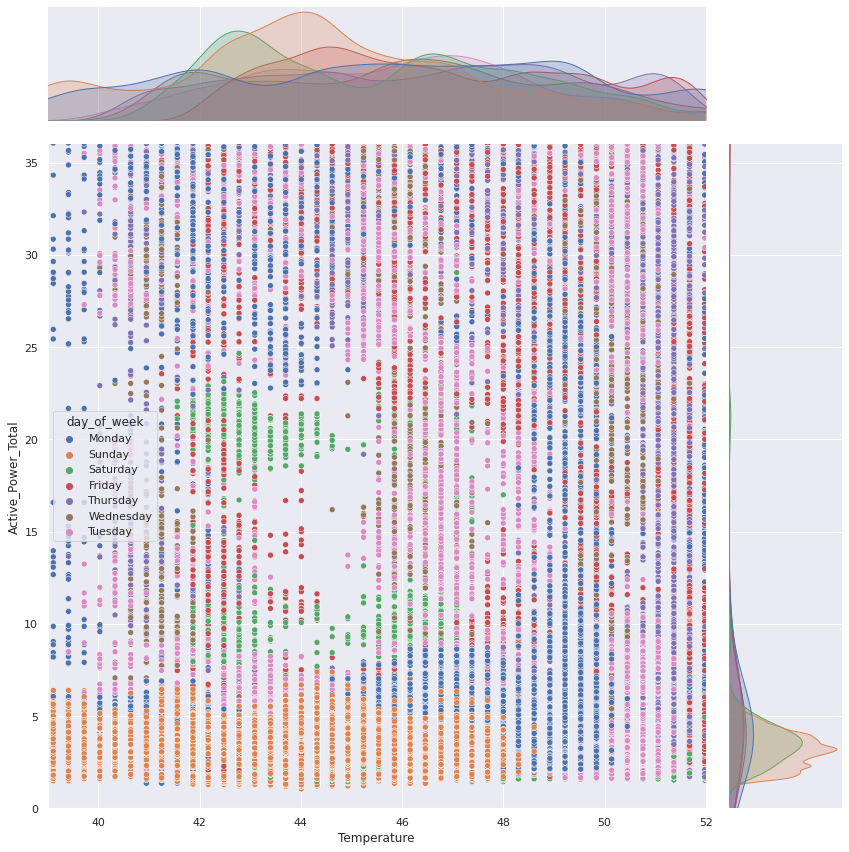

In [ ]:
plot = seaborn.jointplot(data = df_1 , x = 'Temperature', y = 'Active_Power_Total', hue='day_of_week', height=12)
plot.ax_marg_x.set_xlim(39, 52)
plot.ax_marg_y.set_ylim(0, 36)
plt.show()

In [ ]:
import pandas
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, classification_report
from sklearn.tree import DecisionTreeClassifier

In [ ]:
#Columnas con valores 0
cols = df_1[df_1 == 0].count(axis=0)
cols[cols > 0]

Current_Avg             212236
Current_UNB_Worst       212236
Energy_Acum_Datetime    212236
Reactive_Power_Total        58
rsrv1                   212236
rsrv2                   212236
rsrv3                   212236
rsrv4                   212236
day_number               34733
hour                      9337
dtype: int64

In [ ]:

imputer_cols = ['Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A_N', 'Voltage_B_C', 'Voltage_B_N',
       'Voltage_C_A', 'Voltage_C_N', 'Voltage_L_L_Avg', 'Voltage_L_N_Avg',
       'Voltage_UNB_A_B', 'Voltage_UNB_A_N', 'Voltage_UNB_B_C',
       'Voltage_UNB_B_N', 'Voltage_UNB_C_A', 'Voltage_UNB_C_N',
       'Voltage_UNB_L_L_Worst', 'Voltage_UNB_L_N_Worst','day_number','hour']


imputer = SimpleImputer(strategy="median")
#imputer = KNNImputer(n_neighbors=2)
df_1[imputer_cols] = imputer.fit_transform(df_1[imputer_cols])
X = df_1.drop(['Current_Avg','Current_UNB_Worst','Energy_Acum_Datetime','rsrv1','rsrv2', 'rsrv3', 'rsrv4','createdAt','day_of_week'],axis=1) 
#X = df_1.drop(['day_of_week'],axis=1) 
X

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-30 00:00:12.342,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.31,0.94,3.25,138069.09,906.87,4.0,2.36,0.37,0.97,3.48,10.18,1.56,4.19,13.0,6.40,2.0,1.0,2.0,50.04,0.85,0.82,1.03,0.93,83686.04,156.42,83529.62,83842.46,1.25,0.22,-0.22,1.24,43.09,380.0,231.71,391.0,231.29,383.0,231.40,380.0,231.47,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0
2020-11-30 00:00:22.759,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.11,906.87,4.0,2.36,0.36,0.97,3.47,10.19,1.56,4.19,13.0,6.40,2.0,1.0,2.0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.46,1.25,0.20,-0.22,1.23,42.48,380.0,231.67,391.0,231.16,383.0,231.36,380.0,231.40,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0
2020-11-30 00:00:39.117,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.12,906.87,4.0,2.36,0.36,0.97,3.47,10.18,1.60,4.19,13.0,6.41,2.0,1.0,2.0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.47,1.25,0.20,-0.22,1.23,42.78,380.0,231.77,391.0,231.28,383.0,231.48,380.0,231.51,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0
2020-11-30 00:00:48.160,106852.32,3.81,362.77,106489.55,107215.09,2.00,0.30,0.94,3.25,138069.14,906.87,4.0,2.36,0.36,0.97,3.47,10.19,1.56,4.19,13.0,6.40,2.0,1.0,2.0,50.05,0.85,0.82,1.03,0.94,83686.05,156.42,83529.64,83842.47,1.25,0.21,-0.22,1.23,43.09,380.0,231.84,391.0,231.39,383.0,231.53,380.0,231.59,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0
2020-11-30 00:00:58.693,106852.33,3.81,362.77,106489.55,107215.10,1.81,0.29,0.94,3.05,138069.14,906.87,4.0,2.06,0.36,0.97,3.19,8.86,1.56,4.19,13.0,5.22,2.0,1.0,2.0,50.04,0.88,0.82,1.03,0.95,83686.05,156.42,83529.64,83842.48,0.98,0.20,-0.22,0.95,43.09,380.0,232.03,391.0,231.38,383.0,231.35,380.0,231.59,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-01 23:58:06.425,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.67,906.69,4.0,1.95,0.38,0.92,2.98,8.29,1.60,3.91,13.0,4.90,2.0,1.0,2.0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,42.48,380.0,235.46,391.0,234.58,383.0,234.72,380.0,234.92,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,6.0,23.0
2020-11-01 23:58:18.775,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.68,906.69,4.0,1.95,0.38,0.92,2.98,8.28,1.60,3.91,13.0,4.90,2.0,1.0,2.0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,41.87,380.0,235.48,391.0,234.62,383.0,234.79,380.0,234.96,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,6.0,23.0
2020-11-01 23:58:29.311,95656.47,3.77,362.76,95293.71,96019.23,1.83,0.32,0.80,2.95,122900.69,906.69,4.0,1.95,0.37,0.92,2.98,8.29,1.60,3.91,13.0,4.90,2.0,1.0,2.0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,42.17,380.0,235.44,391.0,234.57,383.0,234.71,380.0,234.91,30.0,12.0,23

In [ ]:
x_names = X.columns
X = StandardScaler().fit_transform(X[imputer_cols])
X = pandas.DataFrame(X, columns=x_names)
X

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour
0,1.509273,-0.564813,0.298335,1.509275,1.509268,-0.604995,-0.584413,-0.533160,-0.577694,1.497863,0.298335,0.0,-0.592353,-0.581962,-0.541899,-0.576152,-0.587627,-0.580042,-0.539925,0.0,-0.796012,0.0,0.0,0.0,0.485688,0.208217,0.123540,0.772406,0.673763,1.484261,1.301884,1.484279,1.484236,-0.551471,-0.556132,-0.570185,-0.560489,-0.808734,0.0,0.178193,0.0,-0.023888,0.0,-0.195147,0.0,0.006635,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174
1,1.509273,-0.564813,0.298335,1.509275,1.509268,-0.604995,-0.585889,-0.533160,-0.578190,1.497867,0.298335,0.0,-0.592353,-0.583012,-0.541899,-0.576500,-0.587404,-0.580042,-0.539925,0.0,-0.796012,0.0,0.0,0.0,0.727380,0.208217,0.123540,0.772406,0.761547,1.484261,1.301884,1.484282,1.484236,-0.551471,-0.559087,-0.570185,-0.560970,-0.985625,0.0,0.169077,0.0,-0.059589,0.0,-0.207502,0.0,-0.012416,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174
2,1.509273,-0.564813,0.298335,1.509275,1.509268,-0.604995,-0.585889,-0.533160,-0.578190,1.497870,0.298335,0.0,-0.592353,-0.583012,-0.541899,-0.576500,-0.587627,-0.579096,-0.539925,0.0,-0.794860,0.0,0.0,0.0,0.727380,0.208217,0.123540,0.772406,0.761547,1.484261,1.301884,1.484282,1.484240,-0.551471,-0.559087,-0.570185,-0.560970,-0.898629,0.0,0.191867,0.0,-0.026634,0.0,-0.170436,0.0,0.017521,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174
3,1.509282,-0.564813,0.298335,1.509283,1.509280,-0.604995,-0.585889,-0.533160,-0.577694,1.497874,0.298335,0.0,-0.592353,-0.583012,-0.541899,-0.576500,-0.587404,-0.580042,-0.539925,0.0,-0.796012,0.0,0.0,0.0,0.727380,0.208217,0.123540,0.772406,0.761547,1.484264,1.301884,1.484285,1.484240,-0.551471,-0.557610,-0.570185,-0.560970,-0.808734,0.0,0.207819,0.0,0.003574,0.0,-0.154991,0.0,0.039293,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174
4,1.509284,-0.564813,0.298335,1.509283,1.509283,-0.631380,-0.587365,-0.533160,-0.587626,1.497874,0.298335,0.0,-0.622396,-0.583012,-0.541899,-0.586247,-0.617032,-0.580042,-0.539925,0.0,-0.931897,0.0,0.0,0.0,0.485688,0.505914,0.123540,0.772406,0.849331,1.484264,1.301884,1.484285,1.484243,-0.589817,-0.559087,-0.570185,-0.574427,-0.808734,0.0,0.251119,0.0,0.000828,0.0,-0.210591,0.0,0.039293,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212231,-1.721957,-0.566859,-3.351931,-1.721951,-1.721959,-0.628603,-0.582938,-0.555668,-0.592592,-1.731218,-3.351931,0.0,-0.633412,-0.580913,-0.547325,-0.593557,-0.629730,-0.579096,-0.546823,0.0,-0.968747,0.0,0.0,0.0,-0.964464,1.101308,0.288138,1.401703,1.200465,-1.740668,-1.829940,-1.740635,-1.740714,-0.633845,-0.559087,-0.602930,-0.599898,-0.985625,0.0,1.032799,0.0,0.879620,0.0,0.830366,0.0,0.945563,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.410360,1.621467
212232,-1.721957,-0.566859,-3.351931,-1.721951,-1.721959,-0.628603,-0.582938,-0.555668,-0.592592,-1.731215,-3.351931,0.0,-0.633412,-0.580913,-0.547325,-0.59355

##Clustering-con-Kmeans

Es necesario definirle la cantidad de grupos/clusters (n_clusters), es un hiperparámetro del algoritmo. 


###Elección de la cantidad de grupos/clusters

Una forma de seleccionar la cantidad más adecuada de clusters es probar varias cantidades y usar el criterio del codo: "elbow method", utilizando una medida de ajuste que puede ser Inertia.

In [ ]:
from sklearn.cluster import KMeans,MeanShift

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

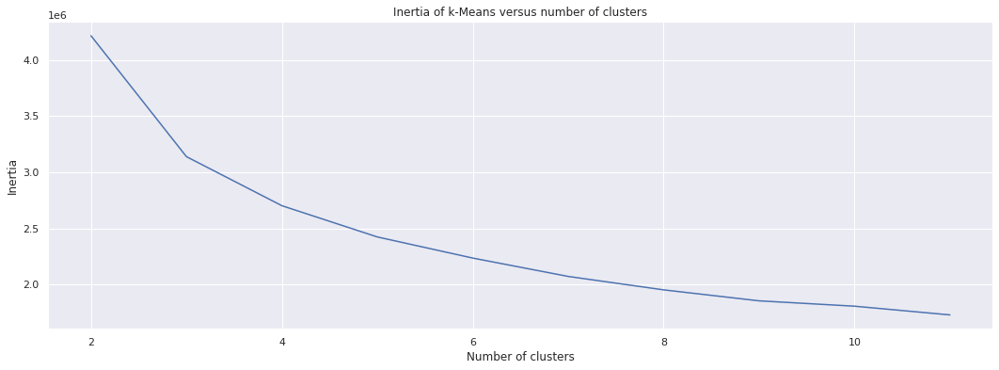

In [ ]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i).fit(X).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

De la grafica anterior se puede ver que el valor de K a utilizar es K=5

###Clusters con K-means

In [ ]:
# Número de clusters buscado
n_clust = 5

km = KMeans(n_clusters=n_clust)
km.fit(X) #utiliza todas las habilidades: 34 dimensiones

# Etiquetas asignadas por el algoritmo
clusters = km.labels_
#print('Suma de los cuadrados de las distancias al centro de cada cluster=Inertia= ', km.inertia_)

In [ ]:
df_clusters=X.copy()
df_clusters['kmeans_5'] = km.labels_ #clusters
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters, nosotros forzamos la cantidad')
df_clusters.head(4)

Kmeans encontró:  5 clusters, nosotros forzamos la cantidad


,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour,kmeans_5
0,1.509273,-0.564813,0.298335,1.509275,1.509268,-0.604995,-0.584413,-0.53316,-0.577694,1.497863,0.298335,0.0,-0.592353,-0.581962,-0.541899,-0.576152,-0.587627,-0.580042,-0.539925,0.0,-0.796012,0.0,0.0,0.0,0.485688,0.208217,0.12354,0.772406,0.673763,1.484261,1.301884,1.484279,1.484236,-0.551471,-0.556132,-0.570185,-0.560489,-0.808734,0.0,0.178193,0.0,-0.023888,0.0,-0.195147,0.0,0.006635,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174,2
1,1.509273,-0.564813,0.298335,1.509275,1.509268,-0.604995,-0.585889,-0.53316,-0.578190,1.497867,0.298335,0.0,-0.592353,-0.583012,-0.541899,-0.576500,-0.587404,-0.580042,-0.539925,0.0,-0.796012,0.0,0.0,0.0,0.727380,0.208217,0.12354,0.772406,0.761547,1.484261,1.301884,1.484282,1.484236,-0.551471,-0.559087,-0.570185,-0.560970,-0.985625,0.0,0.169077,0.0,-0.059589,0.0,-0.207502,0.0,-0.012416,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174,2
2,1.509273,-0.564813,0.298335,1.509275,1.509268,-0.604995,-0.585889,-0.53316,-0.578190,1.497870,0.298335,0.0,-0.592353,-0.583012,-0.541899,-0.576500,-0.587627,-0.579096,-0.539925,0.0,-0.794860,0.0,0.0,0.0,0.727380,0.208217,0.12354,0.772406,0.761547,1.484261,1.301884,1.484282,1.484240,-0.551471,-0.559087,-0.570185,-0.560970,-0.898629,0.0,0.191867,0.0,-0.026634,0.0,-0.170436,0.0,0.017521,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174,2
3,1.509282,-0.564813,0.298335,1.509283,1.509280,-0.604995,-0.585889,-0.53316,-0.577694,1.497874,0.298335,0.0,-0.592353,-0.583012,-0.541899,-0.576500,-0.587404,-0.580042,-0.539925,0.0,-0.796012,0.0,0.0,0.0,0.727380,0.208217,0.12354,0.772406,0.761547,1.484264,1.301884,1.484285,1.484240,-0.551471,-0.557610,-0.570185,-0.560970,-0.808734,0.0,0.207819,0.0,0.003574,0.0,-0.154991,0.0,0.039293,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.460591,-1.629174,2


###Cantidad por clusters

In [ ]:
# creacion de grupos usando groupby
group = df_clusters.groupby('kmeans_5')
  
# conteo de observaciones
group.count()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour
kmeans_5,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179,14179
1,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305,24305
2,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329,79329
3,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912,21912
4,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511,72511


(array([    0., 10000., 20000., 30000., 40000., 50000., 60000., 70000.,
        80000., 90000.]), <a list of 10 Text major ticklabel objects>)

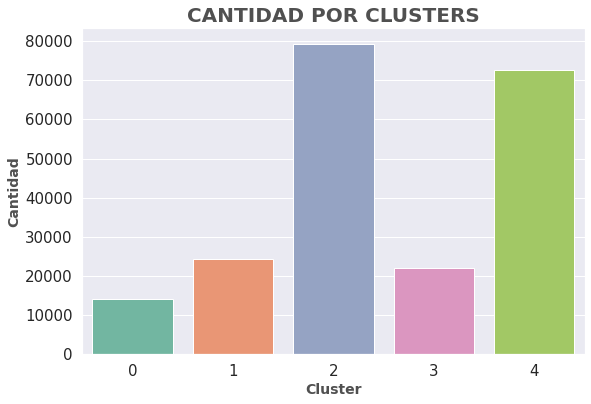

In [ ]:
 #Graficamente podemos verlo de la siguiente manera
import seaborn as sns
fig = plt.figure(figsize=(9,6))
sns.countplot(data=df_clusters, x='kmeans_5', palette="Set2")

plt.title('CANTIDAD POR CLUSTERS', 
            loc='center', color='#505050', fontsize=20, fontweight='bold')

plt.ylabel("Cantidad", size=14, fontweight='bold', color='#505050')
plt.xlabel("Cluster", size=14, fontweight='bold', color='#505050')

plt.xticks(fontsize=15, rotation=0)
plt.yticks(fontsize=15)

###Visualizacion por clusters

In [ ]:
type(df_clusters['kmeans_5'])


pandas.core.series.Series

Uniendo Clusterizacion con dataset original

In [ ]:

df_merged = df_1.merge(df_clusters.kmeans_5, right_on=df_1.index, left_index=True)
df_merged

,key_0,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4,day_number,day_of_week,hour,kmeans_5
0,2020-11-30 00:00:12.342,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.31,0.94,3.25,138069.09,906.87,4.0,2.36,0.37,0.97,3.48,10.18,0,1.56,4.19,13.0,6.40,2.0,1.0,2.0,0,0,50.04,0.85,0.82,1.03,0.93,83686.04,156.42,83529.62,83842.46,1.25,0.22,-0.22,1.24,43.09,380.0,231.71,391.0,231.29,383.0,231.40,380.0,231.47,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:12.342000+00:00,0,0,0,0,0.0,Monday,0.0,2
1,2020-11-30 00:00:22.759,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.11,906.87,4.0,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13.0,6.40,2.0,1.0,2.0,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.46,1.25,0.20,-0.22,1.23,42.48,380.0,231.67,391.0,231.16,383.0,231.36,380.0,231.40,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:22.759000+00:00,0,0,0,0,0.0,Monday,0.0,2
2,2020-11-30 00:00:39.117,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.12,906.87,4.0,2.36,0.36,0.97,3.47,10.18,0,1.60,4.19,13.0,6.41,2.0,1.0,2.0,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.47,1.25,0.20,-0.22,1.23,42.78,380.0,231.77,391.0,231.28,383.0,231.48,380.0,231.51,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:39.117000+00:00,0,0,0,0,0.0,Monday,0.0,2
3,2020-11-30 00:00:48.160,106852.32,3.81,362.77,106489.55,107215.09,2.00,0.30,0.94,3.25,138069.14,906.87,4.0,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13.0,6.40,2.0,1.0,2.0,0,0,50.05,0.85,0.82,1.03,0.94,83686.05,156.42,83529.64,83842.47,1.25,0.21,-0.22,1.23,43.09,380.0,231.84,391.0,231.39,383.0,231.53,380.0,231.59,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:48.160000+00:00,0,0,0,0,0.0,Monday,0.0,2
4,2020-11-30 00:00:58.693,106852.33,3.81,362.77,106489.55,107215.10,1.81,0.29,0.94,3.05,138069.14,906.87,4.0,2.06,0.36,0.97,3.19,8.86,0,1.56,4.19,13.0,5.22,2.0,1.0,2.0,0,0,50.04,0.88,0.82,1.03,0.95,83686.05,156.42,83529.64,83842.48,0.98,0.20,-0.22,0.95,43.09,380.0,232.03,391.0,231.38,383.0,231.35,380.0,231.59,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:58.693000+00:00,0,0,0,0,0.0,Monday,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212231,2020-11-01 23:58:06.425,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.67,906.69,4.0,1.95,0.38,0.92,2.98,8.29,0,1.60,3.91,13.0,4.90,2.0,1.0,2.0,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,42.48,380.0,235.46,391.0,234.58,383.0,234.72,380.0,234.92,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-01 23:58:06.425000+00:00,0,0,0,0,6.0,Sunday,23.0,0
212232,2020-11-01 23:58:18.775,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.68,906.69,4.0,1.95,0.38,0.92,2.98,8.28,0,1.60,3.91,13.0,4.90,2.0,1.0,2.0,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,7

In [ ]:

#df_merged.index = pandas.to_datetime(df_1['createdAt'],infer_datetime_format=True)
#df_merged

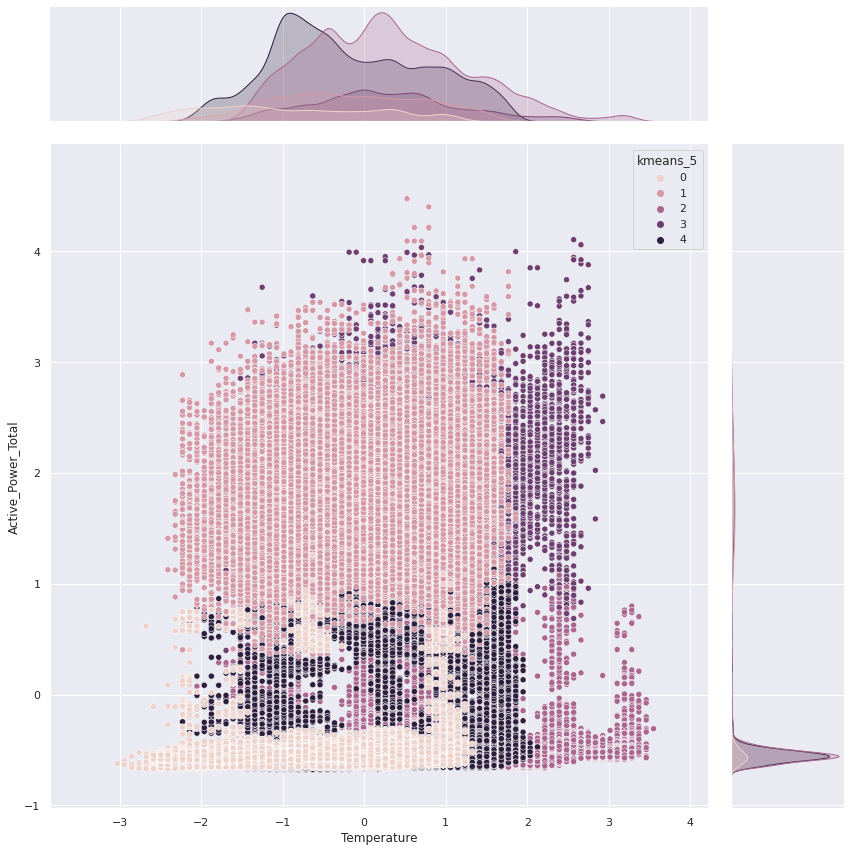

In [ ]:
plot = seaborn.jointplot(data = df_clusters , x = 'Temperature', y = 'Active_Power_Total', hue='kmeans_5', height=12)
#plot.ax_marg_x.set_xlim(39, 52)
#plot.ax_marg_y.set_ylim(0, 36)
plt.show()

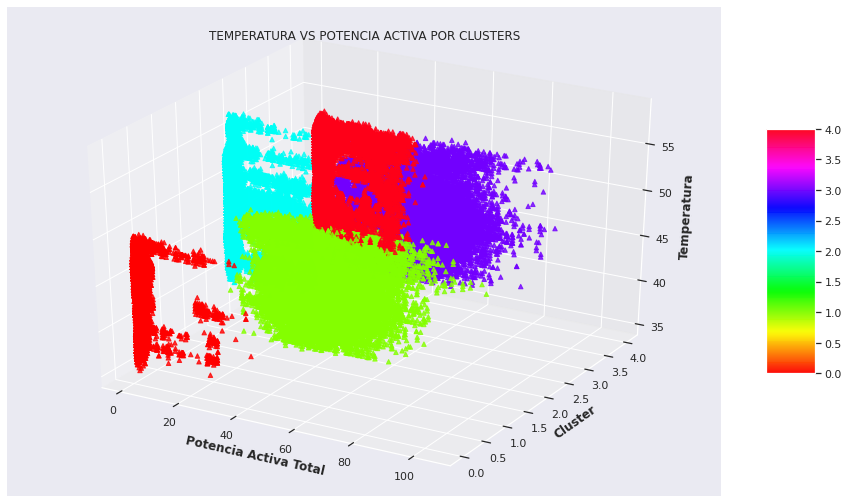

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_merged['Temperature']
x = df_merged['Active_Power_Total']
y = df_merged['kmeans_5']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("TEMPERATURA VS POTENCIA ACTIVA POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Temperatura', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

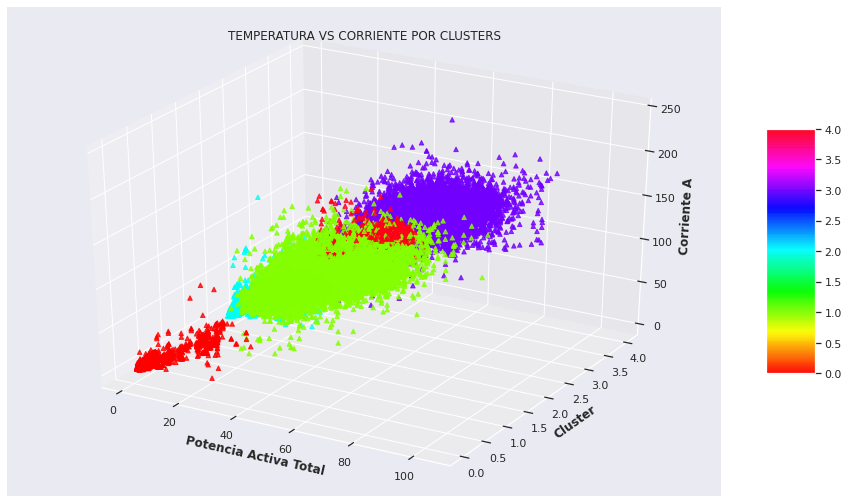

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_merged['Current_A']
x = df_merged['Active_Power_Total']
y = df_merged['kmeans_5']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("TEMPERATURA VS CORRIENTE POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Corriente A', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

###Visualización de Clusters por dias

####Tabla de contingencia

In [ ]:
dias_ordenados = ['Monday', 'Tuesday', 'Wednesday','Thursday','Friday','Saturday', 'Sunday']

df_merged.day_of_week = pandas.Categorical(df_merged.day_of_week, dias_ordenados)

In [ ]:
round(pandas.crosstab(df_merged.kmeans_5,df_merged.day_of_week,margins=True, normalize=True),2)

day_of_week,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,All
kmeans_5,,,,,,,,
0,0.02,0.01,0.00,0.00,0.00,0.00,0.03,0.07
1,0.03,0.02,0.02,0.02,0.02,0.00,0.00,0.11
2,0.06,0.04,0.04,0.04,0.05,0.07,0.07,0.37
3,0.01,0.02,0.02,0.02,0.02,0.00,0.00,0.10
4,0.04,0.03,0.04,0.04,0.05,0.07,0.07,0.34
All,0.16,0.13,0.13,0.13,0.13,0.14,0.17,1.00


Como se puede ver los clusters 1 y 4 tienen en cuenta los dias de la semana donde se tiene producción (Lunes a Viernes)

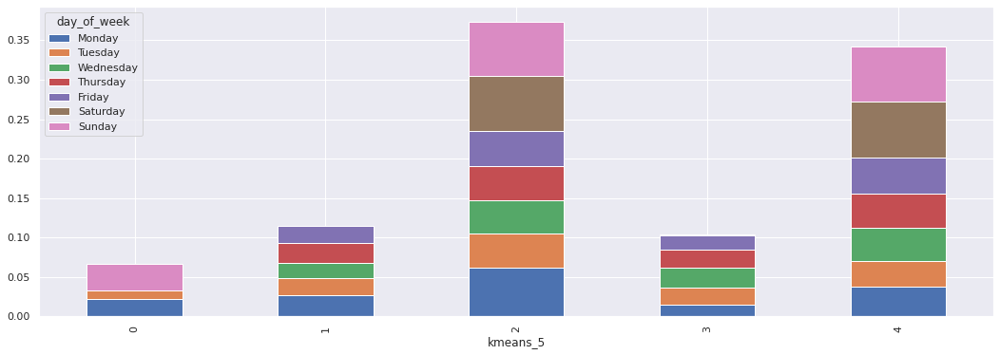

In [ ]:
pandas.crosstab(df_merged.kmeans_5,df_merged.day_of_week,margins=False, normalize=True).plot(kind='bar',stacked=True)

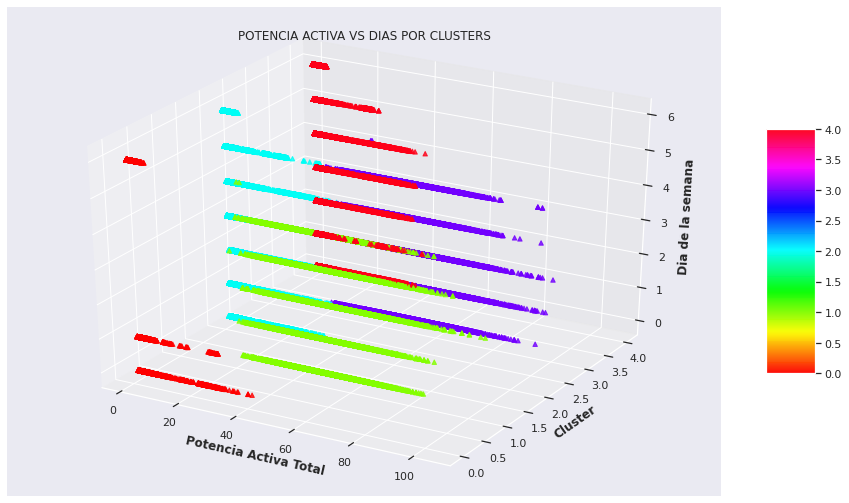

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_merged['day_number']
x = df_merged['Active_Power_Total']
y = df_merged['kmeans_5']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("POTENCIA ACTIVA VS DIAS POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Dia de la semana', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

###Visualización de Clusters por horas


####Tabla de contingencia

In [ ]:
#dias_ordenados = ['Monday', 'Tuesday', 'Wednesday','Thursday','Friday','Saturday', 'Sunday']

#df_merged.day_of_week = pandas.Categorical(df_merged.day_of_week, dias_ordenados)

In [ ]:
round(pandas.crosstab(df_merged.kmeans_5,df_merged.hour,margins=True, normalize=True),2)

hour,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,All
kmeans_5,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.11
2,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.37
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.10
4,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.34
All,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.03,0.03,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,1.00


Podemos ver en  esta tabla que los clusters 1 y 2 tienen en cuenta el rango horario de 7 a 16 hs que es el de mayor consumo.
Los clusters 0 y 4 se focalizan en los horarios de menor consumo.





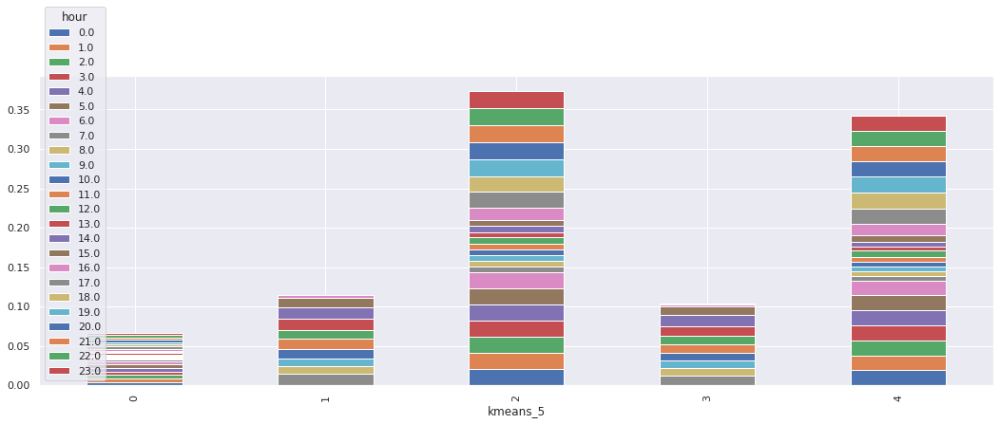

In [ ]:
pandas.crosstab(df_merged.kmeans_5,df_merged.hour,margins=False, normalize=True).plot(kind='bar',stacked=True)

###Clustering con DBSCAN

###Elección de la cantidad de grupos/clusters

A este metodo de agrupamiento es necesario definirle la distancia epsilon y la cantidad de elementos por cluster, para lo cual se utiliza el grafico distancia vs puntos.

In [ ]:
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans, DBSCAN
from scipy.spatial import distance
from sklearn.neighbors import NearestNeighbors

Text(0, 0.5, 'Distance')

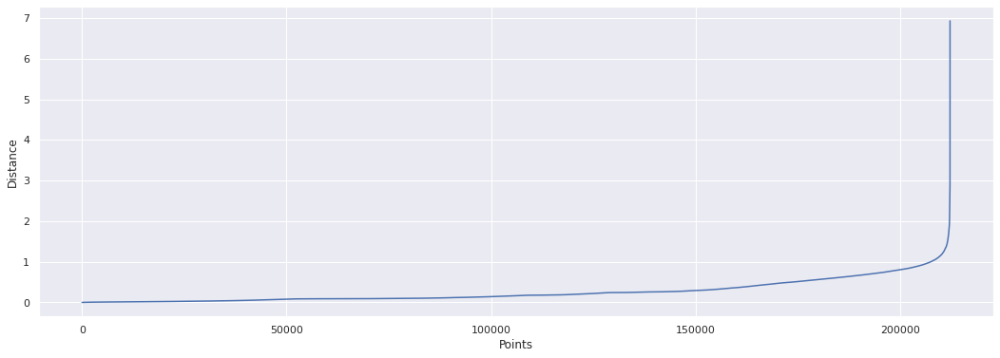

In [ ]:
#BUSCAR EPSILON
k = 2
data_nn = X.copy()

# Calculate NN
nearest_neighbors = NearestNeighbors(n_neighbors=k)
neighbors = nearest_neighbors.fit(data_nn)
distances, indices = neighbors.kneighbors(data_nn)
distances = np.sort(distances, axis=0)

# Get distances
distances = distances[:,1]

i = np.arange(len(distances))

sns.lineplot(
    x = i, 
    y = distances
)

plt.xlabel("Points")
plt.ylabel("Distance")

###Clusters con DBSCAN

In [ ]:
df_1['dbscan'] = DBSCAN(eps=2, min_samples=1800).fit_predict(X)

In [ ]:
df_1

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4,day_number,day_of_week,hour,dbscan
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-11-30 00:00:12.342,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.31,0.94,3.25,138069.09,906.87,4.0,2.36,0.37,0.97,3.48,10.18,0,1.56,4.19,13.0,6.40,2.0,1.0,2.0,0,0,50.04,0.85,0.82,1.03,0.93,83686.04,156.42,83529.62,83842.46,1.25,0.22,-0.22,1.24,43.09,380.0,231.71,391.0,231.29,383.0,231.40,380.0,231.47,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:12.342000+00:00,0,0,0,0,0.0,Monday,0.0,-1
2020-11-30 00:00:22.759,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.11,906.87,4.0,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13.0,6.40,2.0,1.0,2.0,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.46,1.25,0.20,-0.22,1.23,42.48,380.0,231.67,391.0,231.16,383.0,231.36,380.0,231.40,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:22.759000+00:00,0,0,0,0,0.0,Monday,0.0,-1
2020-11-30 00:00:39.117,106852.29,3.81,362.77,106489.52,107215.05,2.00,0.30,0.94,3.24,138069.12,906.87,4.0,2.36,0.36,0.97,3.47,10.18,0,1.60,4.19,13.0,6.41,2.0,1.0,2.0,0,0,50.05,0.85,0.82,1.03,0.94,83686.04,156.42,83529.63,83842.47,1.25,0.20,-0.22,1.23,42.78,380.0,231.77,391.0,231.28,383.0,231.48,380.0,231.51,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:39.117000+00:00,0,0,0,0,0.0,Monday,0.0,-1
2020-11-30 00:00:48.160,106852.32,3.81,362.77,106489.55,107215.09,2.00,0.30,0.94,3.25,138069.14,906.87,4.0,2.36,0.36,0.97,3.47,10.19,0,1.56,4.19,13.0,6.40,2.0,1.0,2.0,0,0,50.05,0.85,0.82,1.03,0.94,83686.05,156.42,83529.64,83842.47,1.25,0.21,-0.22,1.23,43.09,380.0,231.84,391.0,231.39,383.0,231.53,380.0,231.59,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:48.160000+00:00,0,0,0,0,0.0,Monday,0.0,-1
2020-11-30 00:00:58.693,106852.33,3.81,362.77,106489.55,107215.10,1.81,0.29,0.94,3.05,138069.14,906.87,4.0,2.06,0.36,0.97,3.19,8.86,0,1.56,4.19,13.0,5.22,2.0,1.0,2.0,0,0,50.04,0.88,0.82,1.03,0.95,83686.05,156.42,83529.64,83842.48,0.98,0.20,-0.22,0.95,43.09,380.0,232.03,391.0,231.38,383.0,231.35,380.0,231.59,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-30 00:00:58.693000+00:00,0,0,0,0,0.0,Monday,0.0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-01 23:58:06.425,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.67,906.69,4.0,1.95,0.38,0.92,2.98,8.29,0,1.60,3.91,13.0,4.90,2.0,1.0,2.0,0,0,49.98,0.94,0.84,1.13,0.99,73786.62,154.33,73632.28,73940.95,0.67,0.20,-0.45,0.42,42.48,380.0,235.46,391.0,234.58,383.0,234.72,380.0,234.92,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,2020-11-01 23:58:06.425000+00:00,0,0,0,0,6.0,Sunday,23.0,3
2020-11-01 23:58:18.775,95656.45,3.77,362.76,95293.70,96019.21,1.83,0.32,0.80,2.95,122900.68,906.69,4.0,1.95,0.38,0.92,2.98,8.28,0,1.60,3.91,13.0,4.90,2.0,1.0,2.0,0,

# Cantidad por clusters

###Cantidad por clusters

In [ ]:
# creacion de grupos usando groupby
group = df_1.groupby('dbscan')
  
# conteo de observaciones
group.count()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,createdAt,rsrv1,rsrv2,rsrv3,rsrv4,day_number,day_of_week,hour
dbscan,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775,76775
0,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007,125007
1,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244,3244
2,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618,3618
3,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592,3592


(array([     0.,  20000.,  40000.,  60000.,  80000., 100000., 120000.,
        140000.]), <a list of 8 Text major ticklabel objects>)

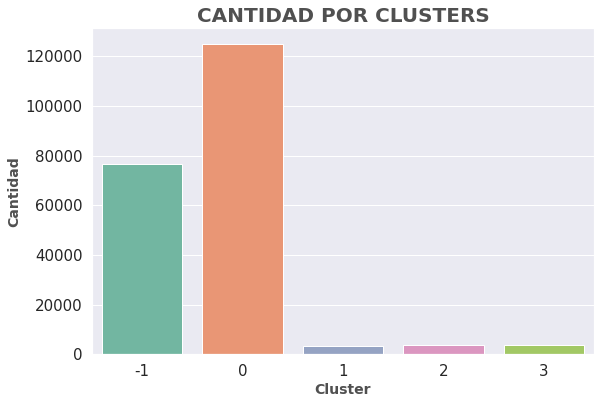

In [ ]:
 #Graficamente podemos verlo de la siguiente manera
import seaborn as sns
fig = plt.figure(figsize=(9,6))
sns.countplot(data=df_1, x='dbscan', palette="Set2")

plt.title('CANTIDAD POR CLUSTERS', 
            loc='center', color='#505050', fontsize=20, fontweight='bold')

plt.ylabel("Cantidad", size=14, fontweight='bold', color='#505050')
plt.xlabel("Cluster", size=14, fontweight='bold', color='#505050')

plt.xticks(fontsize=15, rotation=0)
plt.yticks(fontsize=15)

###Visualizacion por clusters

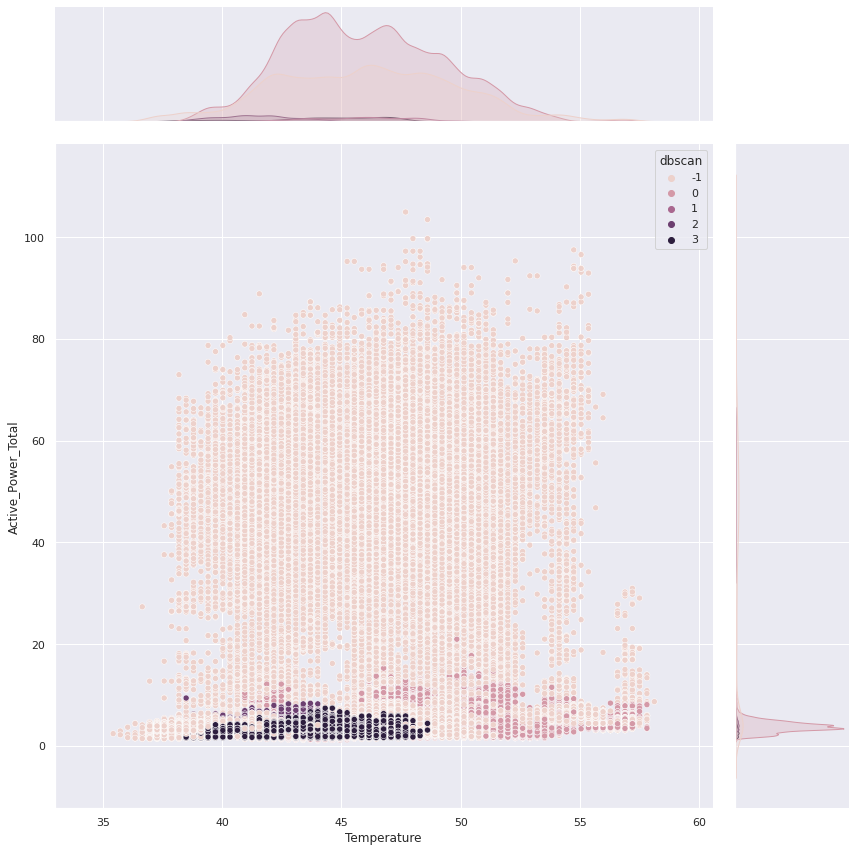

In [ ]:
plot = seaborn.jointplot(data = df_1 , x = 'Temperature', y = 'Active_Power_Total', hue='dbscan', height=12)
#plot.ax_marg_x.set_xlim(39, 52)
#plot.ax_marg_y.set_ylim(0, 36)
plt.show()

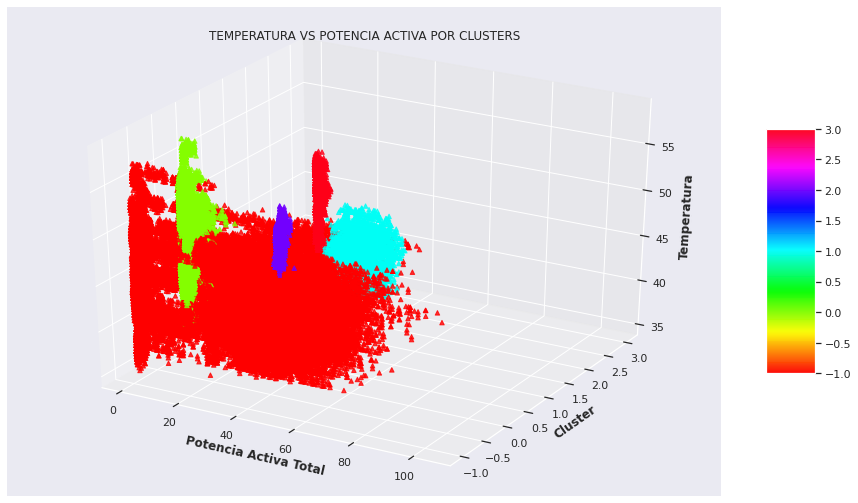

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_1['Temperature']
x = df_1['Active_Power_Total']
y = df_1['dbscan']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("TEMPERATURA VS POTENCIA ACTIVA POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Temperatura', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

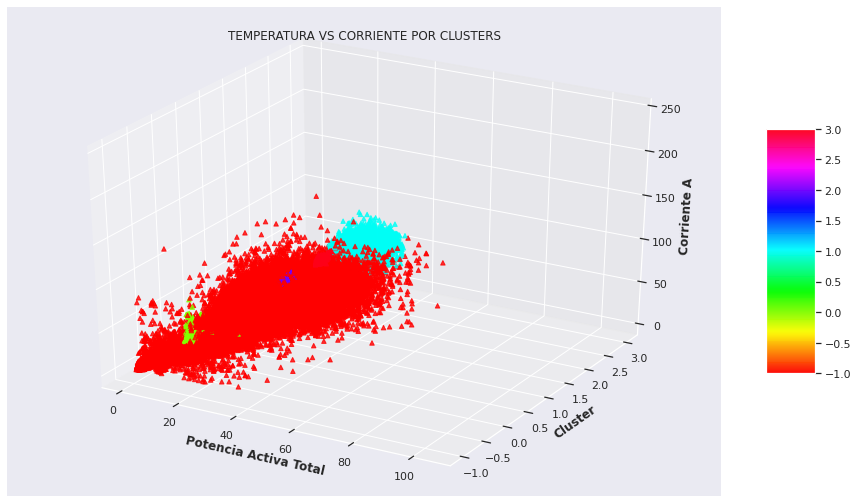

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_1['Current_A']
x = df_1['Active_Power_Total']
y = df_1['dbscan']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("TEMPERATURA VS CORRIENTE POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Corriente A', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

###Visualización de Clusters por dias

####Tabla de contingencia

In [ ]:
dias_ordenados = ['Monday', 'Tuesday', 'Wednesday','Thursday','Friday','Saturday', 'Sunday']

df_1.day_of_week = pandas.Categorical(df_1.day_of_week, dias_ordenados)

In [ ]:
round(pandas.crosstab(df_1.dbscan,df_1.day_of_week,margins=True, normalize=True),2)

day_of_week,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,All
dbscan,,,,,,,,
-1,0.09,0.07,0.06,0.05,0.05,0.02,0.03,0.36
0,0.07,0.05,0.06,0.07,0.08,0.12,0.13,0.59
1,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.02
2,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.02
3,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.02
All,0.16,0.13,0.13,0.13,0.13,0.14,0.17,1.00


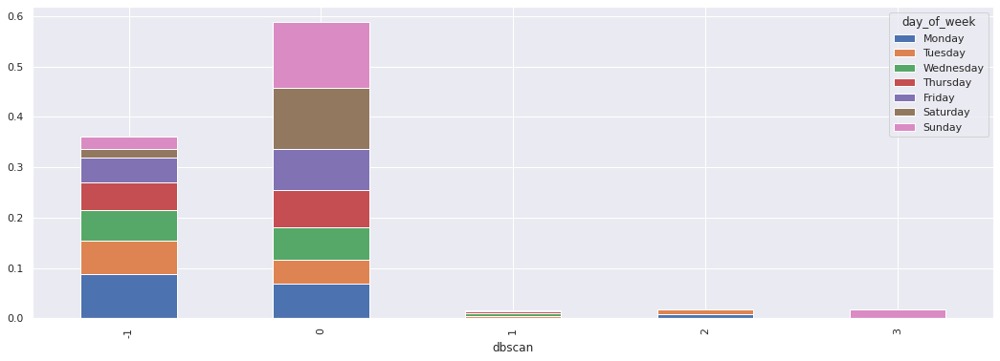

In [ ]:
pandas.crosstab(df_1.dbscan,df_1.day_of_week,margins=False, normalize=True).plot(kind='bar',stacked=True)

#Aprendizaje No Supervisado - Clusterización (Agosto 2021)

In [ ]:
#Files
!wget https://github.com/agustinabdala/diplodatos/blob/main/raw_input_files/agosto.zip?raw=true -O /content/file_mensual.zip
!wget https://raw.githubusercontent.com/agustinabdala/diplodatos/main/00_Mentoria/merged_temperatures_smn.txt -O /content/temperatures_smn.txt

--2022-08-26 17:54:11--  https://github.com/agustinabdala/diplodatos/blob/main/raw_input_files/agosto.zip?raw=true
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/agustinabdala/diplodatos/raw/main/raw_input_files/agosto.zip [following]
--2022-08-26 17:54:12--  https://github.com/agustinabdala/diplodatos/raw/main/raw_input_files/agosto.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/agustinabdala/diplodatos/main/raw_input_files/agosto.zip [following]
--2022-08-26 17:54:12--  https://raw.githubusercontent.com/agustinabdala/diplodatos/main/raw_input_files/agosto.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubuserconte

In [ ]:
!unzip -o /content/file_mensual.zip

Archive:  /content/file_mensual.zip
  inflating: agosto.csv              


###Ingesta de Dataframes

In [ ]:
file_input = "agosto.csv"
df_1 = pandas.read_csv(file_input)

Preparación del dataframe de consumo de energia

In [ ]:
df_1.index = pandas.to_datetime(
    df_1['createdAt'],
    errors="coerce",
    format='%Y%m%d %H:%M:%S.%f',
    ).dt.tz_convert(None)
    #2020-11-30 23:59:12.616

In [ ]:
df_1

,createdAt,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,_id,createdAt.1,rsrv1,rsrv2,rsrv3,rsrv4
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-01 00:00:08.787,2021-08-01 00:00:08.787000+00:00,201707.11,3.93,410.14,201296.95,202117.25,2.62,0.37,0.96,3.95,264488.62,1060.57,4,2.77,0.48,1.01,4.05,11.95,0,2.06,4.37,13,7.73,2,1,2,0,0,50.05,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.31,0.91,31.44,380,232.14,391,232.42,383,231.85,380,232.14,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc314,2021-08-01 00:00:08.787000+00:00,0,0,0,0
2021-08-01 00:00:23.093,2021-08-01 00:00:23.093000+00:00,201707.14,3.93,410.14,201296.98,202117.28,2.62,0.37,0.96,3.95,264488.62,1060.57,4,2.77,0.48,1.01,4.05,11.95,0,2.06,4.37,13,7.74,2,1,2,0,0,50.06,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.32,0.91,31.13,380,232.14,391,232.42,383,231.85,380,232.14,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc315,2021-08-01 00:00:23.093000+00:00,0,0,0,0
2021-08-01 00:00:33.228,2021-08-01 00:00:33.228000+00:00,201707.14,3.93,410.14,201296.98,202117.28,1.93,0.37,0.96,3.26,264488.66,1060.57,4,2.15,0.48,1.01,3.39,9.23,0,2.06,4.37,13,5.21,2,1,2,0,0,50.06,0.90,0.77,1.05,0.96,163823.08,358.99,163464.09,164182.06,0.95,0.31,-0.31,0.94,32.36,380,232.79,391,232.25,383,231.92,380,232.32,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc316,2021-08-01 00:00:33.228000+00:00,0,0,0,0
2021-08-01 00:00:48.473,2021-08-01 00:00:48.473000+00:00,201707.16,3.93,410.14,201297.02,202117.30,1.93,0.37,0.96,3.26,264488.69,1060.57,4,2.15,0.48,1.01,3.39,9.23,0,2.06,4.37,13,5.21,2,1,2,0,0,50.05,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380,232.70,391,232.14,383,231.82,380,232.22,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc317,2021-08-01 00:00:48.473000+00:00,0,0,0,0
2021-08-01 00:01:01.498,2021-08-01 00:01:01.498000+00:00,201707.17,3.93,410.14,201297.03,202117.31,1.93,0.37,0.96,3.26,264488.69,1060.57,4,2.15,0.48,1.01,3.39,9.24,0,2.06,4.37,13,5.20,2,1,2,0,0,50.01,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380,232.62,391,232.14,383,231.76,380,232.17,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc318,2021-08-01 00:01:01.498000+00:00,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-31 23:59:06.783,2021-08-31 23:59:06.783000+00:00,215365.02,4.29,410.14,214954.86,215775.16,3.58,0.39,0.95,4.92,282027.75,1060.57,4,3.87,0.51,0.99,5.14,16.65,0,2.20,4.25,13,11.74,2,1,2,0,0,49.98,0.93,0.76,1.05,0.96,174304.53,375.02,173929.50,174679.53,1.46,0.34,-0.31,1.49,45.24,380,232.37,391,233.83,383,234.24,380,233.48,30,12,23,15,26,15,12,5,628c4911215ee2e22071eba4,2021-08-31 23:59:06.783000+00:00,0,0,0,0
2021-08-31 23:59:19.169,2021-08-31 23:59:19.169000+00:00,215365.02,4.29,410.14,214954.86,215775.16,3.58,0.39,0.95,4.92,282027.75,10

In [ ]:
df_1.columns

Index(['createdAt', 'Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_Avg', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C', 'Current_UNB_Worst', 'Energy_Acum_Datetime',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A

In [ ]:
#df = pandas.DataFrame({'my_dates':['2015-01-01','2022-01-02','2015-01-03'],'myvals':[1,2,3]})
df_1['createdAt'] = pandas.to_datetime(df_1['createdAt'])
df_1['day_number'] = df_1['createdAt'].dt.weekday
df_1['day_of_week'] = df_1['createdAt'].dt.day_name()
df_1['hour'] = df_1['createdAt'].dt.hour
df_1


,createdAt,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,_id,createdAt.1,rsrv1,rsrv2,rsrv3,rsrv4,day_number,day_of_week,hour
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-01 00:00:08.787,2021-08-01 00:00:08.787000+00:00,201707.11,3.93,410.14,201296.95,202117.25,2.62,0.37,0.96,3.95,264488.62,1060.57,4,2.77,0.48,1.01,4.05,11.95,0,2.06,4.37,13,7.73,2,1,2,0,0,50.05,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.31,0.91,31.44,380,232.14,391,232.42,383,231.85,380,232.14,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc314,2021-08-01 00:00:08.787000+00:00,0,0,0,0,6,Sunday,0
2021-08-01 00:00:23.093,2021-08-01 00:00:23.093000+00:00,201707.14,3.93,410.14,201296.98,202117.28,2.62,0.37,0.96,3.95,264488.62,1060.57,4,2.77,0.48,1.01,4.05,11.95,0,2.06,4.37,13,7.74,2,1,2,0,0,50.06,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.32,0.91,31.13,380,232.14,391,232.42,383,231.85,380,232.14,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc315,2021-08-01 00:00:23.093000+00:00,0,0,0,0,6,Sunday,0
2021-08-01 00:00:33.228,2021-08-01 00:00:33.228000+00:00,201707.14,3.93,410.14,201296.98,202117.28,1.93,0.37,0.96,3.26,264488.66,1060.57,4,2.15,0.48,1.01,3.39,9.23,0,2.06,4.37,13,5.21,2,1,2,0,0,50.06,0.90,0.77,1.05,0.96,163823.08,358.99,163464.09,164182.06,0.95,0.31,-0.31,0.94,32.36,380,232.79,391,232.25,383,231.92,380,232.32,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc316,2021-08-01 00:00:33.228000+00:00,0,0,0,0,6,Sunday,0
2021-08-01 00:00:48.473,2021-08-01 00:00:48.473000+00:00,201707.16,3.93,410.14,201297.02,202117.30,1.93,0.37,0.96,3.26,264488.69,1060.57,4,2.15,0.48,1.01,3.39,9.23,0,2.06,4.37,13,5.21,2,1,2,0,0,50.05,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380,232.70,391,232.14,383,231.82,380,232.22,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc317,2021-08-01 00:00:48.473000+00:00,0,0,0,0,6,Sunday,0
2021-08-01 00:01:01.498,2021-08-01 00:01:01.498000+00:00,201707.17,3.93,410.14,201297.03,202117.31,1.93,0.37,0.96,3.26,264488.69,1060.57,4,2.15,0.48,1.01,3.39,9.24,0,2.06,4.37,13,5.20,2,1,2,0,0,50.01,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380,232.62,391,232.14,383,231.76,380,232.17,30,12,23,15,26,15,12,5,628c4942215ee2e2207bc318,2021-08-01 00:01:01.498000+00:00,0,0,0,0,6,Sunday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-31 23:59:06.783,2021-08-31 23:59:06.783000+00:00,215365.02,4.29,410.14,214954.86,215775.16,3.58,0.39,0.95,4.92,282027.75,1060.57,4,3.87,0.51,0.99,5.14,16.65,0,2.20,4.25,13,11.74,2,1,2,0,0,49.98,0.93,0.76,1.05,0.96,174304.53,375.02,173929.50,174679.53,1.46,0.34,-0.31,1.49,45.24,380,232.37,391,233.83,383,234.24,380,233.48,30,12,23,15,26,15,12,5,628c4911215ee2e22071eba4,2021-08-31 23:59:06.783000+00:00,0,0,0,0,1,Tuesday,23
2021-08-31 23:59:19.

In [ ]:
# create a group using groupby
group = df_1.groupby('day_of_week')
  
# count the observations
group.count()

,createdAt,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,_id,createdAt.1,rsrv1,rsrv2,rsrv3,rsrv4,day_number,hour
day_of_week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Friday,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044,29044
Monday,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657,36657
Saturday,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391,29391
Sunday,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870,36870
Thursday,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345,29345
Tuesday,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497,36497
Wednesday,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455,29455


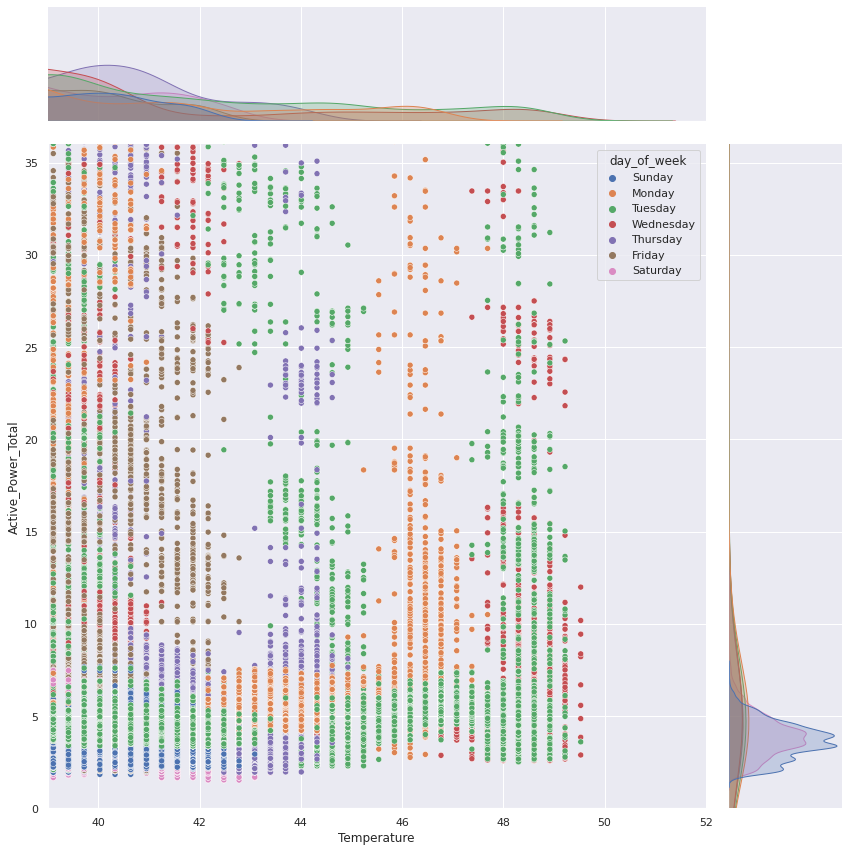

In [ ]:
plot = seaborn.jointplot(data = df_1 , x = 'Temperature', y = 'Active_Power_Total', hue='day_of_week', height=12)
plot.ax_marg_x.set_xlim(39, 52)
plot.ax_marg_y.set_ylim(0, 36)
plt.show()

In [ ]:
import pandas
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, classification_report
from sklearn.tree import DecisionTreeClassifier

In [ ]:
#Columnas con valores 0
cols = df_1[df_1 == 0].count(axis=0)
cols[cols > 0]

Active_Energy_LastDay         1
Current_A                     4
Current_Avg              227259
Current_B                     4
Current_UNB_Worst        227259
Energy_Acum_Datetime     227259
Reactive_Power_Total         38
rsrv1                    227259
rsrv2                    227259
rsrv3                    227259
rsrv4                    227259
day_number                36657
hour                       9587
dtype: int64

In [ ]:

imputer_cols = ['Active_Energy_Delivered', 'Active_Energy_LastDay',
       'Active_Energy_Received', 'Active_Energy_del_m_rec',
       'Active_Energy_del_p_rec', 'Active_Power_A', 'Active_Power_B',
       'Active_Power_C', 'Active_Power_Total', 'Apparent_Energy_Delivered',
       'Apparent_Energy_Received', 'Apparent_Energy_del_p_rec',
       'Apparent_Power_A', 'Apparent_Power_B', 'Apparent_Power_C',
       'Apparent_Power_Total', 'Current_A', 'Current_B',
       'Current_C', 'Current_G', 'Current_N', 'Current_UNB_A', 'Current_UNB_B',
       'Current_UNB_C',
       'Frequency', 'Power_Factor_A', 'Power_Factor_B', 'Power_Factor_C',
       'Power_Factor_Total', 'Reactive_Energy_Delivered',
       'Reactive_Energy_Received', 'Reactive_Energy_del_m_rec',
       'Reactive_Energy_del_p_rec', 'Reactive_Power_A', 'Reactive_Power_B',
       'Reactive_Power_C', 'Reactive_Power_Total', 'Temperature',
       'Voltage_A_B', 'Voltage_A_N', 'Voltage_B_C', 'Voltage_B_N',
       'Voltage_C_A', 'Voltage_C_N', 'Voltage_L_L_Avg', 'Voltage_L_N_Avg',
       'Voltage_UNB_A_B', 'Voltage_UNB_A_N', 'Voltage_UNB_B_C',
       'Voltage_UNB_B_N', 'Voltage_UNB_C_A', 'Voltage_UNB_C_N',
       'Voltage_UNB_L_L_Worst', 'Voltage_UNB_L_N_Worst','day_number','hour']


imputer = SimpleImputer(strategy="median")
#imputer = KNNImputer(n_neighbors=2)
df_1[imputer_cols] = imputer.fit_transform(df_1[imputer_cols])
X = df_1.drop(['Current_Avg','Current_UNB_Worst','Energy_Acum_Datetime','rsrv1','rsrv2', 'rsrv3', 'rsrv4','createdAt','day_of_week', '_id','createdAt.1'],axis=1) 
#X = df_1.drop(['day_of_week'],axis=1) 
X

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour
createdAt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-01 00:00:08.787,201707.11,3.93,410.14,201296.95,202117.25,2.62,0.37,0.96,3.95,264488.62,1060.57,4.0,2.77,0.48,1.01,4.05,11.95,2.06,4.37,13.0,7.73,2.0,1.0,2.0,50.05,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.31,0.91,31.44,380.0,232.14,391.0,232.42,383.0,231.85,380.0,232.14,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,6.0,0.0
2021-08-01 00:00:23.093,201707.14,3.93,410.14,201296.98,202117.28,2.62,0.37,0.96,3.95,264488.62,1060.57,4.0,2.77,0.48,1.01,4.05,11.95,2.06,4.37,13.0,7.74,2.0,1.0,2.0,50.06,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.32,0.91,31.13,380.0,232.14,391.0,232.42,383.0,231.85,380.0,232.14,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,6.0,0.0
2021-08-01 00:00:33.228,201707.14,3.93,410.14,201296.98,202117.28,1.93,0.37,0.96,3.26,264488.66,1060.57,4.0,2.15,0.48,1.01,3.39,9.23,2.06,4.37,13.0,5.21,2.0,1.0,2.0,50.06,0.90,0.77,1.05,0.96,163823.08,358.99,163464.09,164182.06,0.95,0.31,-0.31,0.94,32.36,380.0,232.79,391.0,232.25,383.0,231.92,380.0,232.32,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,6.0,0.0
2021-08-01 00:00:48.473,201707.16,3.93,410.14,201297.02,202117.30,1.93,0.37,0.96,3.26,264488.69,1060.57,4.0,2.15,0.48,1.01,3.39,9.23,2.06,4.37,13.0,5.21,2.0,1.0,2.0,50.05,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380.0,232.70,391.0,232.14,383.0,231.82,380.0,232.22,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,6.0,0.0
2021-08-01 00:01:01.498,201707.17,3.93,410.14,201297.03,202117.31,1.93,0.37,0.96,3.26,264488.69,1060.57,4.0,2.15,0.48,1.01,3.39,9.24,2.06,4.37,13.0,5.20,2.0,1.0,2.0,50.01,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380.0,232.62,391.0,232.14,383.0,231.76,380.0,232.17,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,6.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-31 23:59:06.783,215365.02,4.29,410.14,214954.86,215775.16,3.58,0.39,0.95,4.92,282027.75,1060.57,4.0,3.87,0.51,0.99,5.14,16.65,2.20,4.25,13.0,11.74,2.0,1.0,2.0,49.98,0.93,0.76,1.05,0.96,174304.53,375.02,173929.50,174679.53,1.46,0.34,-0.31,1.49,45.24,380.0,232.37,391.0,233.83,383.0,234.24,380.0,233.48,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,1.0,23.0
2021-08-31 23:59:19.169,215365.02,4.29,410.14,214954.86,215775.16,3.58,0.39,0.95,4.92,282027.75,1060.57,4.0,3.87,0.51,0.99,5.14,16.66,2.20,4.24,13.0,11.75,2.0,1.0,2.0,49.98,0.93,0.76,1.05,0.96,174304.53,375.02,173929.52,174679.55,1.46,0.34,-0.31,1.49,44.62,380.0,232.40,391.0,233.86,383.0,234.29,380.0,233.52,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,1.0,23.0
2021-08-31 23:59:29.643,215365.05,4.29,410.14,214954.89,215775.19,3.58,0.39,0.95,4.92,282027.78,1060.57,4.0,3.87,0.51,0.99,5.14,16.66,2.19,4.24,13.0,11.75,2.0,1.0,2.0,49.97,0.93,0.76,1.05,0.96,174304.53,375.02,173929.52,174679.55,1.46,0.34,-0.31,1.49,44.93,380.0,232.32,391.0,

In [ ]:
x_names = X.columns
X = StandardScaler().fit_transform(X[imputer_cols])
X = pandas.DataFrame(X, columns=x_names)
X

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour
0,-1.774878,-0.606295,-5.684342e-14,-1.774882,-1.774878,-0.606508,-0.590675,-0.575549,-0.593953,-1.757548,0.0,0.0,-0.610328,-0.588630,-0.574754,-0.591089,-0.607324,-0.586346,-0.572277,0.0,-0.733272,0.0,0.0,0.0,0.882014,0.879982,-0.223816,0.439778,0.750415,-1.733262,-1.419721,-1.733547,-1.732992,-0.606182,-0.553154,-0.560831,-0.574768,-1.123147,0.0,0.564063,0.0,0.470954,0.0,0.140270,0.0,0.424687,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312
1,-1.774870,-0.606295,-5.684342e-14,-1.774874,-1.774871,-0.606508,-0.590675,-0.575549,-0.593953,-1.757548,0.0,0.0,-0.610328,-0.588630,-0.574754,-0.591089,-0.607324,-0.586346,-0.572277,0.0,-0.732345,0.0,0.0,0.0,1.149895,0.879982,-0.223816,0.439778,0.750415,-1.733262,-1.419721,-1.733547,-1.732992,-0.606182,-0.553154,-0.562180,-0.574768,-1.199444,0.0,0.564063,0.0,0.470954,0.0,0.140270,0.0,0.424687,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312
2,-1.774870,-0.606295,-5.684342e-14,-1.774874,-1.774871,-0.691818,-0.590675,-0.575549,-0.623055,-1.757540,0.0,0.0,-0.666793,-0.588630,-0.574754,-0.611529,-0.662320,-0.586346,-0.572277,0.0,-0.966997,0.0,0.0,0.0,1.149895,0.427847,-0.223816,0.439778,0.651956,-1.733262,-1.419721,-1.733543,-1.732992,-0.602233,-0.553154,-0.560831,-0.573427,-0.896718,0.0,0.717815,0.0,0.434555,0.0,0.160509,0.0,0.469837,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312
3,-1.774865,-0.606295,-5.684342e-14,-1.774864,-1.774866,-0.691818,-0.590675,-0.575549,-0.623055,-1.757534,0.0,0.0,-0.666793,-0.588630,-0.574754,-0.611529,-0.662320,-0.586346,-0.572277,0.0,-0.966997,0.0,0.0,0.0,0.882014,0.427847,-0.223816,0.439778,0.651956,-1.733258,-1.419721,-1.733543,-1.732986,-0.602233,-0.553154,-0.560831,-0.573427,-1.046851,0.0,0.696526,0.0,0.411003,0.0,0.131596,0.0,0.444754,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312
4,-1.774862,-0.606295,-5.684342e-14,-1.774862,-1.774863,-0.691818,-0.590675,-0.575549,-0.623055,-1.757534,0.0,0.0,-0.666793,-0.588630,-0.574754,-0.611529,-0.662118,-0.586346,-0.572277,0.0,-0.967924,0.0,0.0,0.0,-0.189512,0.427847,-0.223816,0.439778,0.651956,-1.733258,-1.419721,-1.733543,-1.732986,-0.602233,-0.553154,-0.560831,-0.573427,-1.046851,0.0,0.677603,0.0,0.411003,0.0,0.114249,0.0,0.432212,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227254,1.736851,-0.590822,-5.684342e-14,1.736847,1.736850,-0.487817,-0.588349,-0.576954,-0.553040,1.764335,0.0,0.0,-0.510148,-0.585968,-0.576751,-0.557332,-0.512293,-0.583586,-0.574986,0.0,-0.361354,0.0,0.0,0.0,-0.993157,0.766948,-0.316162,0.439778,0.651956,1.802716,2.018335,1.802143,1.803268,-0.535094,-0.549095,-0.560831,-0.548853,2.273290,0.0,0.618468,0.0,0.772850,0.0,0.831283,0.0,0.760799,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.932088,1.651489
227255,1.736851,-0.590822,-5.684342e-14,1.736847,1.736850,-0.487817,-0.588349,-0.576954,-0.553040,1.764335,0.0,0.0,-0.510148,-0.585968,-

##Clustering-con-Kmeans

Es necesario definirle la cantidad de grupos/clusters (n_clusters), es un hiperparámetro del algoritmo. 


###Elección de la cantidad de grupos/clusters

Una forma de seleccionar la cantidad más adecuada de clusters es probar varias cantidades y usar el criterio del codo: "elbow method", utilizando una medida de ajuste que puede ser Inertia.

In [ ]:
from sklearn.cluster import KMeans,MeanShift

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

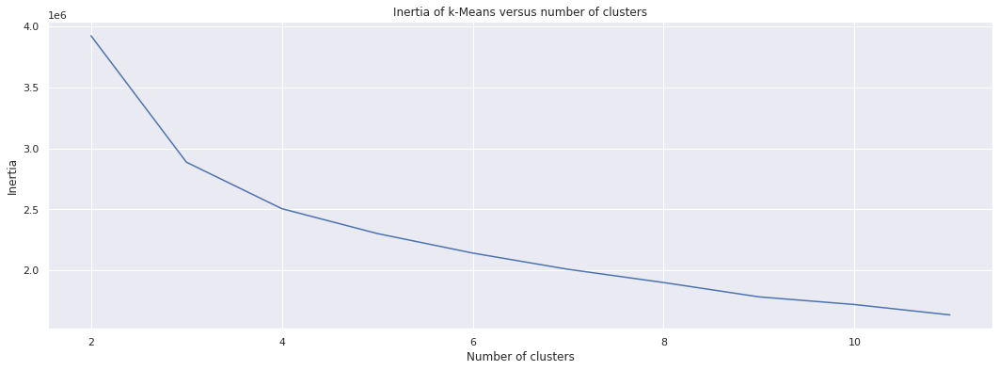

In [ ]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i).fit(X).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

De la grafica anterior se puede ver que el valor de K a utilizar es K=5

###Clusters con K-means

In [ ]:
# Número de clusters buscado
n_clust = 5

km = KMeans(n_clusters=n_clust)
km.fit(X) #utiliza todas las habilidades: 34 dimensiones

# Etiquetas asignadas por el algoritmo
clusters = km.labels_
#print('Suma de los cuadrados de las distancias al centro de cada cluster=Inertia= ', km.inertia_)

In [ ]:
df_clusters=X.copy()
df_clusters['kmeans_5'] = km.labels_ #clusters
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters, nosotros forzamos la cantidad')
df_clusters.head(4)

Kmeans encontró:  5 clusters, nosotros forzamos la cantidad


,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour,kmeans_5
0,-1.774878,-0.606295,-5.684342e-14,-1.774882,-1.774878,-0.606508,-0.590675,-0.575549,-0.593953,-1.757548,0.0,0.0,-0.610328,-0.58863,-0.574754,-0.591089,-0.607324,-0.586346,-0.572277,0.0,-0.733272,0.0,0.0,0.0,0.882014,0.879982,-0.223816,0.439778,0.750415,-1.733262,-1.419721,-1.733547,-1.732992,-0.606182,-0.553154,-0.560831,-0.574768,-1.123147,0.0,0.564063,0.0,0.470954,0.0,0.140270,0.0,0.424687,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312,4
1,-1.774870,-0.606295,-5.684342e-14,-1.774874,-1.774871,-0.606508,-0.590675,-0.575549,-0.593953,-1.757548,0.0,0.0,-0.610328,-0.58863,-0.574754,-0.591089,-0.607324,-0.586346,-0.572277,0.0,-0.732345,0.0,0.0,0.0,1.149895,0.879982,-0.223816,0.439778,0.750415,-1.733262,-1.419721,-1.733547,-1.732992,-0.606182,-0.553154,-0.562180,-0.574768,-1.199444,0.0,0.564063,0.0,0.470954,0.0,0.140270,0.0,0.424687,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312,4
2,-1.774870,-0.606295,-5.684342e-14,-1.774874,-1.774871,-0.691818,-0.590675,-0.575549,-0.623055,-1.757540,0.0,0.0,-0.666793,-0.58863,-0.574754,-0.611529,-0.662320,-0.586346,-0.572277,0.0,-0.966997,0.0,0.0,0.0,1.149895,0.427847,-0.223816,0.439778,0.651956,-1.733262,-1.419721,-1.733543,-1.732992,-0.602233,-0.553154,-0.560831,-0.573427,-0.896718,0.0,0.717815,0.0,0.434555,0.0,0.160509,0.0,0.469837,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312,4
3,-1.774865,-0.606295,-5.684342e-14,-1.774864,-1.774866,-0.691818,-0.590675,-0.575549,-0.623055,-1.757534,0.0,0.0,-0.666793,-0.58863,-0.574754,-0.611529,-0.662320,-0.586346,-0.572277,0.0,-0.966997,0.0,0.0,0.0,0.882014,0.427847,-0.223816,0.439778,0.651956,-1.733258,-1.419721,-1.733543,-1.732986,-0.602233,-0.553154,-0.560831,-0.573427,-1.046851,0.0,0.696526,0.0,0.411003,0.0,0.131596,0.0,0.444754,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.472101,-1.655312,4


###Cantidad por clusters

In [ ]:
# creacion de grupos usando groupby
group = df_clusters.groupby('kmeans_5')
  
# conteo de observaciones
group.count()

,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,day_number,hour
kmeans_5,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479,71479
1,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623,27623
2,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312,63312
3,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673,26673
4,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172,38172


(array([    0., 10000., 20000., 30000., 40000., 50000., 60000., 70000.,
        80000.]), <a list of 9 Text major ticklabel objects>)

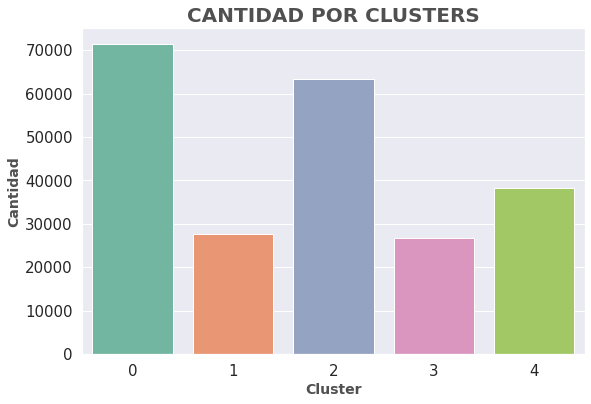

In [ ]:
 #Graficamente podemos verlo de la siguiente manera
import seaborn as sns
fig = plt.figure(figsize=(9,6))
sns.countplot(data=df_clusters, x='kmeans_5', palette="Set2")

plt.title('CANTIDAD POR CLUSTERS', 
            loc='center', color='#505050', fontsize=20, fontweight='bold')

plt.ylabel("Cantidad", size=14, fontweight='bold', color='#505050')
plt.xlabel("Cluster", size=14, fontweight='bold', color='#505050')

plt.xticks(fontsize=15, rotation=0)
plt.yticks(fontsize=15)

###Visualizacion por clusters

In [ ]:
type(df_clusters['kmeans_5'])


pandas.core.series.Series

Uniendo Clusterizacion con dataset original

In [ ]:

df_merged = df_1.merge(df_clusters.kmeans_5, right_on=df_1.index, left_index=True)
df_merged

,key_0,createdAt,Active_Energy_Delivered,Active_Energy_LastDay,Active_Energy_Received,Active_Energy_del_m_rec,Active_Energy_del_p_rec,Active_Power_A,Active_Power_B,Active_Power_C,Active_Power_Total,Apparent_Energy_Delivered,Apparent_Energy_Received,Apparent_Energy_del_p_rec,Apparent_Power_A,Apparent_Power_B,Apparent_Power_C,Apparent_Power_Total,Current_A,Current_Avg,Current_B,Current_C,Current_G,Current_N,Current_UNB_A,Current_UNB_B,Current_UNB_C,Current_UNB_Worst,Energy_Acum_Datetime,Frequency,Power_Factor_A,Power_Factor_B,Power_Factor_C,Power_Factor_Total,Reactive_Energy_Delivered,Reactive_Energy_Received,Reactive_Energy_del_m_rec,Reactive_Energy_del_p_rec,Reactive_Power_A,Reactive_Power_B,Reactive_Power_C,Reactive_Power_Total,Temperature,Voltage_A_B,Voltage_A_N,Voltage_B_C,Voltage_B_N,Voltage_C_A,Voltage_C_N,Voltage_L_L_Avg,Voltage_L_N_Avg,Voltage_UNB_A_B,Voltage_UNB_A_N,Voltage_UNB_B_C,Voltage_UNB_B_N,Voltage_UNB_C_A,Voltage_UNB_C_N,Voltage_UNB_L_L_Worst,Voltage_UNB_L_N_Worst,_id,createdAt.1,rsrv1,rsrv2,rsrv3,rsrv4,day_number,day_of_week,hour,kmeans_5
0,2021-08-01 00:00:08.787,2021-08-01 00:00:08.787000+00:00,201707.11,3.93,410.14,201296.95,202117.25,2.62,0.37,0.96,3.95,264488.62,1060.57,4.0,2.77,0.48,1.01,4.05,11.95,0,2.06,4.37,13.0,7.73,2.0,1.0,2.0,0,0,50.05,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.31,0.91,31.44,380.0,232.14,391.0,232.42,383.0,231.85,380.0,232.14,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4942215ee2e2207bc314,2021-08-01 00:00:08.787000+00:00,0,0,0,0,6.0,Sunday,0.0,4
1,2021-08-01 00:00:23.093,2021-08-01 00:00:23.093000+00:00,201707.14,3.93,410.14,201296.98,202117.28,2.62,0.37,0.96,3.95,264488.62,1060.57,4.0,2.77,0.48,1.01,4.05,11.95,0,2.06,4.37,13.0,7.74,2.0,1.0,2.0,0,0,50.06,0.94,0.77,1.05,0.97,163823.08,358.99,163464.08,164182.06,0.92,0.31,-0.32,0.91,31.13,380.0,232.14,391.0,232.42,383.0,231.85,380.0,232.14,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4942215ee2e2207bc315,2021-08-01 00:00:23.093000+00:00,0,0,0,0,6.0,Sunday,0.0,4
2,2021-08-01 00:00:33.228,2021-08-01 00:00:33.228000+00:00,201707.14,3.93,410.14,201296.98,202117.28,1.93,0.37,0.96,3.26,264488.66,1060.57,4.0,2.15,0.48,1.01,3.39,9.23,0,2.06,4.37,13.0,5.21,2.0,1.0,2.0,0,0,50.06,0.90,0.77,1.05,0.96,163823.08,358.99,163464.09,164182.06,0.95,0.31,-0.31,0.94,32.36,380.0,232.79,391.0,232.25,383.0,231.92,380.0,232.32,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4942215ee2e2207bc316,2021-08-01 00:00:33.228000+00:00,0,0,0,0,6.0,Sunday,0.0,4
3,2021-08-01 00:00:48.473,2021-08-01 00:00:48.473000+00:00,201707.16,3.93,410.14,201297.02,202117.30,1.93,0.37,0.96,3.26,264488.69,1060.57,4.0,2.15,0.48,1.01,3.39,9.23,0,2.06,4.37,13.0,5.21,2.0,1.0,2.0,0,0,50.05,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380.0,232.70,391.0,232.14,383.0,231.82,380.0,232.22,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4942215ee2e2207bc317,2021-08-01 00:00:48.473000+00:00,0,0,0,0,6.0,Sunday,0.0,4
4,2021-08-01 00:01:01.498,2021-08-01 00:01:01.498000+00:00,201707.17,3.93,410.14,201297.03,202117.31,1.93,0.37,0.96,3.26,264488.69,1060.57,4.0,2.15,0.48,1.01,3.39,9.24,0,2.06,4.37,13.0,5.20,2.0,1.0,2.0,0,0,50.01,0.90,0.77,1.05,0.96,163823.09,358.99,163464.09,164182.08,0.95,0.31,-0.31,0.94,31.75,380.0,232.62,391.0,232.14,383.0,231.76,380.0,232.17,30.0,12.0,23.0,15.0,26.0,15.0,12.0,5.0,628c4942215ee2e2207bc318,2021-08-01 00:01:01.498000+00:00,0,0,0,0,6.0,Sunday,0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227254,2021-08-31 23:59:06.783,2021-08-31 23:59:06.783000+00:00,215365.02,4.29,410.14,214954.86,215775.16,3.58,0.39,0.95,4.92,282027.75,1060.57,4.0,3.87,0.51,0.99,5.14,16.65,0,2.20,4.25,13.0,11.74,2.0,1.0,2.0,0,0,49.98,0.93,0.76,1.05,0.96,174304.53,375.02,173929.50,174679.53,1.46,0.34,-0.31,1.49

In [ ]:

#df_merged.index = pandas.to_datetime(df_1['createdAt'],infer_datetime_format=True)
#df_merged

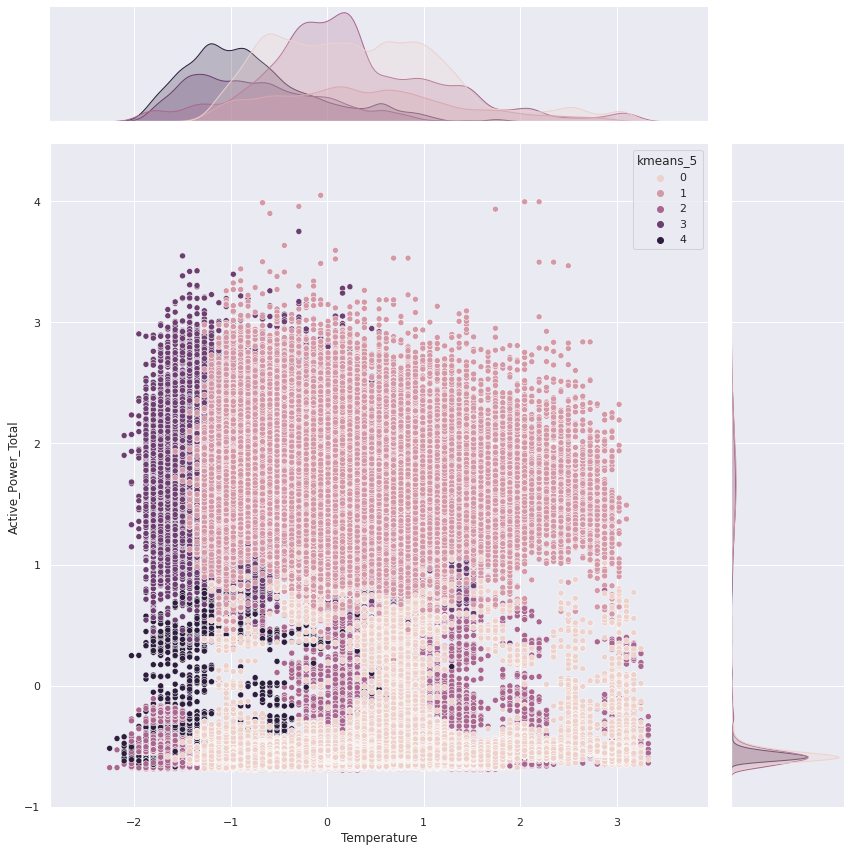

In [ ]:
plot = seaborn.jointplot(data = df_clusters , x = 'Temperature', y = 'Active_Power_Total', hue='kmeans_5', height=12)
#plot.ax_marg_x.set_xlim(39, 52)
#plot.ax_marg_y.set_ylim(0, 36)
plt.show()

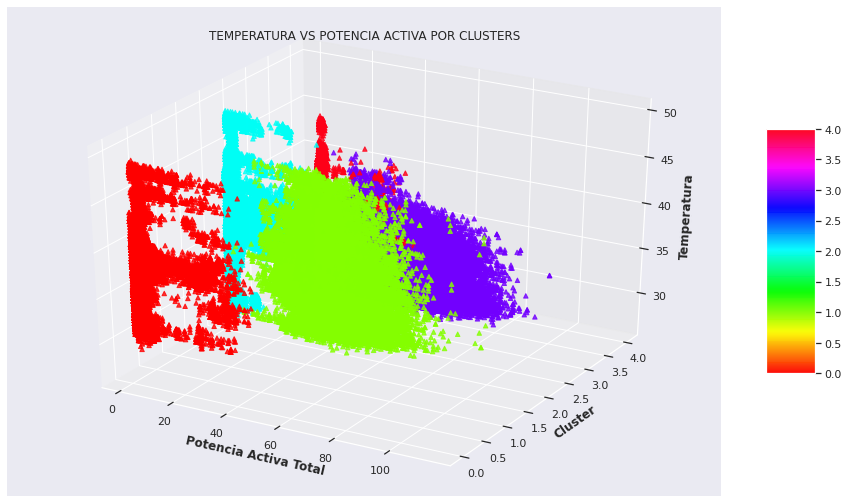

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_merged['Temperature']
x = df_merged['Active_Power_Total']
y = df_merged['kmeans_5']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("TEMPERATURA VS POTENCIA ACTIVA POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Temperatura', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

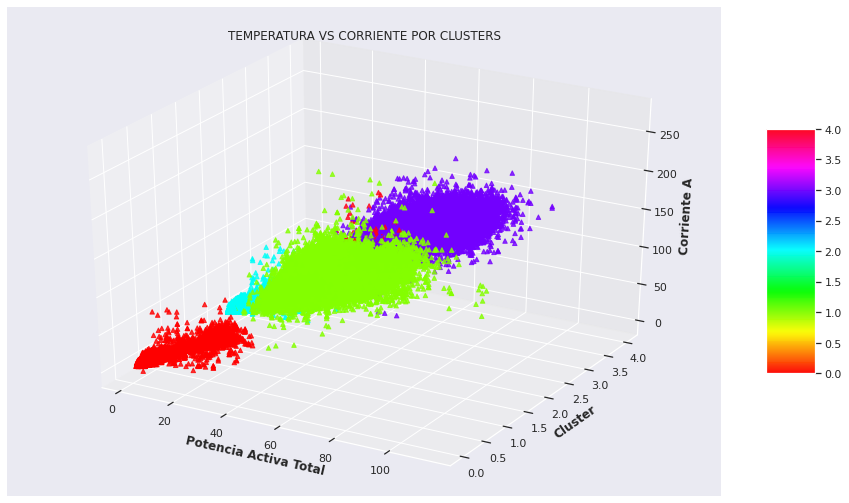

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_merged['Current_A']
x = df_merged['Active_Power_Total']
y = df_merged['kmeans_5']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("TEMPERATURA VS CORRIENTE POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Corriente A', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

###Visualización de Clusters por dias

####Tabla de contingencia

In [ ]:
dias_ordenados = ['Monday', 'Tuesday', 'Wednesday','Thursday','Friday','Saturday', 'Sunday']

df_merged.day_of_week = pandas.Categorical(df_merged.day_of_week, dias_ordenados)

In [ ]:
round(pandas.crosstab(df_merged.kmeans_5,df_merged.day_of_week,margins=True, normalize=True),2)

day_of_week,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,All
kmeans_5,,,,,,,,
0,0.04,0.04,0.02,0.04,0.04,0.06,0.06,0.31
1,0.02,0.03,0.02,0.02,0.02,0.00,0.00,0.12
2,0.04,0.03,0.04,0.02,0.02,0.05,0.06,0.28
3,0.02,0.02,0.02,0.02,0.02,0.00,0.00,0.12
4,0.03,0.03,0.02,0.02,0.02,0.01,0.03,0.17
All,0.16,0.16,0.13,0.13,0.13,0.13,0.16,1.00


Como se puede ver los clusters 1 y 3 tienen en cuenta los dias de la semana donde se tiene producción (Lunes a Viernes)

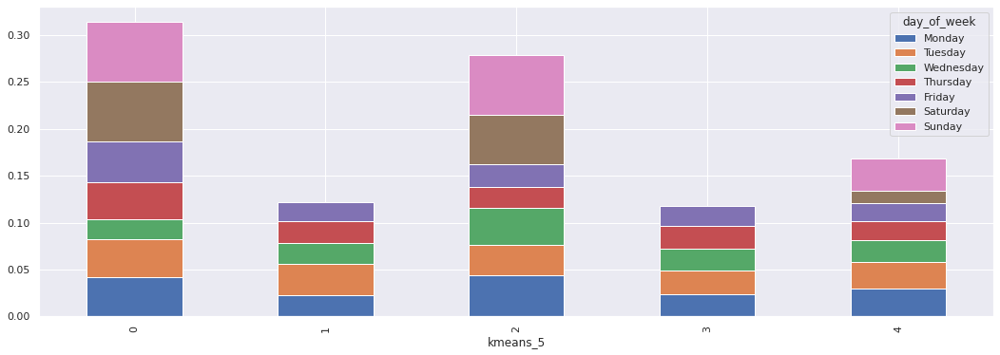

In [ ]:
pandas.crosstab(df_merged.kmeans_5,df_merged.day_of_week,margins=False, normalize=True).plot(kind='bar',stacked=True)

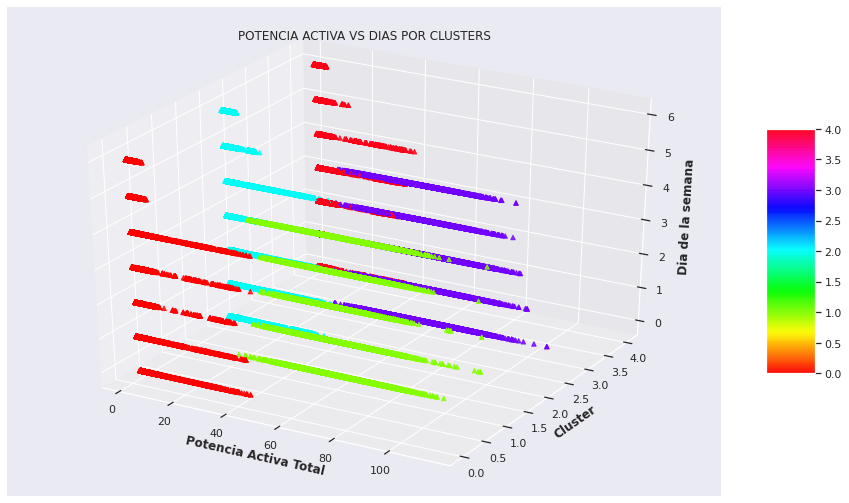

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
# Creating dataset

z = df_merged['day_number']
x = df_merged['Active_Power_Total']
y = df_merged['kmeans_5']
 
# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
   
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map
my_cmap = plt.get_cmap('hsv')
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (y ),
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("POTENCIA ACTIVA VS DIAS POR CLUSTERS")
ax.set_xlabel('Potencia Activa Total', fontweight ='bold')
ax.set_ylabel('Cluster', fontweight ='bold')
ax.set_zlabel('Dia de la semana', fontweight ='bold')
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)
 
# show plot
plt.show()

###Visualización de Clusters por horas


####Tabla de contingencia

In [ ]:
#dias_ordenados = ['Monday', 'Tuesday', 'Wednesday','Thursday','Friday','Saturday', 'Sunday']

#df_merged.day_of_week = pandas.Categorical(df_merged.day_of_week, dias_ordenados)

In [ ]:
round(pandas.crosstab(df_merged.kmeans_5,df_merged.hour,margins=True, normalize=True),2)

hour,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,All
kmeans_5,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.01,0.01,0.01,0.01,0.00,0.01,0.01,0.01,0.01,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.31
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.12
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.02,0.03,0.02,0.02,0.02,0.02,0.02,0.28
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.12
4,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.17
All,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,1.00


Podemos ver en  esta tabla que los clusters 1, 2 y 3 tienen en cuenta el rango horario de 7 a 16 hs que es el de mayor consumo.
Los clusters 0 y 4 se focalizan en los horarios de menor consumo.





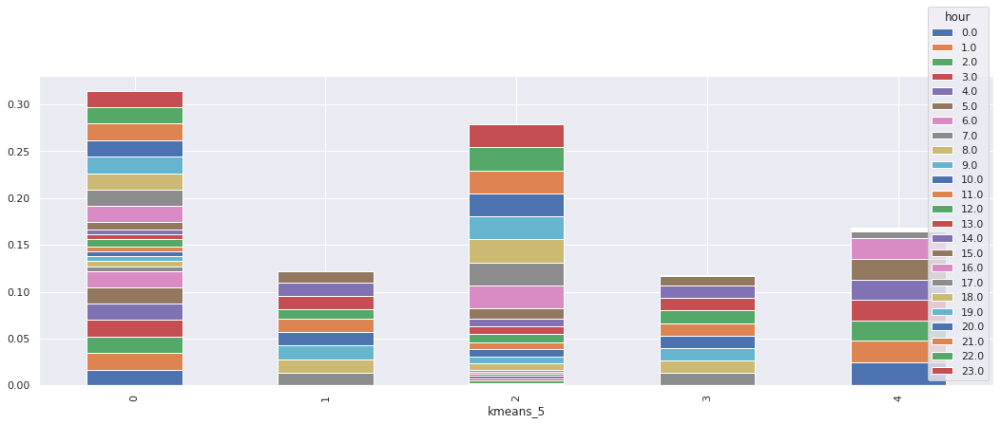

In [ ]:
pandas.crosstab(df_merged.kmeans_5,df_merged.hour,margins=False, normalize=True).plot(kind='bar',stacked=True)

# Conclusiones cuarto Entregable

Durante la ejecución de este cuarto entregable  se utilizaron herramientas de Aprendizaje No Supervisado utilizando el dataset con datos de un mes de producción.

En una primera instancia se crearon dos nuevas variables que definen el día de la semana, en formato numérico y categórico. Luego se realizó una segmentación mediante técnicas de clusterización con las diferentes variables disponibles. Para esto se utilizaron los algoritmos K-Means, con "Elbow Method" como método de optimización de número de clusters, y DBSCAN con método de optimización de epsilon por distancias.

Finalmente se realizo un análisis de los grupos obtenidos mediante visualización pares por variables y tablas de contingencia.

# CONCLUSION FINAL
Luego de muchas horas de trabajo, análisis e interpretación de datos hemos llegado al final de la mentoría de la Diplomatura. Podemos decir que ha sido un viaje de constante aprendizaje y desarrollo desde el primer día en el cual se nos presento el primer dataset con el cual íbamos a trabajar. 

Definiendo como principal objetivo lograr determinar y predecir los posibles picos de consumos que podrían incurrir en multas penalizaciones por parte de la proveedora de energía, comenzamos a familiarizarnos con los datos, eliminamos outliers y columnas que no presentaban datos relevantes para nuestro análisis y ordenamos el conjunto de datos.

Después de este primer paso resulto evidente la necesidad de relacionar los consumos con condiciones exteriores como la temperatura, para de esta forma poder identificar que cargas eran relacionadas a equipos de acondicionamiento de aire en verano e invierno. Incorporando los valores de temperaturas registrados por el Servicio Meteorológico Nacional en la ciudad de Córdoba para la misma fecha de los datos del dataset, pudimos tener los valores requeridos para identificar días de posible consumo excesivo por razones de cargas extra no relacionadas a equipos utilizados para producir los bienes que la empresa comercializa.

Ya con nuestro dataset en condiciones, comenzamos a trabajar en nuestro modelo de predicción de multas teniendo en cuenta las franjas horarias y los valores máximos que la proveedora establece. Agrupando los datos de lecturas cada 15 minutos y relacionándolos los valores de producción logramos un modelo con altos valores de Precisión (accuracy) de futuros excesos de consumos para evitar multas. 

Aplicando los algoritmos de regresión lineal aprendidos durante el desarrollo de la diplomatura, pudimos predecir la Potencia estimada demanda por la empresa. A futuro, relacionando este dato a los valores de consumo por temperatura, la empresa debería ser capaz adecuar su producción en días que, por pronósticos climáticos, las cargas de equipos de acondicionamiento de aire sean una necesidad y así evitar pagar multas por exceso de consumo. Este análisis posterior queda por fuera de los alcances de esta mentoría, pero nos deja planteados desafíos futuros con los cuales seguiremos trabajando y desarrollando nuestros conocimientos y habilidades en esta apasionante temática.

Finalmente, aplicando herramientas de aprendizaje No Supervisado realizamos tareas de Clusterizacion en dos ventanas de datos particulares definidas por consumos estivales relacionados a aumentos de producción y condiciones climáticas extremas. Se seleccionaron los meses de Noviembre 2020 y Agosto 2021 para analizar y clusterizar los datos por contener cargas de acondicionamiento de aire y aumentos de producción relacionados a festividades como el Día del Niño y Navidad.

Como corolario final, quisiéramos destacar el **constante apoyo de nuestros mentores**, quienes han sido una parte fundamental para lograr los objetivos de este trabajo. Podemos decir que ha sido un proceso de aprendizaje permanente y bidireccional, nutridos por los diversos conocimientos y aportes de cada uno de los participantes del grupo, hemos logrado aplicar las herramientas desarrolladas en la clases teóricas a un caso real de una empresa radicada en nuestra comunidad.

